<div>
<h1 style="background-color:#82e0aa   ;padding:20px;border-radius:10px;border:3px solid #3339ff;color:#21618c  ;text-align:center; font-family: Babas; font-size: 2.5em;" > Anticipation of building consumption needs in Seattle |Exploratory Data Analysis (EDA)

<img src="https://login.seattle.gov/static/media/logo.62be6fde.jpg"/></h1>
</div>

The City of Seattle's aim is to achieve carbon neutrality by 2050. To accomplish this goal, the city is focusing on the energy consumption and CO2 emissions of non-residential buildings.

Non-residential buildings, such as commercial, industrial, and institutional structures, can have a significant impact on energy consumption and greenhouse gas emissions. Here are some steps that the city could take to address this issue:

The consumption and emissions of non-residential buildings can play a significant role in the transition towards a carbon-neutral city.

In order to achieve carbon neutrality, it is important to consider additional factors identified in studies conducted by experts and researchers. These factors include:


* **Energy performance assessment:** Conduct thorough evaluations of the energy performance of non-residential buildings to identify areas where improvements can be made. This may include energy audits, energy consumption monitoring systems, and identification of inefficient equipment.

* **Promotion of energy efficiency:** mplement incentives and subsidy programs to encourage owners of non-residential buildings to adopt energy-efficient measures. This can include financial incentives for the installation of efficient heating and cooling systems, improved insulation, LED lighting, and other energy-saving technologies.

* **Use of renewable energy sources:** Encourage the adoption of renewable energy sources to power non-residential buildings. This can involve green energy purchase programs, incentives for installing solar panels or wind turbines on building rooftops, and partnerships with renewable energy providers

* **Awareness and education:** Establish awareness campaigns to inform owners of non-residential buildings about the benefits of reducing energy consumption and emissions. This can include seminars, workshops, and online resources to help them make informed decisions on implementing energy efficiency measures.

* **Regulations and standards:** Review existing regulations and consider introducing new sustainable construction standards for non-residential buildings. This may include requirements for energy efficiency, heating and cooling system performance, and the use of environmentally friendly materials.

By considering these additional factors and incorporating them into strategies and policies, cities can strengthen their efforts towards achieving carbon neutrality. It is crucial to stay informed about the latest research findings and adapt approaches accordingly to maximize the effectiveness of carbon reduction efforts.

However, achieving such a goal can be costly since it implies reporting each month the consumption and CO2 emissions of the buildings in question. To address this issue, we have at our disposal. The aim of this project is to use the existing data to predict CO2 emissions and total energy consumption for non-residential buildings where they haven't been measured yet.

This project is build on three notebook:

- **Exploratory Data Analysis**

- **Energy Consumption prediction**

- **CO2 Emissions prediction**

In this project, all the model are building by taking into account the dataleakage.

<a id="toc"></a>
# Table of Contents
<a id="toc"></a>
- [1. Import libraries and data](#IR)
    - [1.1 Import Libraries](#imp)
    - [1.2 Data reading](#dr)
- [2. Data Preprocessing](#dp)
    - [2.1 Basic information of data](#basic)
    - [2.2 Check for missing value](#missing)
    - [2.3 Features preview](#fp)
        - [2.3.1Categorical feature preview ](#cfp)
        - [2.3.2 Numeric feature preview](#nfp)
            * [(a) Inconsistent values ](#nfp)
            * [(b) Dealing with some missing values ](#dmv)
            * [(c) Handling with outliers  ](#hwo)
    - [2.3.3 Data Export](#2.3.3)
- [3. Data visualisation](#DV)
    - [3.1 Numerical features visualisation](#nfv)
        - [3.1.1 Boxplot and Histogramm](#box)
        - [3.1.2 Scatter plot](#sp)
        - [3.1.3 Distributions plot](#dp)
        - [3.1.4 Correlation analysis](#ca)
        - [3.1.5 Bar plot](#bp)
        - [3.1.6 Pie plot](#pp)
    - [3.2 Categorical Features](#2.5)
        - [3.2.1 Histogramm plot](#hp)
        - [3.2.2 Bar plot](#bar)
        - [3.2.3 Violin plot](#vp)
        - [3.2.4 Geographic visualisation](#vp)

<a id="IR"></a>

# <h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" >Import libraries and data</h1>

<a id="imp"></a>
## <span style="color:#33afff  ;"> Import libraries </span>

In [2]:
#data
import pandas as pd
import numpy as np
import missingno as msno

# Visualisation
import seaborn as sns

import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
import datapane as dp
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
pio.templates.default = "none"

import geocoder
from geopy.geocoders import Nominatim 
import folium
from folium import plugins
from folium.plugins import HeatMap
from pandas.io.json._normalize import json_normalize
import requests

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

<a id="dr"></a>
## <span style="color:#33afff  ;"> Data reading </span>

In [4]:
raw_data = pd.read_csv("https://s3.eu-west-1.amazonaws.com/course.oc-static.com/projects/Data_Scientist_P4/2016_Building_Energy_Benchmarking.csv")

<a href="#toc" role="button" aria-pressed="true" >⬆️ Back to Table of Contents ⬆️</a>

<a id="dp"></a>

# <h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" >Data Preprocessing</h1>


<a id="basic"></a>
## <span style="color:#33afff  ;">  Basic information of data </span>

In [5]:
raw_data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [6]:
raw_data.tail()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.0,153655.0000,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.0,116221.0000,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0,NaN,NaN,438.200012,460.100006,744.799988,767.799988,5.765898e+06,6.053764e+06,0.0,525251.6875,1.792159e+06,39737.390630,3.973739e+06,False,NaN,Compliant,NaN,223.54,16.99
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,1,GREATER DUWAMISH,47.52832,-122.32431,1989,1.0,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, ...",Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0,NaN,NaN,51.000000,55.500000,105.300003,110.800003,7.194712e+05,7.828413e+05,0.0,102248.0000,3.488702e+05,3706.010010,3.706010e+05,False,NaN,Compliant,NaN,22.11,1.57
3375,50226,2016,Nonresidential COS,Mixed Use Property,Van Asselt Community Center,2820 S Myrtle St,Seattle,WA,NaN,7857002030,2,GREATER DUWAMISH,47.53939,-122.29536,1938,1.0,1,18258,0,18258,"Fitness Center/Health Club/Gym, Food Service, ...",Other - Recreation,8271.0,Fitness Center/Health Club/Gym,8000.0,Pre-school/Daycare,1108.0,NaN,NaN,63.099998,70.900002,115.800003,123.900002,1.152896e+06,1.293722e+06,0.0,126774.3984,4.325542e+05,7203.419922,7.203420e+05,False,NaN,Compliant,NaN,41.27,2.26


In [7]:
display(raw_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

None

In [8]:
raw_data.dtypes.value_counts()

float64    22
object     15
int64       8
bool        1
dtype: int64

In [9]:
raw_data.nunique()

OSEBuildingID                      3376
DataYear                              1
BuildingType                          8
PrimaryPropertyType                  24
PropertyName                       3362
Address                            3354
City                                  1
State                                 1
ZipCode                              55
TaxParcelIdentificationNumber      3268
CouncilDistrictCode                   7
Neighborhood                         19
Latitude                           2876
Longitude                          2656
YearBuilt                           113
NumberofBuildings                    17
NumberofFloors                       50
PropertyGFATotal                   3195
PropertyGFAParking                  496
PropertyGFABuilding(s)             3193
ListOfAllPropertyUseTypes           466
LargestPropertyUseType               56
LargestPropertyUseTypeGFA          3122
SecondLargestPropertyUseType         50
SecondLargestPropertyUseTypeGFA    1352


<a id="missing"></a>
## <span style="color:#33afff  ;"> Check for missing value </span>

<AxesSubplot: >

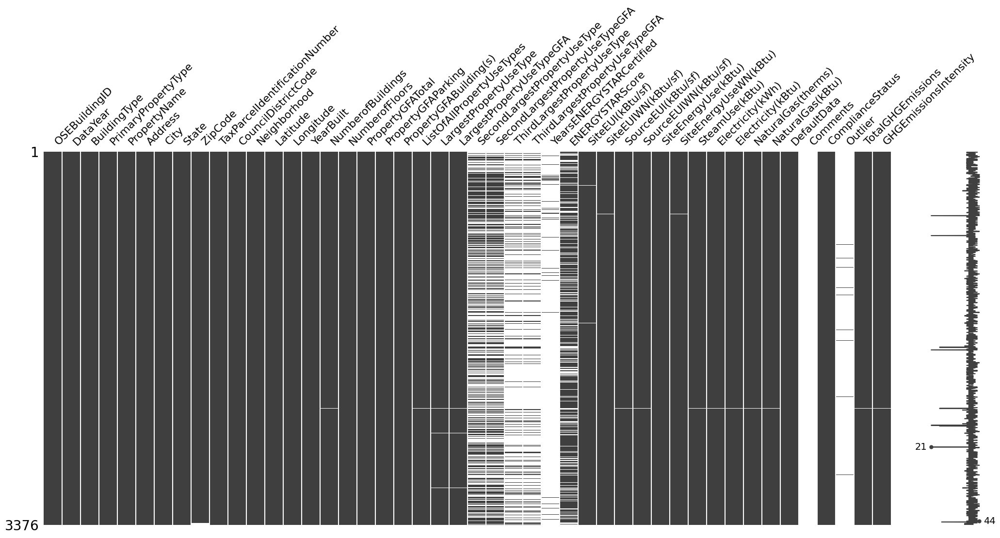

In [10]:
msno.matrix(raw_data)

As we can see in this graph, there are some features where there a lot of missing information. Before, these feature, let's see if some of them can help to clean our dataset.


<a id="fp"></a>
## <span style="color:#33afff  ;"> Features preview </span>

<a id="cfp"></a>
### <span style="color:#33afff  ;"> Categorical feature preview </span>

There's no available information for the feature named **<code>Comments</code>**. Since there nothing useful to retieve from it, it must be drop.

The feature named **<code>Outlier</code>** define *" Whether a property is a high or low outlier "*. We use it to drop some data outlier by selecting the index where our feature is Nan.

In [11]:
data = raw_data[raw_data["Outlier"].isna()]
data.shape

(3344, 46)

The <code>ComplianceStatus</code> define "*Whether a property has met energy benchmarking requirements for the current reporting year*", we can use it to exlcude all the buildings that don't met energy benchmarking requirements.

In [12]:
#Feature contains
data.ComplianceStatus.value_counts()

Compliant                       3211
Error - Correct Default Data     111
Missing Data                      15
Non-Compliant                      7
Name: ComplianceStatus, dtype: int64

In [13]:
#Selection of compliant buildings
data=data[data["ComplianceStatus"]=="Compliant"]
data.shape

(3211, 46)

As a reminder, in this project, we are working on buildings that are not intended for residential use. Therefore, we need to exclude all the residential buildings.

Let's check the buildings usage type by looking at the buildings type (**<code>BuildingType</code>**) and property type (**<code>PrimaryPropertyType</code>**).

In [14]:
data["BuildingType"].value_counts()

NonResidential          1432
Multifamily LR (1-4)     985
Multifamily MR (5-9)     570
Multifamily HR (10+)     108
Nonresidential COS        81
Campus                    24
SPS-District K-12         10
Nonresidential WA          1
Name: BuildingType, dtype: int64

In [15]:
data["PrimaryPropertyType"].value_counts()

Low-Rise Multifamily           956
Mid-Rise Multifamily           553
Small- and Mid-Sized Office    287
Other                          250
Warehouse                      185
Large Office                   169
Mixed Use Property             132
High-Rise Multifamily          103
Retail Store                    85
Hotel                           76
Worship Facility                69
Distribution Center             53
K-12 School                     50
Senior Care Community           44
Supermarket / Grocery Store     40
Medical Office                  39
Self-Storage Facility           28
University                      25
Residence Hall                  23
Refrigerated Warehouse          12
Restaurant                      12
Hospital                        10
Laboratory                      10
Name: PrimaryPropertyType, dtype: int64

In [16]:
residence_buildings = ["Multifamily LR (1-4)","Multifamily MR (5-9)", "Multifamily HR (10+)"]
residential = ["Low-Rise Multifamily", "Mid-Rise Multifamily" , 
                "High-Rise Multifamily" , "Residence Hall"]
data=data[~data["BuildingType"].isin(residence_buildings)]
data=data[~data["PrimaryPropertyType"].isin(residential)]
data.shape

(1525, 46)

In [17]:
data["Neighborhood"].value_counts()

DOWNTOWN                  348
GREATER DUWAMISH          328
MAGNOLIA / QUEEN ANNE     142
LAKE UNION                141
EAST                      114
NORTHEAST                 103
NORTHWEST                  74
BALLARD                    58
NORTH                      51
CENTRAL                    42
DELRIDGE                   36
SOUTHWEST                  31
SOUTHEAST                  31
North                       8
Ballard                     5
Delridge                    4
Northwest                   4
Central                     4
DELRIDGE NEIGHBORHOODS      1
Name: Neighborhood, dtype: int64

We can observe tha the <code>Delridge</code> is writing with different character. So let's standardise them.

In [18]:
data['Neighborhood'].replace(['Delridge','DELRIDGE NEIGHBORHOODS'], 'DELRIDGE', inplace=True)
data['Neighborhood']=data['Neighborhood'].map(lambda x: x.upper())

In [19]:
data.PrimaryPropertyType.value_counts()

Small- and Mid-Sized Office    286
Other                          245
Warehouse                      185
Large Office                   169
Mixed Use Property             113
Retail Store                    85
Hotel                           75
Worship Facility                69
Distribution Center             53
K-12 School                     50
Supermarket / Grocery Store     40
Medical Office                  39
Self-Storage Facility           28
University                      24
Senior Care Community           20
Refrigerated Warehouse          12
Restaurant                      12
Hospital                        10
Laboratory                      10
Name: PrimaryPropertyType, dtype: int64

We fill Nan values in <code>SecondLargestPropertyUseType</code> and  <code>SecondLargestPropertyUseType</code> with <code> No use</code>, <code>0</code> in <code>SecondLargestPropertyUseTypeGFA</code> and <code>ThirdLargestPropertyUseTypeGFA</code>

In [20]:
data["SecondLargestPropertyUseType"].fillna("No use", inplace=True)
data["SecondLargestPropertyUseTypeGFA"].fillna(0, inplace=True)


data["ThirdLargestPropertyUseType"].fillna("No use", inplace=True)
data["ThirdLargestPropertyUseTypeGFA"].fillna(0, inplace=True)

We can now fill <code>Nan</code> values in <code>LargestPropertyUseType</code> with  <code>PrimaryPropertyType</code> values and <code>Nan</code> values in  <code>LargestPropertyUseTypeGFA</code> with <code>PropertyGFABuilding(s)</code> values.

In [21]:
data['LargestPropertyUseType']=data['LargestPropertyUseType'].fillna(data["PrimaryPropertyType"])
data['LargestPropertyUseTypeGFA']=data['LargestPropertyUseTypeGFA'].fillna(data["PropertyGFABuilding(s)"])

<a id="nfp"></a>
### <span style="color:#33afff  ;"> Numeric feature preview </span>

<a id="nfp"></a>
#### <span style="color:#33afff  ;"> Inconsistent values </span>

First of all, let's check the inconsistent values in our datasets.

In [22]:
data.describe()

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
count,1525.000000,1525.0,1512.000000,1525.000000,1525.000000,1525.000000,1525.000000,1525.000000,1525.000000,1.525000e+03,1525.000000,1.525000e+03,1.525000e+03,1525.000000,1525.000000,977.000000,1525.000000,1524.000000,1525.000000,1525.000000,1.525000e+03,1.524000e+03,1.525000e+03,1.525000e+03,1.525000e+03,1.525000e+03,1.525000e+03,0.0,1525.000000,1525.000000
mean,16322.086557,2016.0,98116.597222,4.413115,47.616044,-122.333691,1961.629508,1.182295,4.285902,1.220568e+05,13980.720656,1.080761e+05,1.002433e+05,19998.154293,3412.181901,63.672467,75.360918,77.794095,184.046689,186.143934,8.937423e+06,8.510006e+06,5.562193e+05,1.816514e+06,6.197944e+06,2.051564e+04,2.051564e+06,NaN,195.100374,1.669285
std,13740.289718,0.0,18.181810,2.202024,0.047100,0.023314,32.825532,3.061843,6.819925,3.084621e+05,44011.964610,2.947129e+05,2.871630e+05,52707.854021,18760.796075,28.873544,75.670399,76.698604,189.111017,189.149298,3.153194e+07,2.293725e+07,5.760657e+06,6.349835e+06,2.166564e+07,9.781283e+04,9.781283e+06,NaN,784.774806,2.421542
min,1.000000,2016.0,98006.000000,1.000000,47.509590,-122.411820,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,1.400000,0.000000,0.000000,-2.100000,5.713320e+04,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,NaN,-0.800000,-0.020000
25%,599.000000,2016.0,98104.000000,2.000000,47.587160,-122.343180,1930.000000,1.000000,1.000000,2.892000e+04,0.000000,2.803200e+04,2.518400e+04,0.000000,0.000000,44.000000,35.000000,37.099998,81.199997,84.000000,1.245188e+06,1.315012e+06,0.000000e+00,2.143257e+05,7.312790e+05,0.000000e+00,0.000000e+00,NaN,20.460000,0.360000
50%,21177.000000,2016.0,98109.000000,4.000000,47.612340,-122.333250,1965.000000,1.000000,2.000000,4.828000e+04,0.000000,4.618300e+04,4.225200e+04,0.000000,0.000000,71.000000,53.700001,56.200001,139.199997,142.399994,2.735166e+06,2.825977e+06,0.000000e+00,5.127812e+05,1.749609e+06,4.768320e+03,4.768320e+05,NaN,49.620000,0.880000
75%,24598.000000,2016.0,98125.000000,7.000000,47.648220,-122.323070,1989.000000,1.000000,4.000000,1.068600e+05,0.000000,9.494800e+04,9.200000e+04,13767.000000,0.000000,88.000000,85.500000,88.350002,214.600006,216.000000,7.429423e+06,7.578339e+06,0.000000e+00,1.545909e+06,5.274641e+06,1.532059e+04,1.532059e+06,NaN,147.490000,1.950000
max,50226.000000,2016.0,98199.000000,7.000000,47.733870,-122.261800,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,639931.000000,459748.000000,100.000000,834.400024,834.400024,2620.000000,2620.000000,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,NaN,16870.980000,34.090000


The numerical features previews shows the existence of some inconsistents values in our features.

At the first sight, our potential target features (**<code>TotalGHGEmissions</code>** and **<code>GHGEmissionsIntensity</code>**) have a negative value. We need to drop them.

We can also see that we have some properties without any building. As a result, these properties need to be drop since we are working on buildings energy consumption. We drop all value of **<code>NumberofBuildings</code>** which is equal to 0.

In [23]:
data = data.drop(data[data["TotalGHGEmissions"]<0].index)
data= data[data["NumberofBuildings"]!=0]
data.shape

(1473, 46)

Now, let's check again if there's a new inconsistent value in our dataset.

In [24]:
data.describe()

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
count,1473.000000,1473.0,1460.000000,1473.000000,1473.000000,1473.000000,1473.000000,1473.000000,1473.000000,1.473000e+03,1473.000000,1.473000e+03,1.473000e+03,1473.000000,1473.000000,953.000000,1473.000000,1472.000000,1473.000000,1473.000000,1.473000e+03,1.472000e+03,1.473000e+03,1.473000e+03,1.473000e+03,1.473000e+03,1.473000e+03,0.0,1473.000000,1473.000000
mean,16269.695180,2016.0,98116.545890,4.414800,47.616076,-122.333613,1961.618466,1.223354,4.308215,1.221808e+05,14121.687033,1.080591e+05,1.005678e+05,19871.196400,3205.624167,63.837356,74.577461,76.984919,182.729260,184.776443,8.928570e+06,8.478406e+06,5.650510e+05,1.816913e+06,6.199308e+06,2.027840e+04,2.027840e+06,NaN,194.531589,1.641168
std,13669.142245,0.0,18.250296,2.200166,0.047204,0.023384,32.785468,3.107398,6.894196,3.114928e+05,44369.447067,2.975185e+05,2.908676e+05,52318.069422,18000.740067,28.874216,74.235079,75.275842,188.822933,188.873267,3.197002e+07,2.317691e+07,5.847511e+06,6.432865e+06,2.194894e+07,9.913476e+04,9.913476e+06,NaN,795.920684,2.339131
min,1.000000,2016.0,98006.000000,1.000000,47.509590,-122.411820,1900.000000,1.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,1.400000,0.000000,0.000000,0.000000,5.713320e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.000000,0.000000
25%,600.000000,2016.0,98104.000000,2.000000,47.586860,-122.342930,1930.000000,1.000000,1.000000,2.884100e+04,0.000000,2.793800e+04,2.509600e+04,0.000000,0.000000,44.000000,34.900002,37.000000,81.000000,83.500000,1.228114e+06,1.294392e+06,0.000000e+00,2.120948e+05,7.236670e+05,0.000000e+00,0.000000e+00,NaN,20.180000,0.350000
50%,21150.000000,2016.0,98109.000000,4.000000,47.612360,-122.333180,1965.000000,1.000000,2.000000,4.802000e+04,0.000000,4.598000e+04,4.212800e+04,0.000000,0.000000,71.000000,53.500000,56.099998,138.600006,141.300003,2.701872e+06,2.807050e+06,0.000000e+00,4.982355e+05,1.699980e+06,4.595080e+03,4.595080e+05,NaN,49.280000,0.880000
75%,24563.000000,2016.0,98125.000000,7.000000,47.648490,-122.323070,1988.000000,1.000000,4.000000,1.068600e+05,0.000000,9.450000e+04,9.128100e+04,13780.000000,0.000000,89.000000,84.699997,87.699997,211.399994,213.500000,7.429423e+06,7.578339e+06,0.000000e+00,1.554457e+06,5.303806e+06,1.475252e+04,1.475252e+06,NaN,146.930000,1.950000
max,50226.000000,2016.0,98199.000000,7.000000,47.733870,-122.261800,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,639931.000000,459748.000000,100.000000,834.400024,834.400024,2620.000000,2620.000000,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,NaN,16870.980000,34.090000


<a id="dmv"></a>
#### <span style="color:#33afff  ;"> Dealing with some missing values </span>

Let's visualise le missing values in ur datasets

<AxesSubplot: >

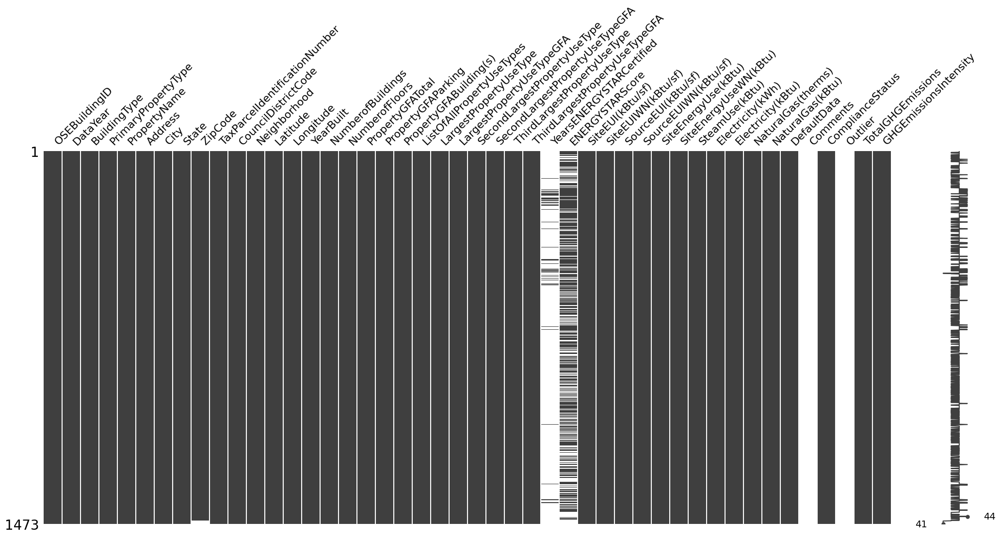

In [25]:
msno.matrix(data)

As we can see, we have some variable which have a lot of missing value such as <code>Comments</code> and <code>YearsENERGYSTARCertified</code>. We filter them by droping all the features that have more than 90% of missing value.

In [26]:
data = data.loc[:, data.isnull().mean()*100 < 90]
data.shape

(1473, 43)

There is still some unecassary features because of there unique value.
Let's identified them and drop them.

In [27]:
data.nunique().sort_values(ascending=True)

DataYear                              1
ComplianceStatus                      1
DefaultData                           1
City                                  1
State                                 1
BuildingType                          5
CouncilDistrictCode                   7
Neighborhood                         13
NumberofBuildings                    15
PrimaryPropertyType                  19
ThirdLargestPropertyUseType          38
NumberofFloors                       45
ZipCode                              47
SecondLargestPropertyUseType         48
LargestPropertyUseType               53
ENERGYSTARScore                     100
SteamUse(kBtu)                      110
YearBuilt                           113
ThirdLargestPropertyUseTypeGFA      284
PropertyGFAParking                  311
ListOfAllPropertyUseTypes           349
GHGEmissionsIntensity               444
SecondLargestPropertyUseTypeGFA     665
SiteEUI(kBtu/sf)                    908
SiteEUIWN(kBtu/sf)                  927


We **<code>DataYear</code>** could be necassary in the next step of our data mining, so we keep it. We drop all other features where the unique value is 1.

The the categorical features do not give us any grouped information, is not necessary for our project. In this case, the features like <code>OSEBuildingID </code>, <code>Address </code>, <code>TaxParcelIdentificationNumber</code> and <code> PropertyName </code> must be drop from our dataset.

We drop also the features which don't give us a relevant information for project.

In [28]:
column_to_drop=["City", "State", "ComplianceStatus", "DefaultData", "OSEBuildingID", "PropertyName","TaxParcelIdentificationNumber", "Address", "ZipCode", "CouncilDistrictCode"]
data = data.drop(columns=column_to_drop)
data.shape

(1473, 33)

Since the energy consumption and CO2 emissions depend on the building age, let's create a new feature named <code>BuildingAge</code> which will these ages.

In [29]:
data["BuildingAge"] = data["DataYear"] - data["YearBuilt"]

We can drop now the feature named <code>DataYear</code>.

In [30]:
data=data.drop(columns=["DataYear"])

<a id="hwo"></a>
#### <span style="color:#33afff  ;">Handling with outliers </span>

Let's check if there's still some outliers in our data by visualising our potentials targets features.

<AxesSubplot: >

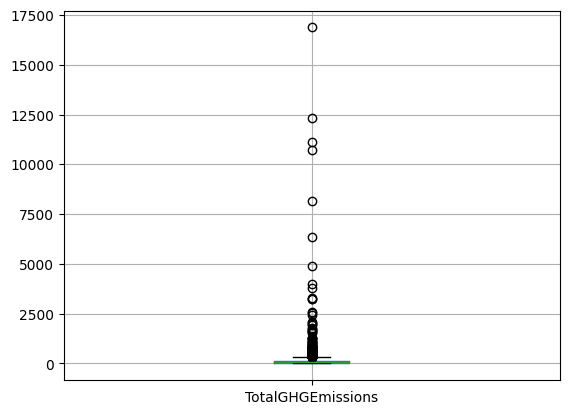

In [31]:
data[["TotalGHGEmissions"]].boxplot()

<AxesSubplot: >

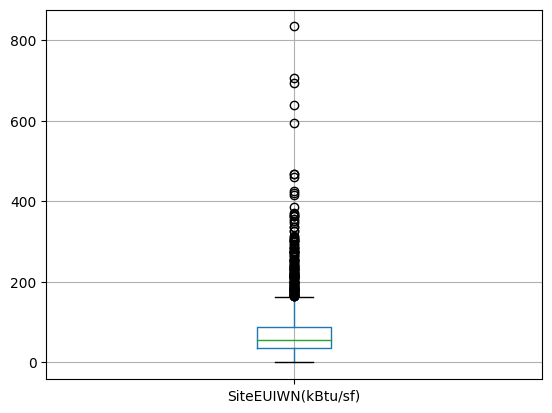

In [32]:
data[["SiteEUIWN(kBtu/sf)"]].boxplot()

<AxesSubplot: xlabel='SiteEUIWN(kBtu/sf)', ylabel='GHGEmissionsIntensity'>

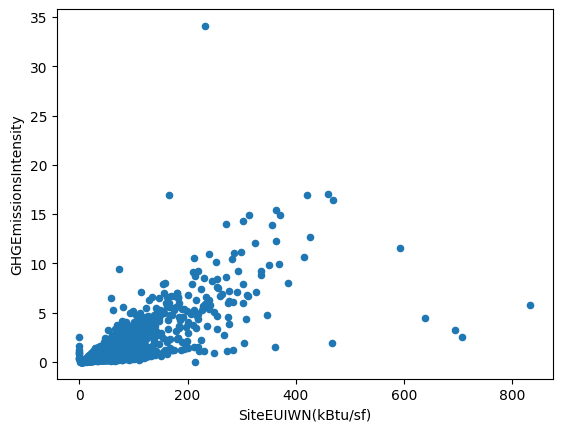

In [33]:
data.plot(kind="scatter", y="GHGEmissionsIntensity", x="SiteEUIWN(kBtu/sf)")

array([[<AxesSubplot: title={'center': 'TotalGHGEmissions'}>,
        <AxesSubplot: title={'center': 'GHGEmissionsIntensity'}>],
       [<AxesSubplot: title={'center': 'SiteEUIWN(kBtu/sf)'}>,
        <AxesSubplot: title={'center': 'SiteEnergyUseWN(kBtu)'}>]],
      dtype=object)

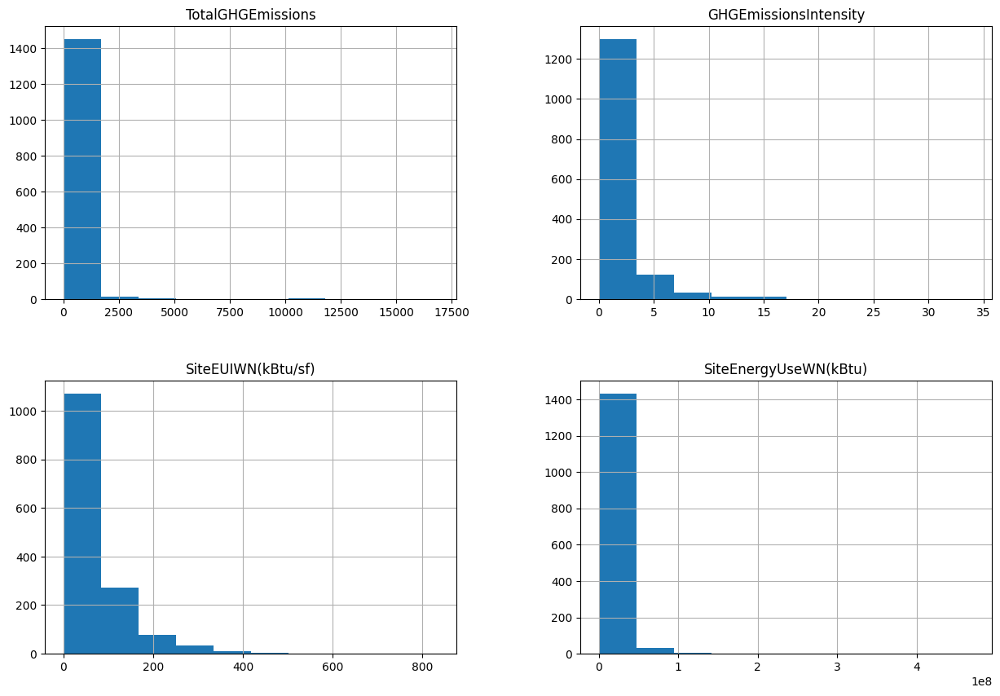

In [34]:
data[["TotalGHGEmissions", "GHGEmissionsIntensity", "SiteEUIWN(kBtu/sf)", "SiteEnergyUseWN(kBtu)"]].hist(figsize=(15,10))

The first visualisation of our data  show that our dataset still content outliers. 

Let's identify them on potentials target features and drop them. We use Inter Quartile Range method to deal with outliers.

In [35]:
def IQR_outliers(data, columns_of_interest):

    df=data.copy()
    for col in df[columns_of_interest].select_dtypes(include="number").columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3-Q1
        print("Inter Quartile Range for {} is {}".format(col, IQR))
        df=df[~((df[col]<(Q1-1.5*IQR))| (df[col]>(Q3+1.5*IQR)))].reset_index(drop=True)
    
        
    return df

In [36]:
def SIQR_outliers(data, columns_of_interest):

    df=data.copy()
    for col in df[columns_of_interest].select_dtypes(include="number").columns:
        Q1 = df[col].quantile(0.25)
        Q2 = df[col].quantile(0.50)
        Q3 = df[col].quantile(0.75)
        df = df[~((df[col]<(Q2-3*(Q2-Q1))) | (df[col]>(Q2+3*(Q3-Q2))))]
        #Q1 = df[col].quantile(0.25)
        #Q3 = df[col].quantile(0.75)
        #SIQR = Q3-Q1
        #print("Semi Inter Quartile Range for {} is {}".format(col, IQR))
        #df=df[~((df[col]<(Q1-1.5*IQR))| (df[col]>(Q3+1.5*IQR)))].reset_index(drop=True)

    return df

In [37]:

target_columns=["SiteEnergyUseWN(kBtu)", "TotalGHGEmissions"]
df = IQR_outliers(data, target_columns)
df.shape

Inter Quartile Range for SiteEnergyUseWN(kBtu) is 6283946.84375
Inter Quartile Range for TotalGHGEmissions is 80.4


(1186, 33)


<a id="dp"></a>

# <h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" >Features Enginering</h1>

<a id="fp"></a>
## <span style="color:#33afff  ;"> Categorical Features </span>

In [38]:
df["PrimaryPropertyType"].value_counts()

Small- and Mid-Sized Office    270
Warehouse                      177
Other                          174
Large Office                    93
Mixed Use Property              84
Retail Store                    73
Worship Facility                67
Distribution Center             50
K-12 School                     44
Hotel                           39
Self-Storage Facility           28
Medical Office                  25
Supermarket / Grocery Store     17
University                      15
Senior Care Community           11
Refrigerated Warehouse          10
Restaurant                       8
Laboratory                       1
Name: PrimaryPropertyType, dtype: int64

After the outlier cleaning, it appears that the Laboratory have only 1 observation. We add it in other category.

In [39]:
df["PrimaryPropertyType"].replace("Laboratory", 'Other', inplace=True)

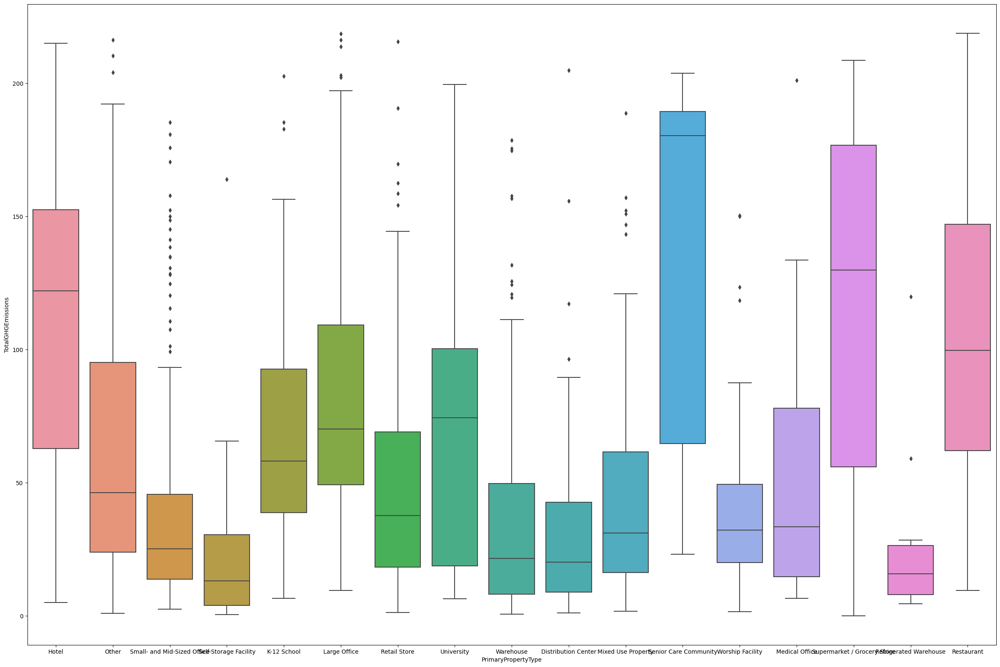

In [40]:
plt.figure(figsize=(30, 20))
sns.boxplot(data=df, x= 'PrimaryPropertyType', y='TotalGHGEmissions', dodge=True)
plt.show()

In [41]:
df['PrimaryPropertyType'].replace(["Refrigerated Warehouse", "Distribution Center", "Self-Storage Facility"], 'Warehouse', inplace=True)
df['PrimaryPropertyType'].replace(["Restaurant", "Hotel", "Restaurant"], 'Leisure', inplace=True)
df['PrimaryPropertyType'].replace(["University", "K-12 School"], 'Education', inplace=True)
df['PrimaryPropertyType'].replace(["Senior Care Community", "Medical Office"], 'Care/Health', inplace=True)

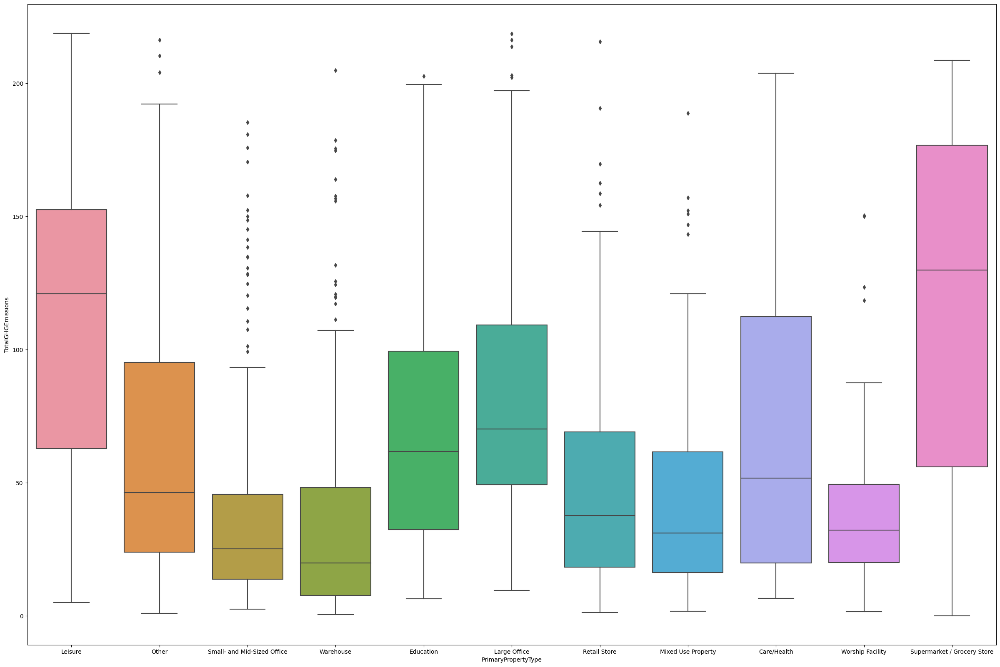

In [42]:
plt.figure(figsize=(30, 20))
sns.boxplot(data=df, x= 'PrimaryPropertyType', y='TotalGHGEmissions', dodge=True)
plt.show()

In [43]:
df["PrimaryPropertyType"].value_counts()

Small- and Mid-Sized Office    270
Warehouse                      265
Other                          175
Large Office                    93
Mixed Use Property              84
Retail Store                    73
Worship Facility                67
Education                       59
Leisure                         47
Care/Health                     36
Supermarket / Grocery Store     17
Name: PrimaryPropertyType, dtype: int64

In [44]:
df["LargestPropertyUseType"].value_counts()

Office                                                  386
Non-Refrigerated Warehouse                              188
Retail Store                                             80
Other                                                    69
Worship Facility                                         67
Distribution Center                                      51
K-12 School                                              44
Hotel                                                    39
Self-Storage Facility                                    28
Medical Office                                           26
Parking                                                  20
Other - Recreation                                       19
Supermarket/Grocery Store                                19
College/University                                       15
Other - Entertainment/Public Assembly                    13
Senior Care Community                                    11
Refrigerated Warehouse                  

In [45]:
#df['LargestPropertyUseType'].replace([ "Performing Arts", "Other - Recreation"], 'Arts/Other Recreation', inplace=True)
df['LargestPropertyUseType'].replace([ "Fire Station", "Other - Public Services", "Other - Utility", "Prison/Incarceration"], 'Arts/Other Recreation', inplace=True)
df['LargestPropertyUseType'].replace([ "Residential Care Facility", "Urgent Care/Clinic/Other Outpatient", "Other/Specialty Hospital", "Personal Services (Health/Beauty, Dry Cleaning, etc)", "Fitness Center/Health Club/Gym"], 'Care', inplace=True)
df['LargestPropertyUseType'].replace([ "Small- and Mid-Sized Office"], 'Office', inplace=True)
df['LargestPropertyUseType'].replace([ "Movie Theater", "Performing Arts","Arts/Other Recreation", "Social/Meeting Hall", "Museum", "Other - Recreation"], 'Culture/Arts/Recreation', inplace=True)
df['LargestPropertyUseType'].replace([ "Bank Branch", "Financial Office"], 'Finance', inplace=True)
df['LargestPropertyUseType'].replace([ "Other - Education", "Pre-school/Daycare", "Adult Education"], 'Other Education', inplace=True)
df['LargestPropertyUseType'].replace([ "Other - Restaurant/Bar"], 'Restaurant', inplace=True)
df['LargestPropertyUseType'].replace([ "Strip Mall", "Other - Mall"], 'Mall', inplace=True)

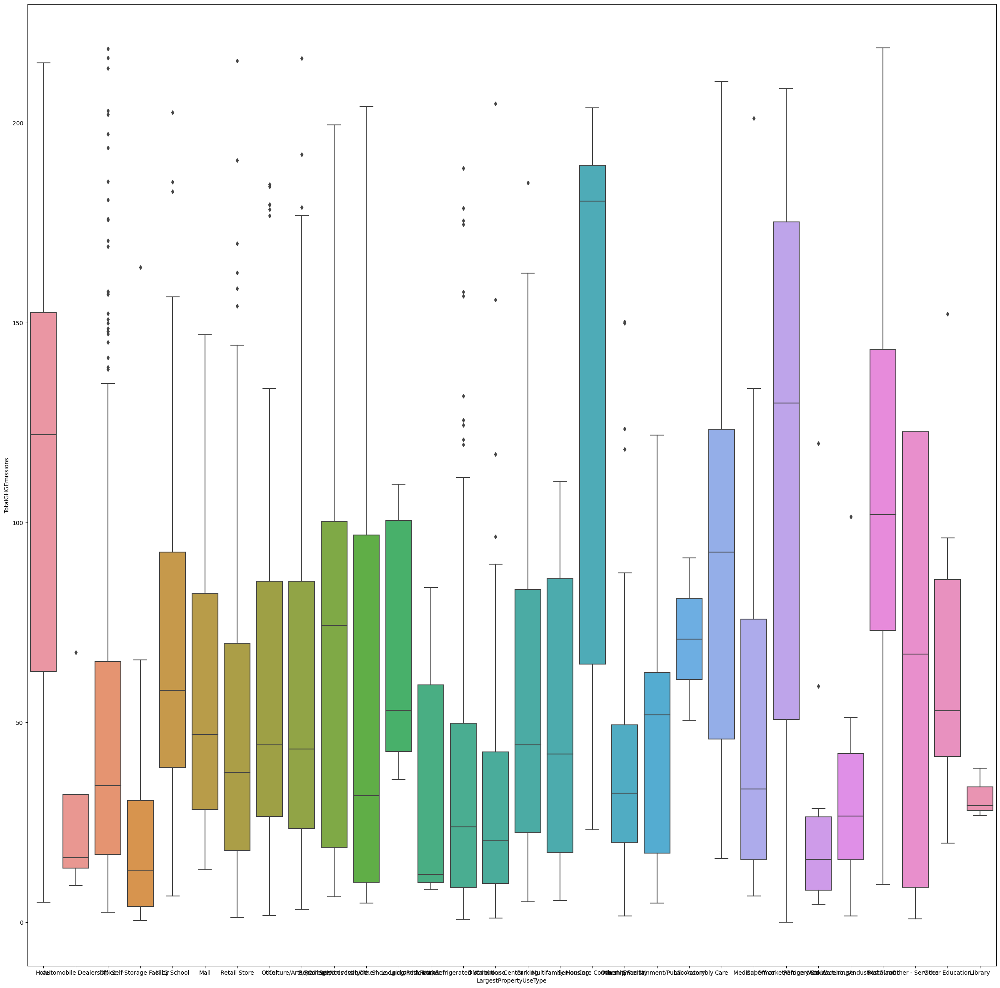

In [46]:
plt.figure(figsize=(30, 30))
sns.boxplot(data=df, x= 'LargestPropertyUseType', y='TotalGHGEmissions', dodge=True)
plt.show()

In [47]:
df['LargestPropertyUseType'].replace([ 'Mall',"Library"], 'Retail Store', inplace=True)
df['LargestPropertyUseType'].replace([ "Non-Refrigerated Warehouse", "Distribution Center"], 'Distribution Center/ Warehouse', inplace=True)
df['LargestPropertyUseType'].replace([ "Hotel", "Office"], 'Office/Hotel', inplace=True)

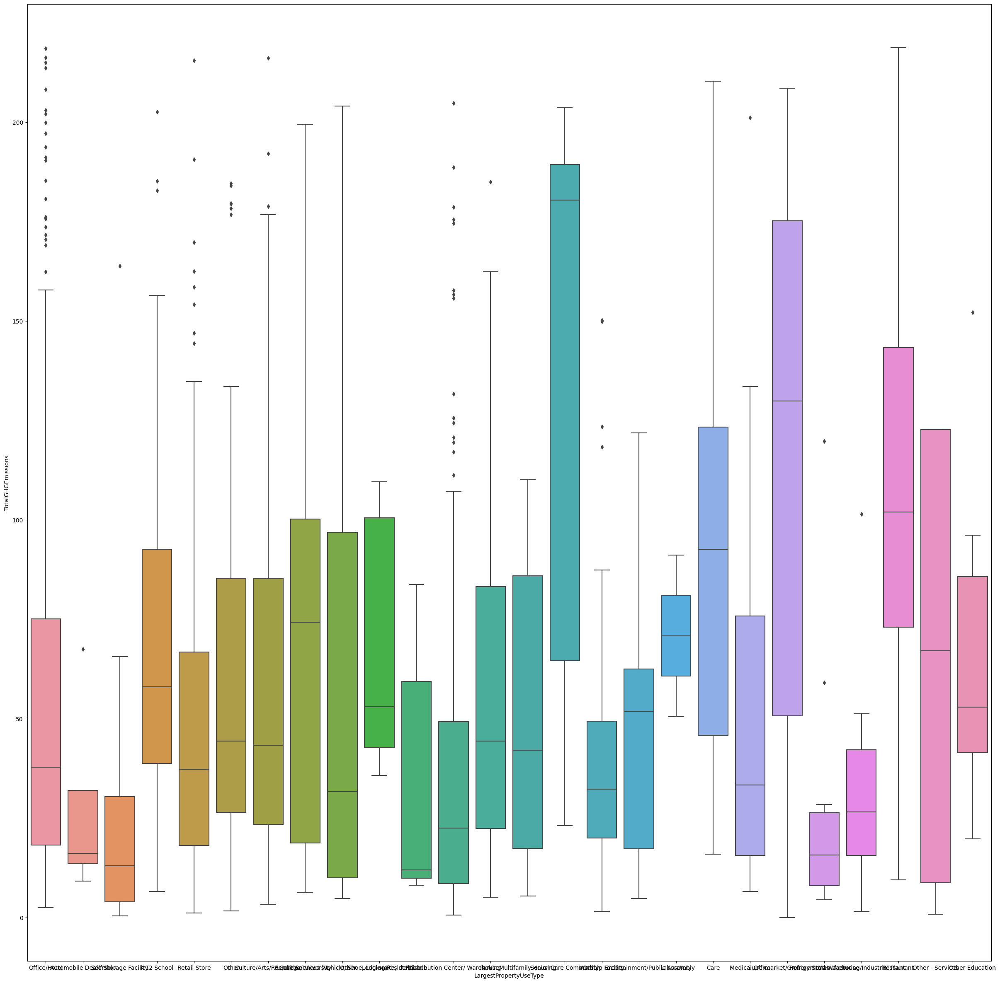

In [48]:
plt.figure(figsize=(30, 30))
sns.boxplot(data=df, x= 'LargestPropertyUseType', y='TotalGHGEmissions', dodge=True)
plt.show()

In [49]:
df['LargestPropertyUseType'].replace([ 'Retail Store',"Other", "Laboratory" ,'Culture/Arts/Recreation'], 'RetailStore/Culture/Other', inplace=True)
df['LargestPropertyUseType'].replace([ "Automobile Dealership", "Repair Services (Vehicle, Shoe, Locksmith, etc)"], 'Automobile', inplace=True)
df['LargestPropertyUseType'].replace([ "Manufacturing/Industrial Plant", "Other - Services"], 'Industry/Other Service', inplace=True)
df['LargestPropertyUseType'].replace([ "Other - Lodging/Residential", "Refrigerated Warehouse"], 'Lodge/RefrigeratedWarahouse', inplace=True)
df['LargestPropertyUseType'].replace([ "Other Education", "Other - Entertainment/Public Assembly"], 'Other Public Place', inplace=True)

In [50]:

X = df[['LargestPropertyUseType']].dropna()
#X = X[:16600]
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1186 entries, 0 to 1185
Data columns (total 1 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   LargestPropertyUseType  1186 non-null   object
dtypes: object(1)
memory usage: 9.4+ KB


In [51]:
df.columns

Index(['BuildingType', 'PrimaryPropertyType', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'BuildingAge'],
      dtype='object')

In [52]:

df=df[df["LargestPropertyUseType"]!="Multifamily Housing"]

In [53]:
df["SecondLargestPropertyUseType"].value_counts()

No use                                                  567
Parking                                                 210
Office                                                  142
Retail Store                                             68
Other                                                    33
Non-Refrigerated Warehouse                               27
Restaurant                                               21
Fitness Center/Health Club/Gym                           10
Other - Services                                          9
Multifamily Housing                                       8
Medical Office                                            7
Bank Branch                                               7
Distribution Center                                       6
K-12 School                                               5
Data Center                                               5
Swimming Pool                                             3
Other - Public Services                 

In [54]:
df['SecondLargestPropertyUseType'].replace([ "Fire Station", "Other - Public Services", "Other - Utility", "Prison/Incarceration"], 'Arts/Other Recreation', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Residential Care Facility", "Urgent Care/Clinic/Other Outpatient", "Other/Specialty Hospital", "Personal Services (Health/Beauty, Dry Cleaning, etc)", "Fitness Center/Health Club/Gym"], 'Care', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Residence Hall/Dormitory"], 'Hotel', inplace=True)
df['SecondLargestPropertyUseType'].replace(["Bar/Nightclub", "Movie Theater", "Performing Arts","Other - Entertainment/Public Assembly", "Social/Meeting Hall","Other - Recreation"], 'Culture/Arts/Recreation', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Bank Branch", "Financial Office"], 'Finance', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Other - Education", "Pre-school/Daycare", "Vocational School", "Adult Education"], 'Other Education', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Other - Restaurant/Bar", "Food Service", "Food Sales"], 'Restaurant', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Enclosed Mall", "Other - Mall"], 'Supermarket/Grocery Store', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Manufacturing/Industrial Plant", "Other - Services"], 'Industry/Other Service', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Other - Lodging/Residential", "Refrigerated Warehouse"], 'Lodge/RefrigeratedWarahouse', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Automobile Dealership", "Repair Services (Vehicle, Shoe, Locksmith, etc)", "Convenience Store without Gas Station"], 'Automobile', inplace=True)

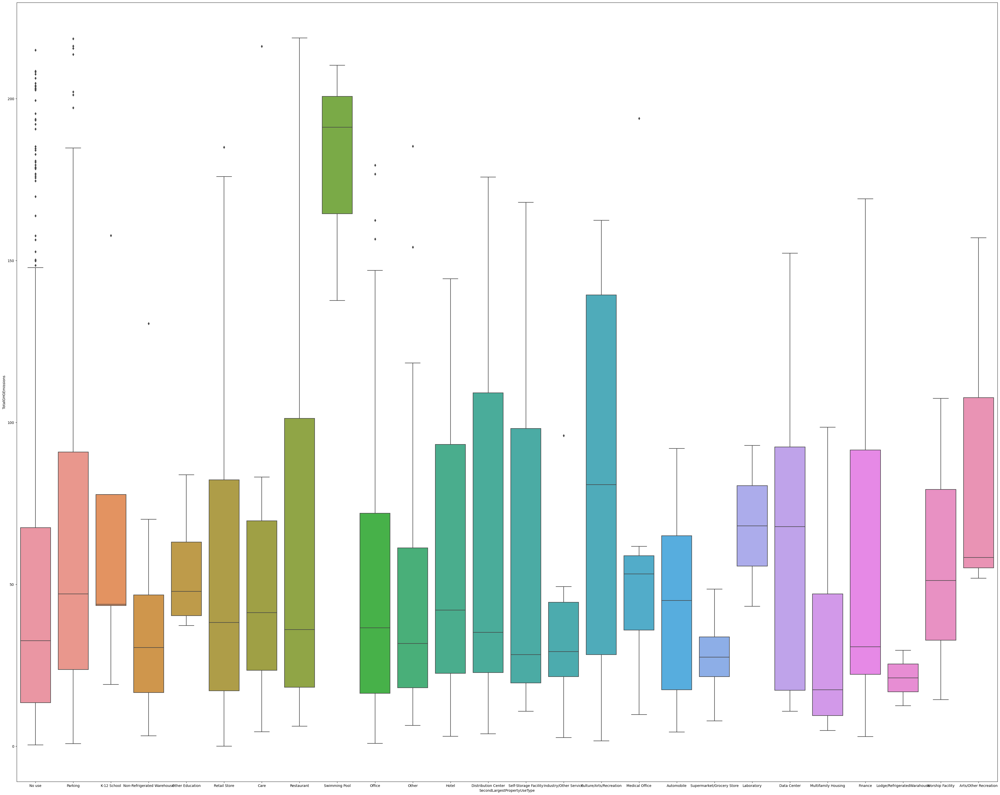

In [55]:
plt.figure(figsize=(50, 40))
sns.boxplot(data=df, x= 'SecondLargestPropertyUseType', y='TotalGHGEmissions', dodge=True)
plt.show()

In [56]:
df['SecondLargestPropertyUseType'].replace([ "Self-Storage Facility", "Supermarket/Grocery Store", "Distribution Center", "Laboratory", "Lodge/RefrigeratedWarahouse"], 'Distribution Center/Store', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Care", "Medical Office", "Distribution Center", "Swimming Pool"], 'Care', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Office", "Hotel", "Culture/Arts/Recreation"], 'Office/Hotel/Culture', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "Multifamily Housing", "Finance", "Automobile", "Arts/Other Recreation", "Worship Facility"], 'Social/Finance', inplace=True)
df['SecondLargestPropertyUseType'].replace([ "K-12 School", "Other Education", "Data Center", "Arts/Other Recreation"], 'Social/Finance', inplace=True)


In [57]:
df["SecondLargestPropertyUseType"].value_counts()

No use                        567
Parking                       210
Office/Hotel/Culture          155
Retail Store                   68
Social/Finance                 44
Other                          33
Non-Refrigerated Warehouse     27
Restaurant                     25
Care                           21
Distribution Center/Store      17
Industry/Other Service         11
Name: SecondLargestPropertyUseType, dtype: int64

In [58]:
df.columns

Index(['BuildingType', 'PrimaryPropertyType', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'BuildingAge'],
      dtype='object')

In [59]:
df["BuildingType"].value_counts()

NonResidential        1106
Nonresidential COS      56
Campus                  10
SPS-District K-12        5
Nonresidential WA        1
Name: BuildingType, dtype: int64

In [60]:
df['BuildingType'].replace(['Nonresidential WA', "Nonresidential COS"], 'Nonresidential COS-WA', inplace=True)
df['BuildingType'].replace(['Campus', "SPS-District K-12"], 'Campus/SPS', inplace=True)

In [61]:
df["Neighborhood"].value_counts()

GREATER DUWAMISH         300
DOWNTOWN                 222
MAGNOLIA / QUEEN ANNE    113
LAKE UNION               102
NORTHEAST                 83
EAST                      76
NORTHWEST                 61
BALLARD                   55
NORTH                     48
CENTRAL                   38
DELRIDGE                  32
SOUTHEAST                 24
SOUTHWEST                 24
Name: Neighborhood, dtype: int64

In [62]:
df["SecondLargestPropertyUseType"].value_counts()

No use                        567
Parking                       210
Office/Hotel/Culture          155
Retail Store                   68
Social/Finance                 44
Other                          33
Non-Refrigerated Warehouse     27
Restaurant                     25
Care                           21
Distribution Center/Store      17
Industry/Other Service         11
Name: SecondLargestPropertyUseType, dtype: int64

In [63]:
df['SecondLargestPropertyUseType'].replace(['Other - Restaurant/Bar', "Food Service", "Food Sales",  'Restaurant',  
                                            "Worship Facility", "Social/Meeting Hall",'Movie Theater', 'Other - Entertainment/Public Assembly',
                                            "Other - Recreation","Museum", "Performing Arts", "Bar/Nightclub"], "Leisure", inplace=True)

df['SecondLargestPropertyUseType'].replace(['Urgent Care/Clinic/Other Outpatient', "Other/Specialty Hospital", 'Medical Office',
                                            'Personal Services (Health/Beauty, Dry Cleaning, etc)', "Swimming Pool" ,
                                            "Fitness Center/Health Club/Gym"], "Health", inplace=True)

df['SecondLargestPropertyUseType'].replace(['Other - Mall', "Strip Mall", "Enclosed Mall", "Convenience Store without Gas Station", 
                                                "Self-Storage Facility", "Automobile Dealership", 'Library', "Laboratory", "Fire Station",
                                            "Refrigerated Warehouse", "Other - Utility", "Repair Services (Vehicle, Shoe, Locksmith, etc)", 
                                            "Manufacturing/Industrial Plant", "Non-Refrigerated Warehouse","Other - Services", "Other - Public Services",
                                            "Distribution Center", "Retail Store",'Supermarket/Grocery Store'], 'Store/Services', inplace=True)

df['SecondLargestPropertyUseType'].replace(['Financial Office', "Bank Branch", 'Office',
                                        "Small- and Mid-Sized Office "], "Office", inplace=True)

df['SecondLargestPropertyUseType'].replace(['Residential Care Facility', 'Other - Lodging/Residential', "Multifamily Housing",
                                        'Hotel','Senior Care Community', "Residence Hall/Dormitory"], 'Hotel/Care-center', inplace=True)

df['SecondLargestPropertyUseType'].replace(['Adult Education', "Other - Education","Pre-school/Daycare", 
                                             "K-12 School", "College/University",  "Vocational School"], 'Education', inplace=True)

df['SecondLargestPropertyUseType'].replace(['Data Center'], 'Other', inplace=True)

In [64]:
df["SecondLargestPropertyUseType"].value_counts()

No use                       567
Parking                      210
Office/Hotel/Culture         155
Store/Services                95
Social/Finance                44
Other                         33
Leisure                       25
Care                          21
Distribution Center/Store     17
Industry/Other Service        11
Name: SecondLargestPropertyUseType, dtype: int64

In [65]:
df["ThirdLargestPropertyUseType"].value_counts()

No use                                                  958
Office                                                   38
Retail Store                                             32
Parking                                                  28
Other                                                    21
Restaurant                                               16
Non-Refrigerated Warehouse                               12
Multifamily Housing                                      10
Data Center                                               9
Medical Office                                            6
Pre-school/Daycare                                        6
Social/Meeting Hall                                       5
Food Service                                              5
Other - Entertainment/Public Assembly                     4
Bank Branch                                               4
Fitness Center/Health Club/Gym                            3
Self-Storage Facility                   

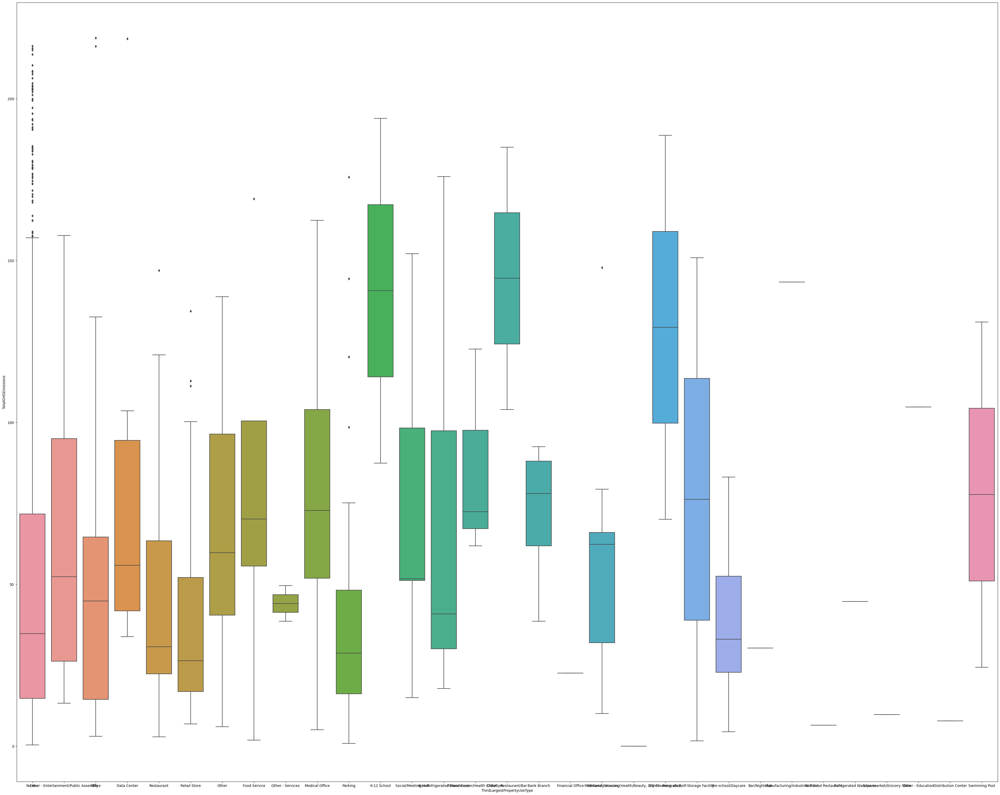

In [66]:
plt.figure(figsize=(50, 40))
sns.boxplot(data=df, x= 'ThirdLargestPropertyUseType', y='TotalGHGEmissions', dodge=True)
plt.show()

In [67]:
df['ThirdLargestPropertyUseType'].replace(['Other - Restaurant/Bar', "Food Service", "Food Sales",  'Restaurant',  "Fast Food Restaurant",
                                            "Worship Facility", "Social/Meeting Hall",'Movie Theater', 'Other - Entertainment/Public Assembly',
                                             "Museum", "Other - Recreation","Performing Arts", "Bar/Nightclub"], "Leisure", inplace=True)

df['ThirdLargestPropertyUseType'].replace(['Urgent Care/Clinic/Other Outpatient', "Other/Specialty Hospital", 'Medical Office',
                                            'Personal Services (Health/Beauty, Dry Cleaning, etc)',
                                            "Swimming Pool", "Fitness Center/Health Club/Gym"], "Health", inplace=True)

df['ThirdLargestPropertyUseType'].replace(['Other - Mall', "Strip Mall", "Enclosed Mall", "Convenience Store without Gas Station", 
                                                "Self-Storage Facility", "Automobile Dealership", 'Library', "Laboratory", "Fire Station",
                                                "Refrigerated Warehouse", "Other - Utility", "Non-Refrigerated Warehouse",
                                                "Repair Services (Vehicle, Shoe, Locksmith, etc)", "Other - Services", "Distribution Center",
                                                "Manufacturing/Industrial Plant", 'Supermarket/Grocery Store'], 'Store/Services', inplace=True)

df['ThirdLargestPropertyUseType'].replace(['Financial Office', "Bank Branch", 'Office', "Small- and Mid-Sized Office "], "Office", inplace=True)

df['ThirdLargestPropertyUseType'].replace(['Residential Care Facility', 'Other - Lodging/Residential', 
                                            'Hotel','Senior Care Community'], 'Hotel/Care-center', inplace=True)

df['ThirdLargestPropertyUseType'].replace(['Adult Education', "Other - Education","Pre-school/Daycare", 
                                            "K-12 School", "College/University" ], 'Education', inplace=True)

    
df['ThirdLargestPropertyUseType'].replace(['Data Center'], 'Other', inplace=True)

In [68]:
    
df['ThirdLargestPropertyUseType'].replace(['Health', "Multifamily Housing", "Education"], 'Social', inplace=True)

In [69]:
df["ThirdLargestPropertyUseType"].value_counts()

No use            958
Office             43
Leisure            36
Retail Store       32
Social             31
Other              30
Parking            28
Store/Services     20
Name: ThirdLargestPropertyUseType, dtype: int64

In [70]:
df["Parking"] = df["PropertyGFAParking"].apply(lambda x : True if x !=0 else False)
df["GasSource"] = df["NaturalGas(kBtu)"].apply(lambda x : True if x !=0 else False)
df["SteamSource"] = df["SteamUse(kBtu)"].apply(lambda x : True if x !=0 else False)

In [71]:
df['MainEnergy'] = df[['Electricity(kBtu)','NaturalGas(kBtu)', "SteamUse(kBtu)" ]].apply(np.argmax, axis=1)
df['MainEnergy'] = df['MainEnergy'].map({0: 'Electricity',
                                         1: 'NaturalGas',
                                         2: 'Steam'})

def parking(data):
    if data["PropertyGFAParking"] !=0:
        value = "Yes"
    else:
        value="No"
    return value

df["Parking"] = df.apply(parking, axis=1)

<a id="fp"></a>
## <span style="color:#33afff  ;"> Numerical Features </span>

In [72]:
df["ParkingGFArate"]=df["PropertyGFAParking"]*100/df["PropertyGFATotal"]

In [73]:
Proportion =df.groupby("PrimaryPropertyType")['LargestPropertyUseTypeGFA'].sum()*100/(df["PropertyGFATotal"].sum())
df["PrimaryGFAProportion"]=df["PrimaryPropertyType"].map(Proportion.to_dict())

In [74]:
df.columns

Index(['BuildingType', 'PrimaryPropertyType', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'BuildingAge', 'Parking', 'GasSource', 'SteamSource', 'MainEnergy',
       'ParkingGFArate', 'PrimaryGFAProportion'],
      dtype='object')

In [75]:
Proportion_largest =df.groupby("LargestPropertyUseType")['PropertyGFABuilding(s)'].sum()*100/(df["PropertyGFATotal"].sum())
df["LargestGFAProportion"]=df["LargestPropertyUseType"].map(Proportion_largest.to_dict())
Proportion_second =df.groupby("SecondLargestPropertyUseType")['SecondLargestPropertyUseTypeGFA'].sum()*100/(df["PropertyGFATotal"].sum())
df["SecondGFAProportion"]=df["SecondLargestPropertyUseType"].map(Proportion_second.to_dict())
Proportion_third =df.groupby("ThirdLargestPropertyUseType")['ThirdLargestPropertyUseTypeGFA'].sum()*100/(df["PropertyGFATotal"].sum())
df["ThirdGFAProportion"]=df["ThirdLargestPropertyUseType"].map(Proportion_third.to_dict())

In [76]:
df["ParkingGFArate"]=df["PropertyGFAParking"]*100/df["PropertyGFATotal"]

In [77]:
df["BuildingGFARate"]=df['PropertyGFABuilding(s)']*100/df["PropertyGFATotal"]
df["LargestGFArate"]=df['LargestPropertyUseTypeGFA']*100/df["PropertyGFATotal"]
df["SecondGFArate"]=df['SecondLargestPropertyUseTypeGFA']*100/df["PropertyGFATotal"]
df["ThirdGFArate"]=df['ThirdLargestPropertyUseTypeGFA']*100/df["PropertyGFATotal"]

def exist_gas(data):
    if data["NaturalGas(kBtu)"] !=0:
        value = "Yes"
    else:
        value="No"
    return value

df["GasSource"] = df.apply(exist_gas, axis=1)

In [78]:
df["SecondUsage"]= df["SecondLargestPropertyUseTypeGFA"].apply(lambda x : True if x !=0 else False)
df["ThirdUsage"]= df["ThirdLargestPropertyUseTypeGFA"].apply(lambda x : True if x !=0 else False)
#data["SecondUsage"]= data["ThirdLargestPropertyUseTypeGFA"].apply(lamda x : True  if pd.notnull(x) else 0)

def exist_steam(data):
    if data["SteamUse(kBtu)"] !=0:
        value = "Yes"
    else:
        value="No"
    return value

df["SteamSource"] = df.apply(exist_steam, axis=1)

In [79]:
df['GFAPerFloor'] = df['PropertyGFABuilding(s)']/(df['NumberofFloors']+1)
Proportion_building=df.groupby('NumberofBuildings')['PropertyGFABuilding(s)'].sum()*100/(df["PropertyGFATotal"].sum())
df["NumberofBuildingGFAProportion"]=df["NumberofBuildings"].map(Proportion_building.to_dict())

In [80]:
Proportion_building=df.groupby('NumberofFloors')['PropertyGFABuilding(s)'].sum()*100/(df["PropertyGFATotal"].sum())
df["NumberoffloorGFAProportion"]=df["NumberofFloors"].map(Proportion_building.to_dict())

In [81]:
Proportion_floor=df.groupby('PrimaryPropertyType')['NumberofFloors'].sum()*100/(df["NumberofFloors"].sum())
df["PrimaryPropertyTypeNumberOfFloorProportion"]=df["PrimaryPropertyType"].map(Proportion_floor.to_dict())

In [82]:
Proportion_build=df.groupby('PrimaryPropertyType')['NumberofBuildings'].sum()*100/(df["NumberofBuildings"].sum())
df["PrimaryPropertyTypeNumberOfBuildingsProportion"]=df["PrimaryPropertyType"].map(Proportion_build.to_dict())

<AxesSubplot: xlabel='PrimaryPropertyTypeNumberOfBuildingsProportion', ylabel='SiteEnergyUseWN(kBtu)'>

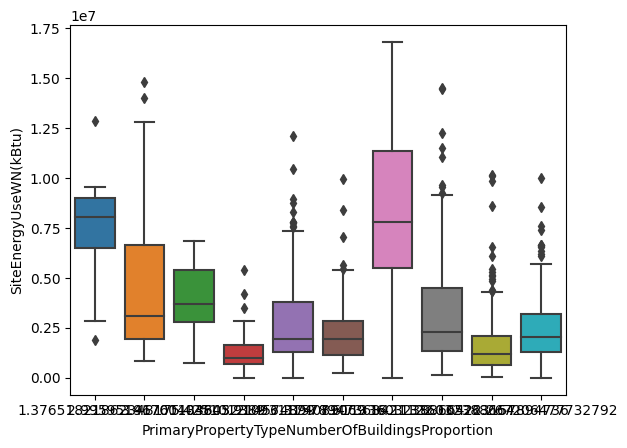

In [83]:
sns.boxplot(data=df, x= 'PrimaryPropertyTypeNumberOfBuildingsProportion', y='SiteEnergyUseWN(kBtu)', dodge=False)

In [84]:
df.columns

Index(['BuildingType', 'PrimaryPropertyType', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'BuildingAge', 'Parking', 'GasSource', 'SteamSource', 'MainEnergy',
       'ParkingGFArate', 'PrimaryGFAProportion', 'LargestGFAProportion',
       'SecondGFAProportion', 'ThirdGFAProportion', 'Buil

In [85]:
mean_age=df.groupby('PrimaryPropertyType')['BuildingAge'].mean()
df["MeanAgeByPrimaryPropertyType"]=df["PrimaryPropertyType"].map(mean_age.to_dict())
mean_age=df.groupby('LargestPropertyUseType')['BuildingAge'].mean()
df["MeanAgeByLargestPropertyUseType"]=df["LargestPropertyUseType"].map(mean_age.to_dict())

In [86]:
Height=4
df['BuildingHeight'] = ((df['NumberofFloors']+1) * Height)/df['NumberofBuildings']

In [87]:
df["MeanAgeByLargestPropertyUseType"].value_counts()

56.434272    426
56.292887    239
60.490000    200
67.746269     67
62.181818     44
59.107143     28
35.538462     26
24.800000     20
66.368421     19
36.578947     19
63.066667     15
54.800000     15
48.909091     11
34.727273     11
59.000000     11
43.600000     10
80.666667      9
56.750000      8
Name: MeanAgeByLargestPropertyUseType, dtype: int64

In [88]:
df.groupby('NumberofBuildings')['PropertyGFABuilding(s)'].head()

0        83008
1        58006
2        67224
3        52210
4        87262
30       50017
124      98055
145     111445
227     125519
280      63644
281      89893
340     114000
351      22800
431      21500
563      57310
686      31343
705      23166
710      57952
716     138907
938      28500
1065     75868
1089     27551
1151    149856
Name: PropertyGFABuilding(s), dtype: int64

In [89]:
df[[ 'NumberofBuildingGFAProportion']].value_counts()

NumberofBuildingGFAProportion
85.189948                        1150
1.184171                           14
0.411860                            6
0.349977                            5
0.231981                            2
0.098679                            1
dtype: int64

<AxesSubplot: xlabel='BuildingHeight', ylabel='SiteEnergyUseWN(kBtu)'>

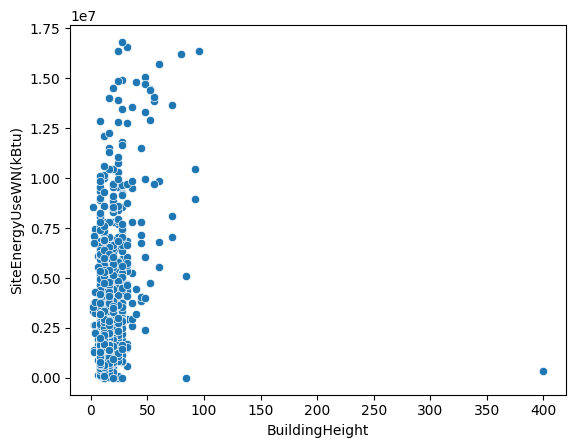

In [90]:
sns.scatterplot(data=df, x= 'BuildingHeight', y='SiteEnergyUseWN(kBtu)')

<AxesSubplot: xlabel='MeanAgeByLargestPropertyUseType', ylabel='SiteEnergyUseWN(kBtu)'>

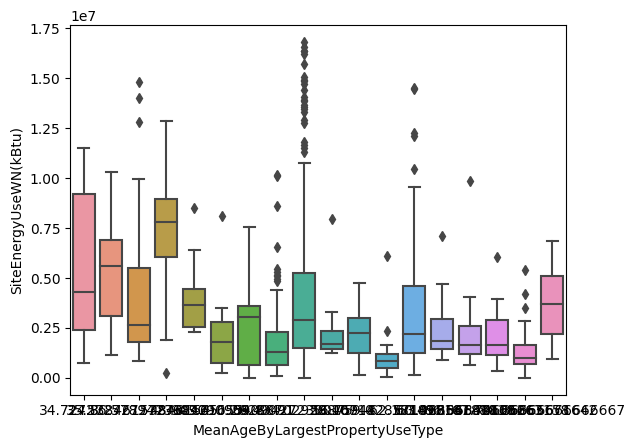

In [91]:
sns.boxplot(data=df, x= 'MeanAgeByLargestPropertyUseType', y='SiteEnergyUseWN(kBtu)', dodge=False)

In [132]:
df.columns

Index(['BuildingType', 'PrimaryPropertyType', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'BuildingAge', 'Parking', 'GasSource', 'SteamSource', 'MainEnergy',
       'ParkingGFArate', 'PrimaryGFAProportion', 'LargestGFAProportion',
       'SecondGFAProportion', 'ThirdGFAProportion', 'Buil

In [133]:
leakage=['SiteEUI(kBtu/sf)','SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)','SteamUse(kBtu)', 'Electricity(kWh)', 
          'Electricity(kBtu)', 'NaturalGas(therms)',   'NaturalGas(kBtu)']
df = df.drop(columns=leakage)
df.shape

(1178, 48)

<a id="imp"></a>
## <span style="color:#33afff  ;"> Data Export</span>

In [134]:
data = df.to_csv("data.csv", index=False)

<AxesSubplot: xlabel='SiteEnergyUseWN(kBtu)', ylabel='SecondGFArate'>

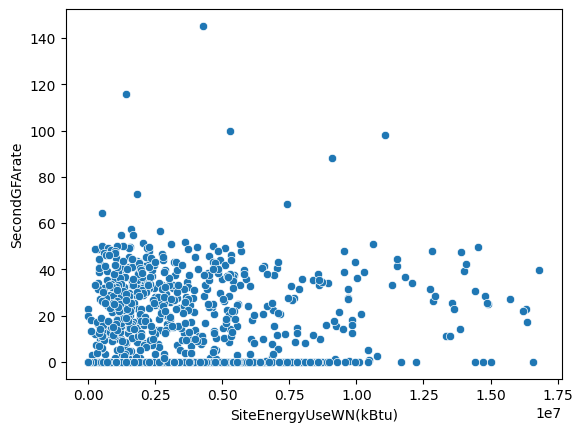

In [93]:
sns.scatterplot(data=df, x='SiteEnergyUseWN(kBtu)', y="SecondGFArate")

<AxesSubplot: xlabel='NumberofBuildings', ylabel='SiteEnergyUseWN(kBtu)'>

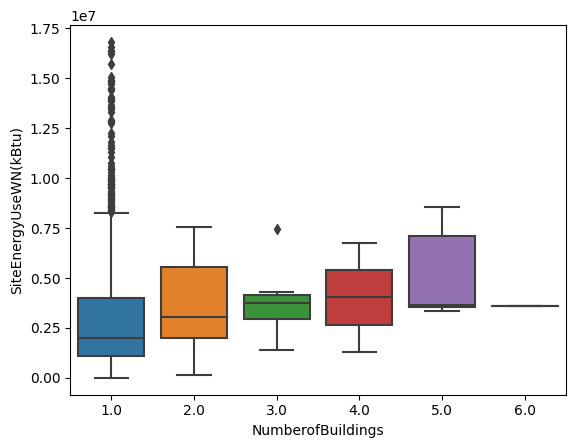

In [94]:
sns.boxplot(data=df, x= 'NumberofBuildings', y='SiteEnergyUseWN(kBtu)', dodge=False)

(array([296., 336., 180., 103.,  89.,  44.,  42.,  24.,  21.,   9.,   7.,
          5.,  10.,   5.,   6.]),
 array([       0. ,  1120723.6,  2241447.2,  3362170.8,  4482894.4,
         5603618. ,  6724341.6,  7845065.2,  8965788.8, 10086512.4,
        11207236. , 12327959.6, 13448683.2, 14569406.8, 15690130.4,
        16810854. ]),
 <BarContainer object of 15 artists>)

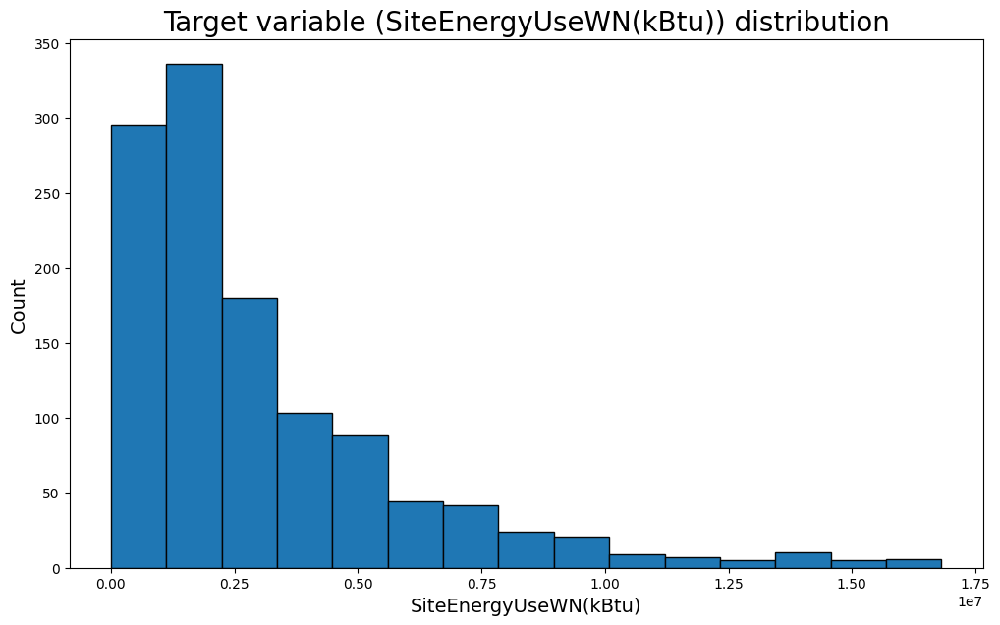

In [95]:
plt.figure(figsize=(12, 7))
plt.title('Target variable (SiteEnergyUseWN(kBtu)) distribution', 
size=20)
plt.xlabel('SiteEnergyUseWN(kBtu)', size=14)
plt.ylabel('Count', size=14)
plt.hist(df['SiteEnergyUseWN(kBtu)'], bins=15,  ec='#040404')

(array([695., 124., 129., 118.,  79.,  25.,   1.,   2.,   0.,   1.,   2.,
          1.,   0.,   0.,   1.]),
 array([  0.        ,   9.68036113,  19.36072227,  29.0410834 ,
         38.72144453,  48.40180566,  58.0821668 ,  67.76252793,
         77.44288906,  87.12325019,  96.80361133, 106.48397246,
        116.16433359, 125.84469472, 135.52505586, 145.20541699]),
 <BarContainer object of 15 artists>)

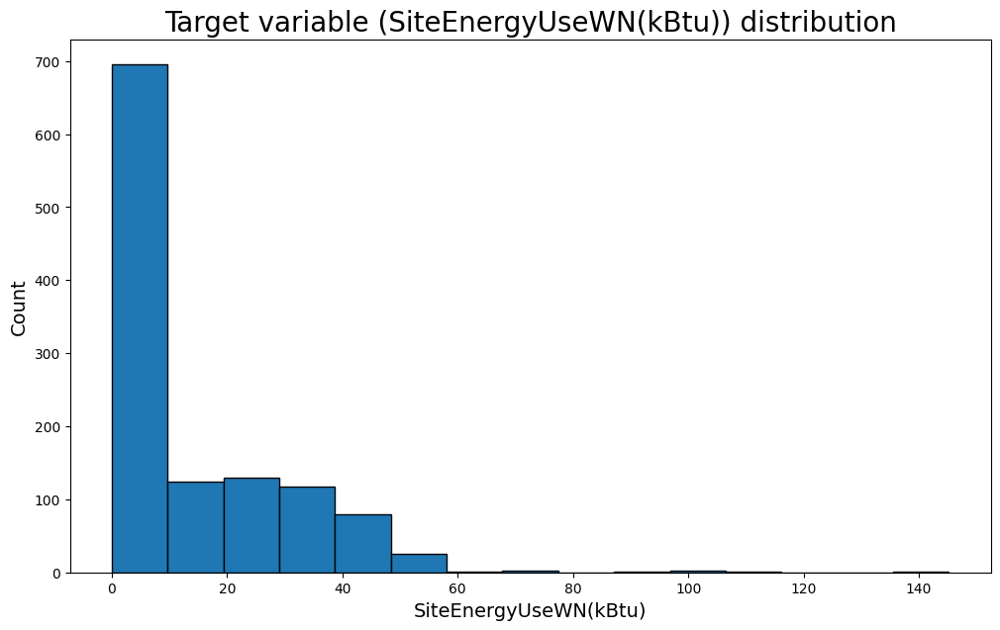

In [96]:
plt.figure(figsize=(12, 7))
plt.title('Target variable (SiteEnergyUseWN(kBtu)) distribution', 
size=20)
plt.xlabel('SiteEnergyUseWN(kBtu)', size=14)
plt.ylabel('Count', size=14)
plt.hist(df['SecondGFArate'], bins=15,  ec='#040404')

<AxesSubplot: xlabel='SecondGFArate', ylabel='SiteEnergyUseWN(kBtu)'>

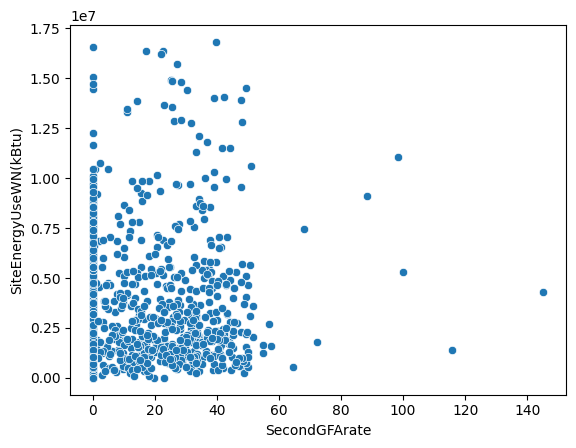

In [97]:
sns.scatterplot(data=df, x= 'SecondGFArate', y='SiteEnergyUseWN(kBtu)')

<AxesSubplot: xlabel='PrimaryPropertyType', ylabel='SiteEnergyUseWN(kBtu)'>

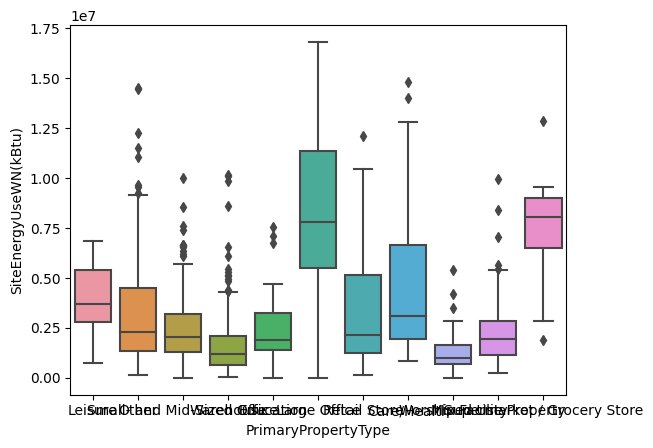

In [98]:
sns.boxplot(data=df, x= 'PrimaryPropertyType', y='SiteEnergyUseWN(kBtu)', dodge=False)

<AxesSubplot: xlabel='Parking', ylabel='TotalGHGEmissions'>

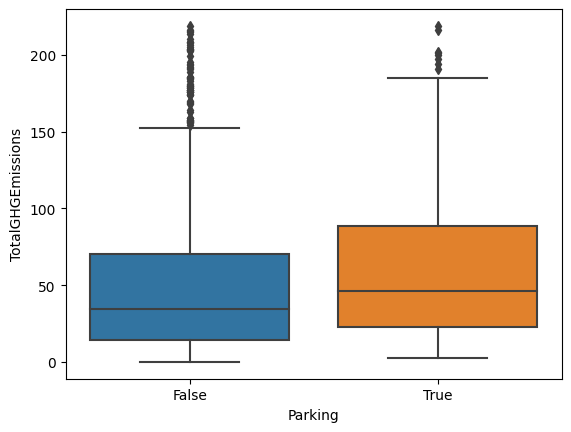

In [99]:
sns.boxplot(data=df, x= 'Parking', y='TotalGHGEmissions', dodge=False)

In [100]:
df.columns

Index(['BuildingType', 'PrimaryPropertyType', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'BuildingAge', 'Parking', 'GasSource', 'SteamSource', 'MainEnergy',
       'ParkingGFArate', 'PrimaryGFAProportion', 'LargestGFAProportion',
       'SecondGFAProportion', 'ThirdGFAProportion', 'Buil

(array([277., 213., 184., 116.,  90.,  58.,  56.,  31.,  40.,  20.,  26.,
         13.,  23.,  18.,  13.]),
 array([  0.   ,  14.586,  29.172,  43.758,  58.344,  72.93 ,  87.516,
        102.102, 116.688, 131.274, 145.86 , 160.446, 175.032, 189.618,
        204.204, 218.79 ]),
 <BarContainer object of 15 artists>)

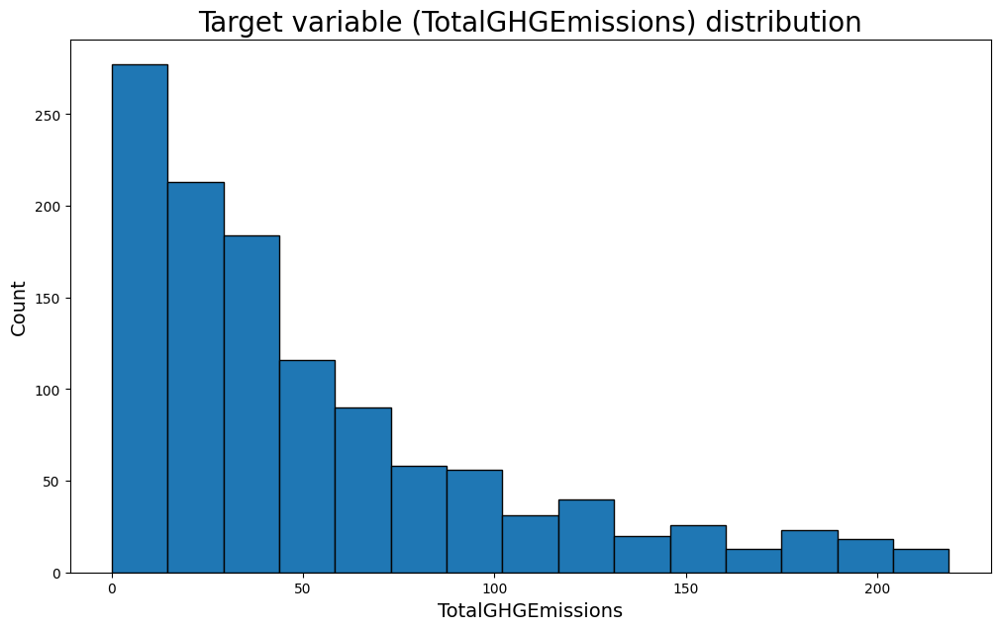

In [101]:
plt.figure(figsize=(12, 7))
plt.title('Target variable (TotalGHGEmissions) distribution', 
size=20)
plt.xlabel('TotalGHGEmissions', size=14)
plt.ylabel('Count', size=14)
plt.hist(df['TotalGHGEmissions'], bins=15,  ec='#040404')

<a href="#toc" role="button" aria-pressed="true" >⬆️ Back to Table of Contents ⬆️</a>

<a id="DV"></a>


# <h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" >Data visualisation</h1>


<a id="nfv"></a>
## <span style="color:#33afff  ;">  Numerical features visualisation </span>

<a id="box"></a>
#### <span style="color:#33afff  ;">Boxplot and Histogramm</span>

Let's define a function to vissualise our dataset dispersion in a boxplot.

In [102]:
def boxplot(df, features):
    N = len(features)
    fig, ax = plt.subplots(int(np.ceil(N/2)),2, figsize=(18,15))
    plt.suptitle('Numerical features Boxplot', size=20)
    ytop = 0.96-0.4*np.exp(-N/5)
    plt.subplots_adjust(top=ytop)
    medianprops = dict(linestyle="-", linewidth=2, color="yellow")
    for feature, subplot in zip(features, ax.flatten()):
        sns.set(font_scale=1)
        sns.boxplot(x=df[feature], color='#009ACD', saturation=1,
                    medianprops=medianprops, flierprops={"markerfacecolor": "mediumseagreen"},
                    whis=1.5, ax=subplot)
    plt.title('Boxplot : {}'.format(feature))
    plt.xlabel(feature, size=12)
    fig.tight_layout()
    plt.show()


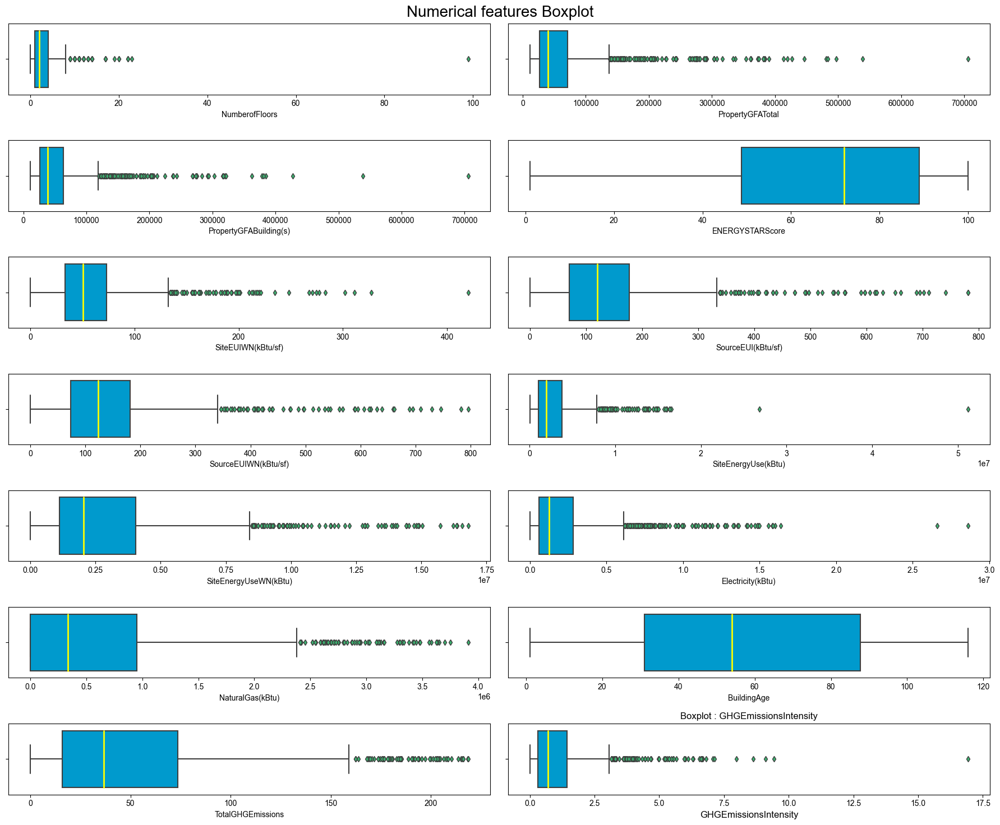

In [103]:
numeric_features = ['NumberofFloors', 'PropertyGFATotal', 'PropertyGFABuilding(s)', 'ENERGYSTARScore', 'SiteEUIWN(kBtu/sf)','SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)','SiteEnergyUseWN(kBtu)',
            'Electricity(kBtu)', 'NaturalGas(kBtu)', "BuildingAge", 'TotalGHGEmissions','GHGEmissionsIntensity']
boxplot(df, numeric_features)

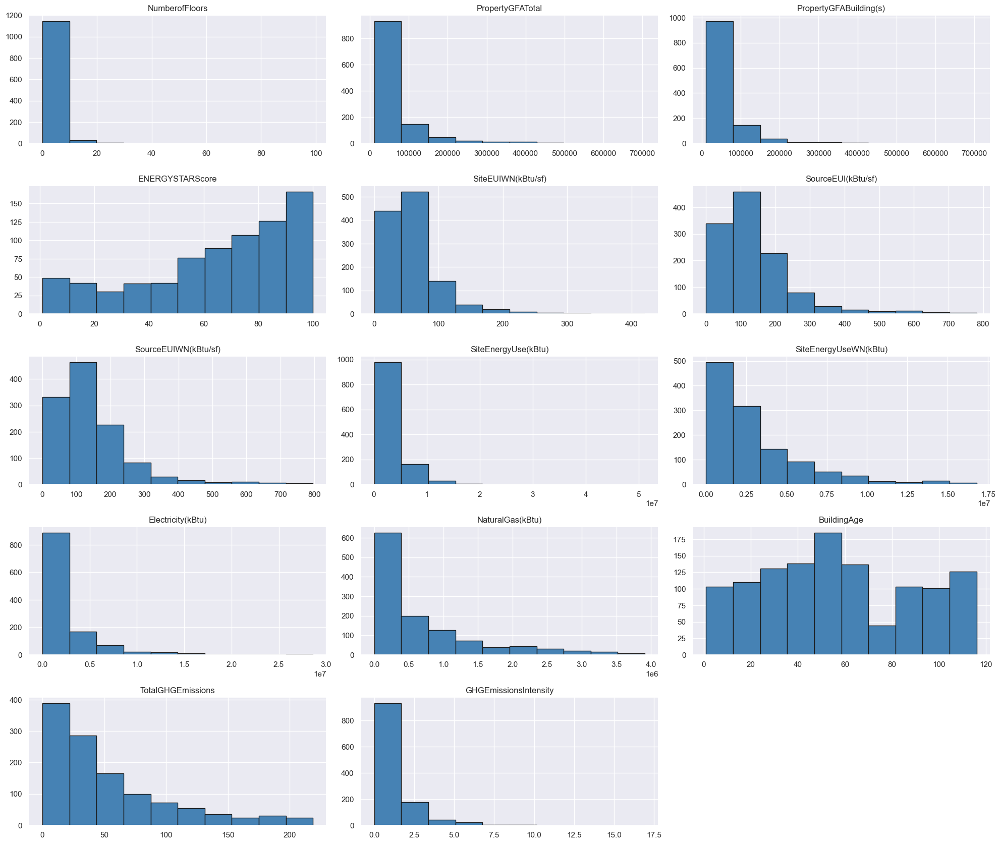

In [104]:
df[numeric_features].hist(figsize=(20,20), layout=(6,3), alpha=1, color='#4682b4', ec="k")
plt.tight_layout()
plt.show()

<a id="sp"></a>
#### <span style="color:#33afff  ;">Scatter plot</span>

<Figure size 2000x2000 with 0 Axes>

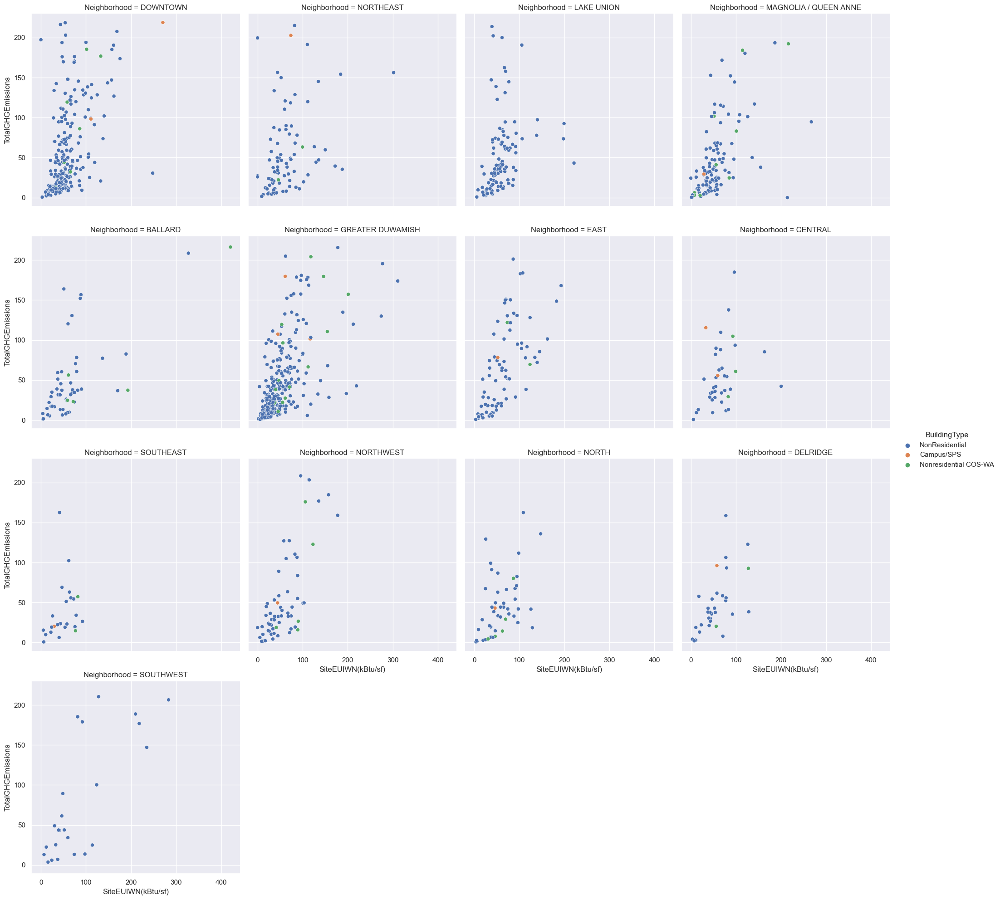

In [105]:
plt.figure(figsize=(20, 20))
sns.relplot(data=df, x="SiteEUIWN(kBtu/sf)", y="TotalGHGEmissions", hue="BuildingType", col="Neighborhood", col_wrap=4)
plt.show()

<Figure size 2000x2000 with 0 Axes>

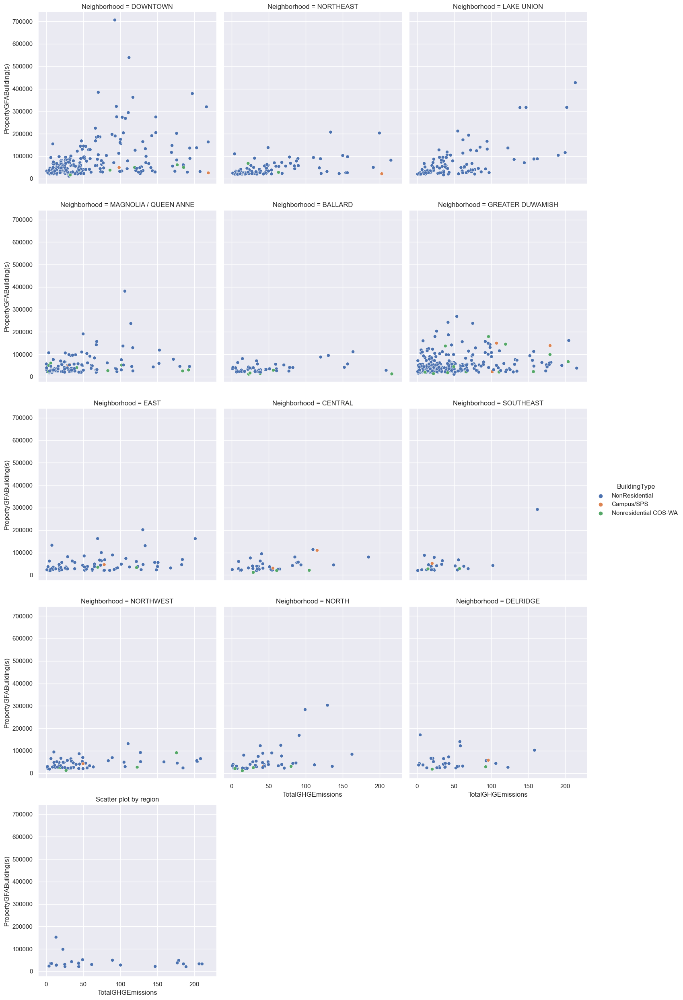

In [106]:
plt.figure(figsize=(20, 20))
sns.relplot(data=df, x="TotalGHGEmissions", y="PropertyGFABuilding(s)", hue="BuildingType", col="Neighborhood", col_wrap=3)
plt.title("Scatter plot by region")
plt.show()

<Figure size 2000x2000 with 0 Axes>

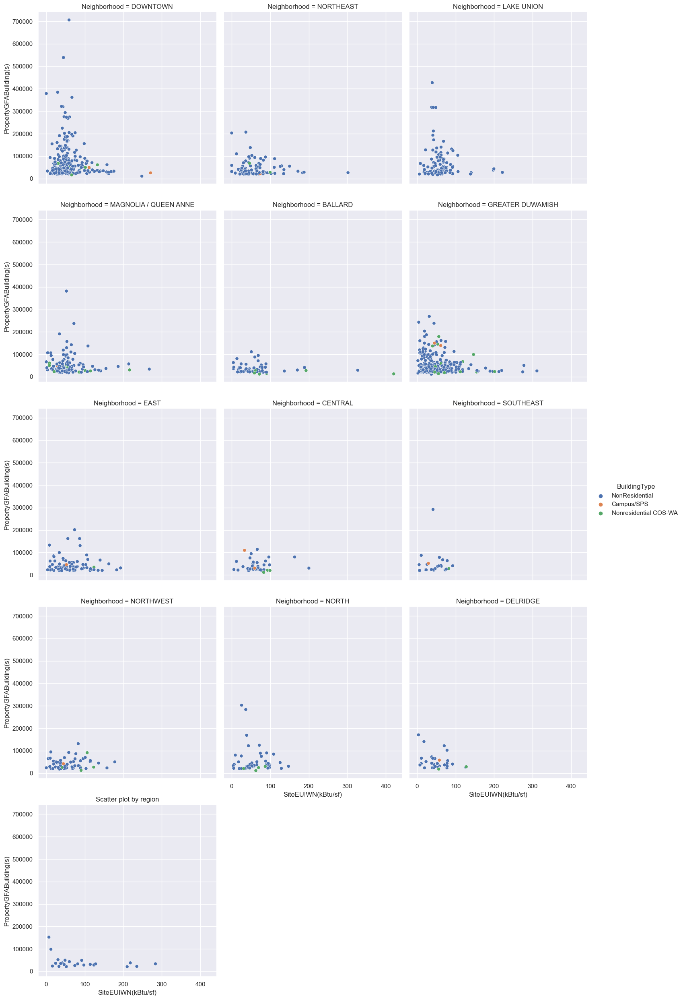

In [107]:
plt.figure(figsize=(20, 20))
sns.relplot(data=df, x="SiteEUIWN(kBtu/sf)", y="PropertyGFABuilding(s)", hue="BuildingType", col="Neighborhood", col_wrap=3)
plt.title("Scatter plot by region")
plt.show()

These scatter show the existence of the relation between our target variable.

<Figure size 2000x2000 with 0 Axes>

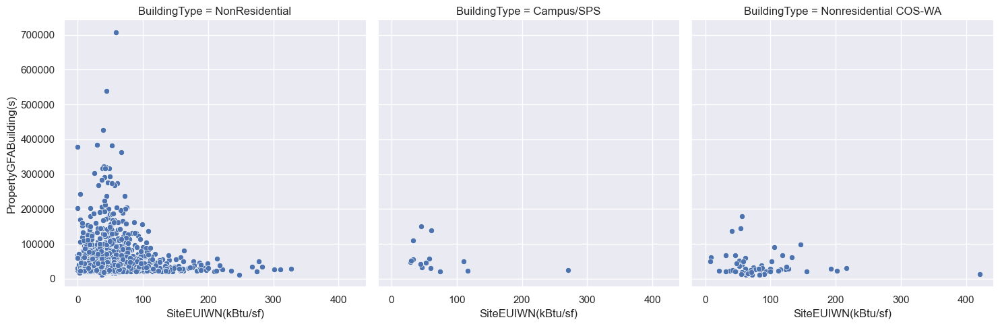

In [108]:
plt.figure(figsize=(20, 20))
sns.relplot(data=df, x="SiteEUIWN(kBtu/sf)", y="PropertyGFABuilding(s)", col="BuildingType", col_wrap=3)
plt.show()

<a id="dp"></a>
#### <span style="color:#33afff  ;">Distributions plot</span>

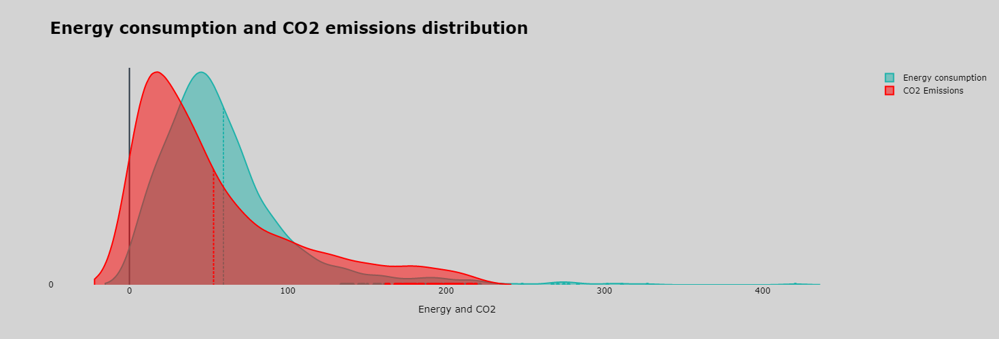

In [109]:
fig = go.Figure()
fig.add_trace(go.Violin(x=df["SiteEUIWN(kBtu/sf)"], line_color='lightseagreen', name='Energy consumption', y0=0))
fig.add_trace(go.Violin(x=df["TotalGHGEmissions"], line_color='red', name= 'CO2 Emissions', y0=0))

fig.update_traces(orientation='h', side='positive', meanline_visible=True)
fig.update_layout(xaxis_showgrid=False, xaxis_zeroline=True)

fig.update_layout(title='<b>Energy consumption and CO2 emissions distribution<b>',
                  xaxis_title='Energy and CO2',
                  titlefont={'size': 24},
                  width=800,
                  height=500,
                  template="plotly_dark",
                  showlegend=True,
                  paper_bgcolor="lightgray",
                  plot_bgcolor='lightgray', 
                  font=dict(
                      color ='black',
                      )
                  )
fig.show()

In [110]:
year_mean = df.groupby("YearBuilt")[["SiteEUIWN(kBtu/sf)", 'TotalGHGEmissions', 'ENERGYSTARScore']].mean()

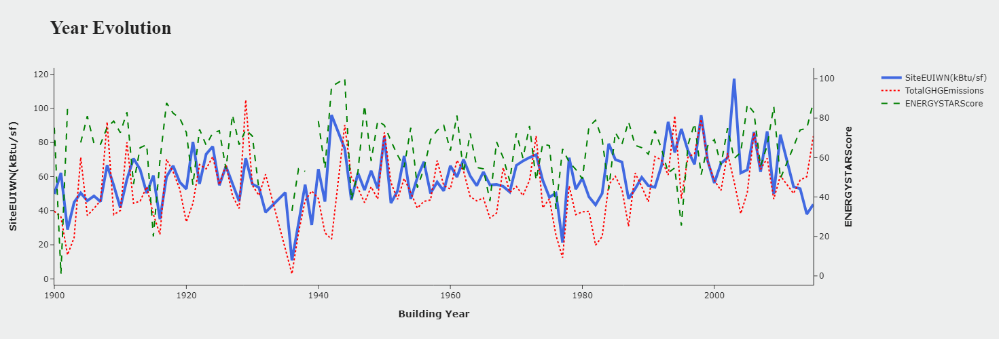

In [111]:
y=df.groupby('YearBuilt')['SiteEUIWN(kBtu/sf)'].mean()
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(y=df.groupby('YearBuilt')['SiteEUIWN(kBtu/sf)'].mean(),
                         x=y.index,
                         mode='lines',
                         name = 'SiteEUIWN(kBtu/sf)',
                         line=dict(color='royalblue', width=4, dash='solid')
                         )
             )
fig.add_trace(go.Scatter(y=df.groupby('YearBuilt')['TotalGHGEmissions'].mean(),
                         x= y.index,
                         name = 'TotalGHGEmissions',
                         line=dict(color='red', width=2, dash='dot')
                         )
             )
fig.add_trace(go.Scatter(y = df.groupby('YearBuilt')['ENERGYSTARScore'].mean(),
                         x = y.index,
                         name = 'ENERGYSTARScore',
                         line=dict(color='green', width=2, dash='dash')
                         ),secondary_y=True,
             )
fig.update_layout(title='<b>Year Evolution',
                  xaxis_title='<b>Building Year<b>',
                  yaxis_title='<b>SiteEUIWN(kBtu/sf)',
                  titlefont={'size': 28, 'family':'Serif'},
                  template='simple_white',
                  showlegend=True,
                  paper_bgcolor='#edeeee',
                  plot_bgcolor='#edeeee',
                  width=950, height=500,
                 )
fig.update_yaxes(title_text="<b>ENERGYSTARScore</b>", secondary_y=True)
fig.show()              

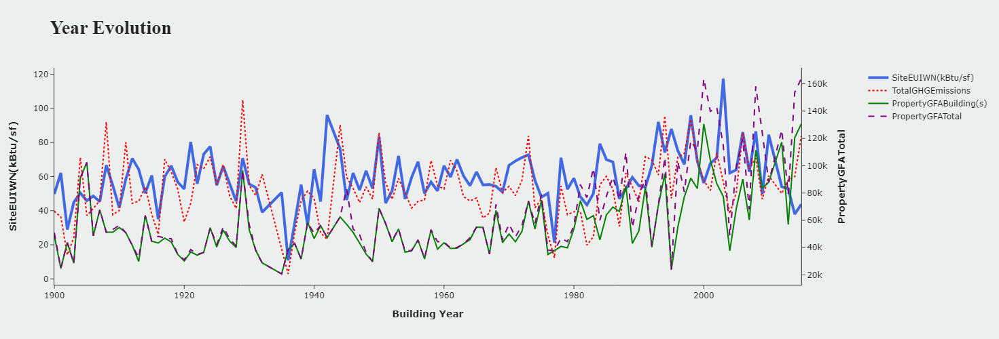

In [112]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(y=df.groupby('YearBuilt')['SiteEUIWN(kBtu/sf)'].mean(),
                         x=y.index,
                         mode='lines',
                         name = 'SiteEUIWN(kBtu/sf)',
                         line=dict(color='royalblue', width=4, dash='solid')
                         )
             )
fig.add_trace(go.Scatter(y=df.groupby('YearBuilt')['TotalGHGEmissions'].mean(),
                         x=y.index,
                         name = 'TotalGHGEmissions',
                         line=dict(color='red', width=2, dash='dot')
                         )
             )
fig.add_trace(go.Scatter(y=df.groupby('YearBuilt')['PropertyGFABuilding(s)'].mean(),
                         x=y.index,
                         name = 'PropertyGFABuilding(s)',
                         line=dict(color='green', width=2, dash='solid')
                         ),secondary_y=True,
             )
fig.add_trace(go.Scatter(y=df.groupby('YearBuilt')['PropertyGFATotal'].mean(),
                       x=y.index,
                       name = 'PropertyGFATotal',
                         line=dict(color='Purple', width=2, dash='dash')
                        ),secondary_y=True,
             )
fig.update_layout(title='<b>Year Evolution',
                  xaxis_title='<b>Building Year<b>',
                  yaxis_title='<b>SiteEUIWN(kBtu/sf)',
                  titlefont={'size': 28, 'family':'Serif'},
                  template='simple_white',
                  showlegend=True,
                  paper_bgcolor='#edeeee',
                  plot_bgcolor='#edeeee',
                  width=950, height=500,
                 )
fig.update_yaxes(title_text="<b>PropertyGFATotal</b>", secondary_y=True)
fig.show()              

<a id="ca"></a>
### <span style="color:#33afff  ;"> Correlation analysis </span>

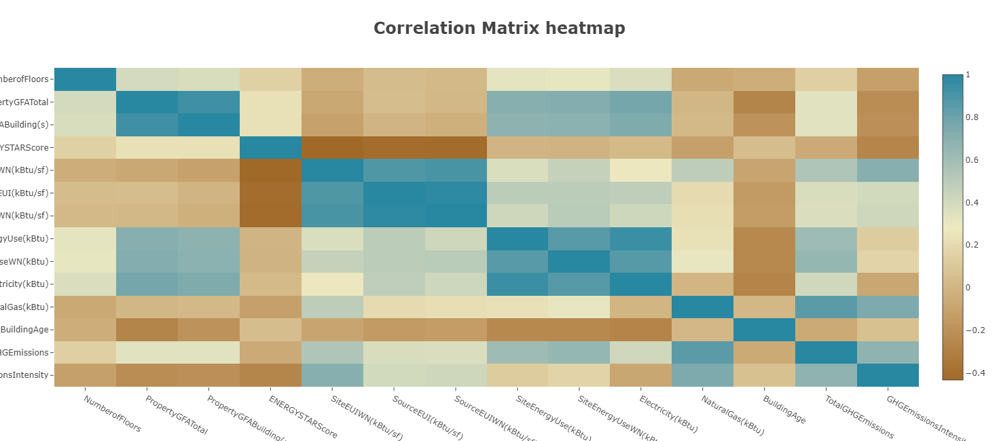

In [113]:
corr = df[numeric_features].corr()
fig = go.Figure(data= go.Heatmap(z=corr,
                                 x=corr.index.values,
                                 y=corr.columns.values,
                                 colorscale='earth',
                                 )
                )
fig.update_layout(title_text='<b>Correlation Matrix heatmap<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=850, height=650,
                  xaxis_showgrid=False,
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed', 
                  paper_bgcolor=None,
                  )
fig.show()

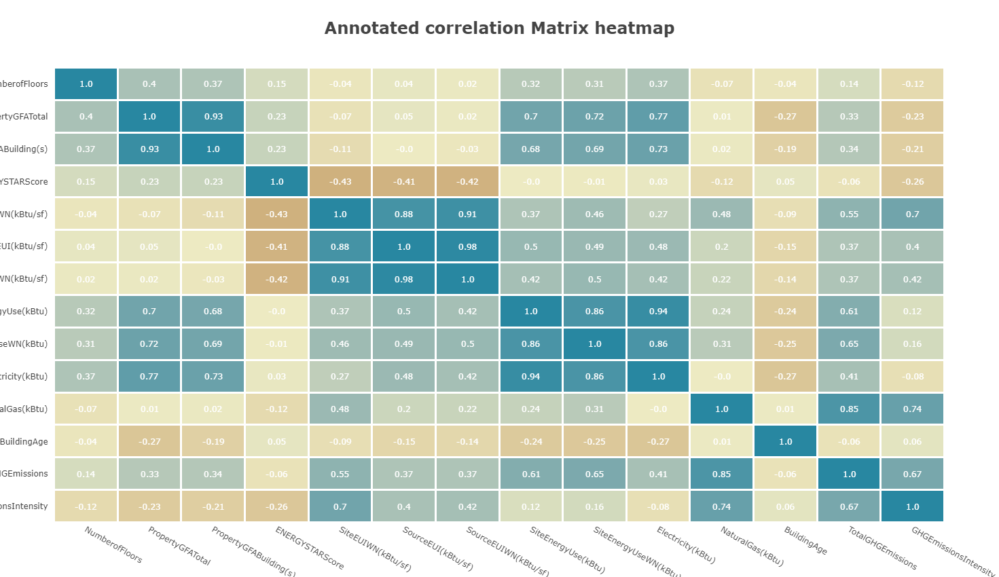

In [114]:
corr = df[numeric_features].corr()
fig = ff.create_annotated_heatmap(
    z=corr.to_numpy().round(2),
    x=list(corr.index.values),
    y=list(corr.columns.values),       
    xgap=3, ygap=3,
    zmin=-1, zmax=1,
    colorscale='earth',
    colorbar_thickness=30,
    colorbar_ticklen=3,
)
fig.update_layout(title_text='<b>Annotated correlation Matrix heatmap<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=850, height=850,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',                   
                  paper_bgcolor=None,
                  )
fig.show()



<img src="Energy.png"/>

The correlation matix shows a great correlation between energy consumption and gross floor area, Electricity, CO2 emissions. The relation between consumption and the source of use energy is average. 

<img src="corr_axis.png"/>

The CO2 emission is strongly correlated to natural gas consumption, energy consumption and the source of use energy. 

The relation iss average with electricity consumption.

<a id="bp"></a>
### <span style="color:#33afff  ;"> Bar plot </span>

In [115]:
def barplot(df, features, x, y=False):
    
    for feature in features:
        plt.figure(figsize=(20, 20))
        sns.barplot(data=df, x=x, y=feature, errorbar="sd")
        plt.title("{} barplot by {}".format(feature, x))
        plt.show()
    
    return
    
    

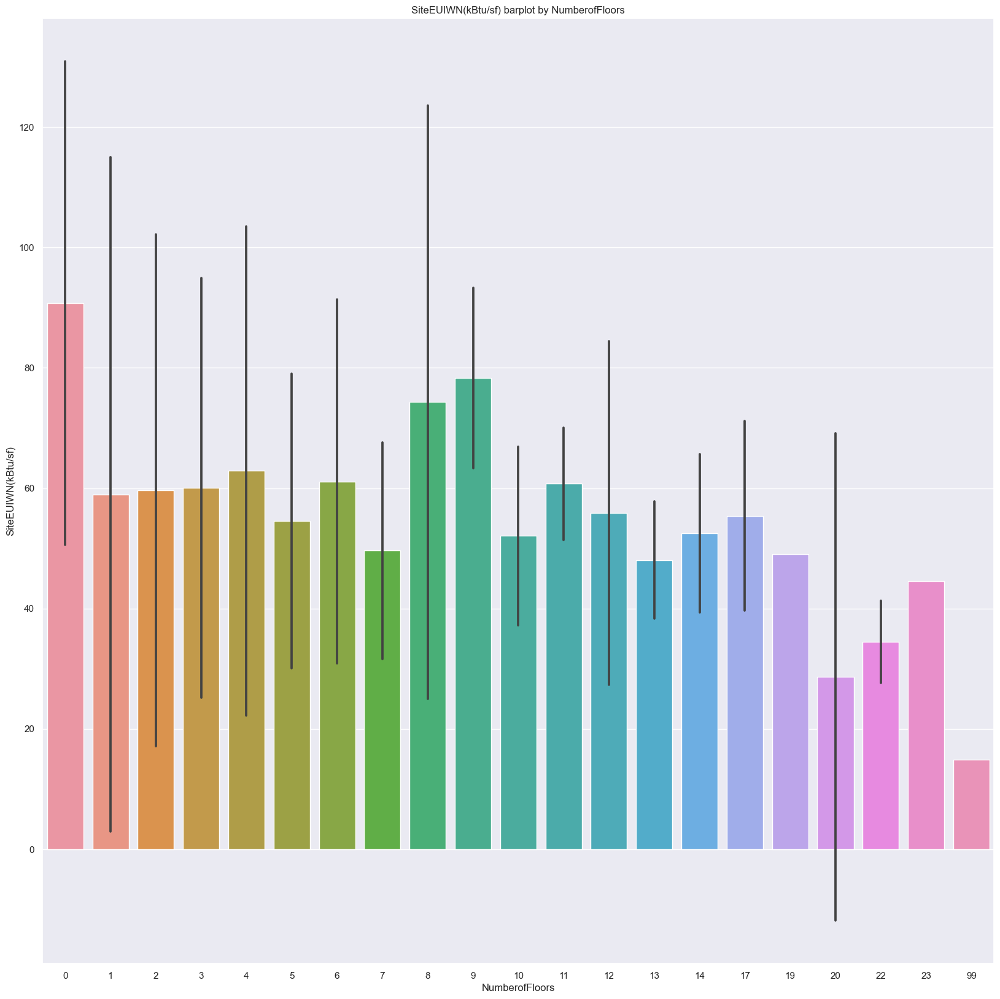

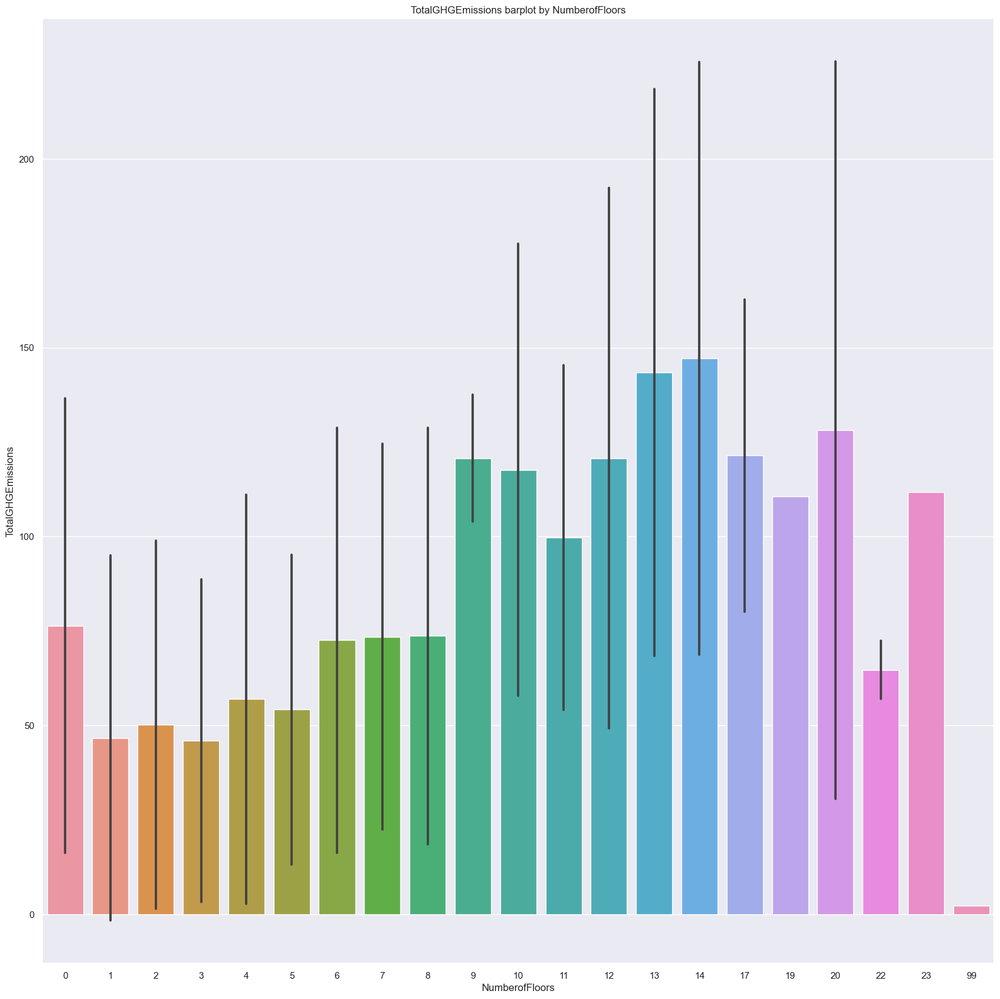

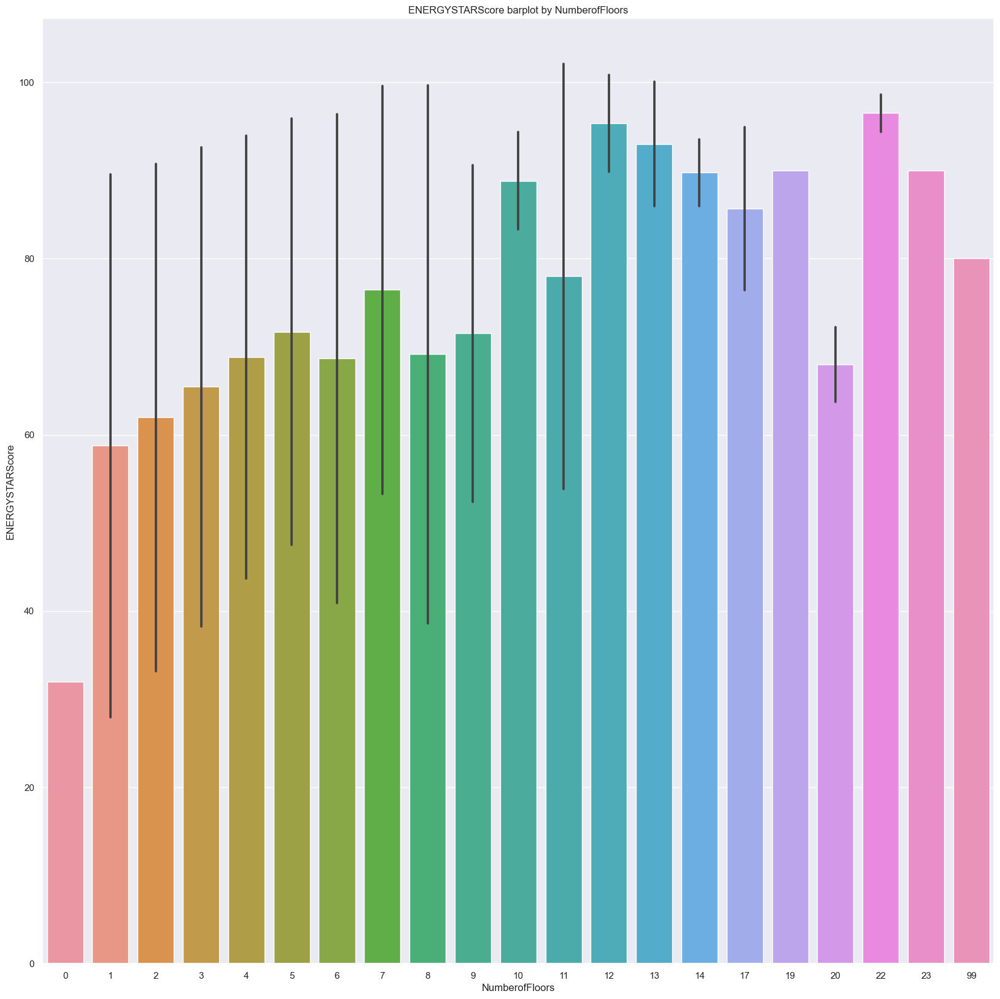

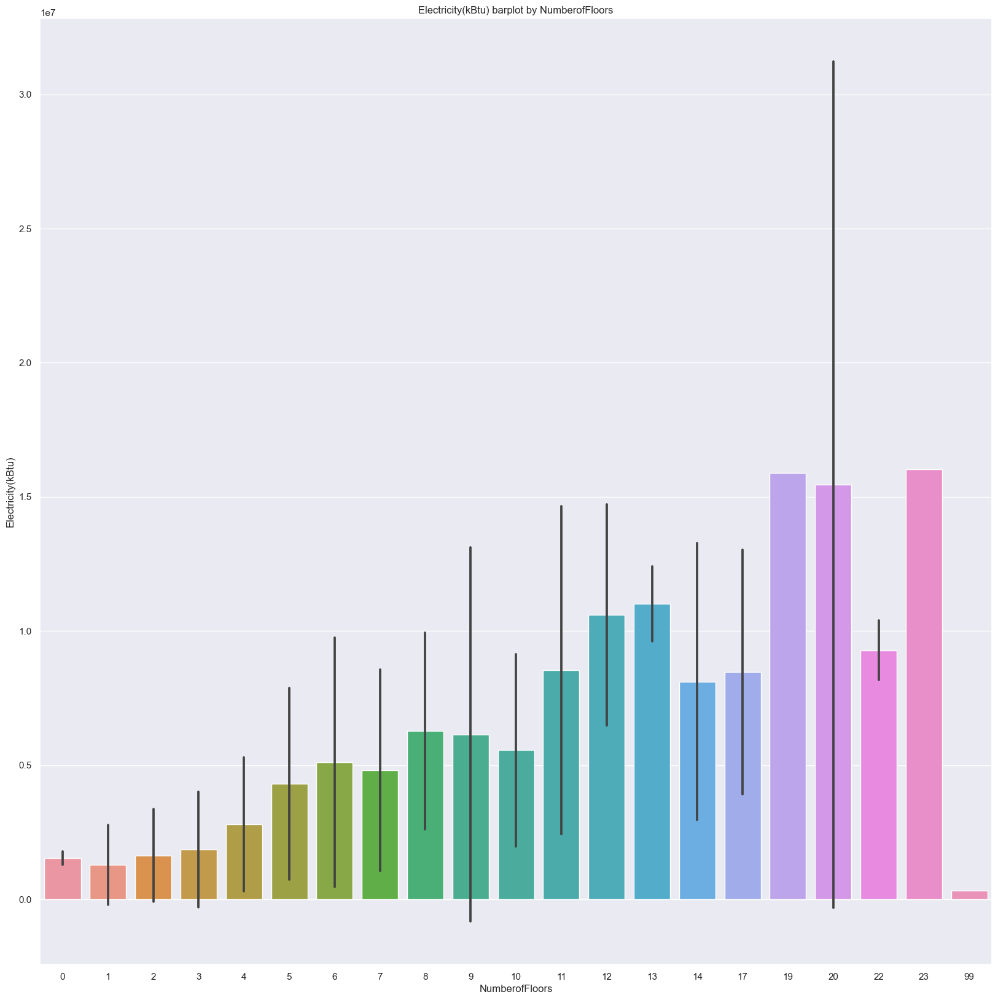

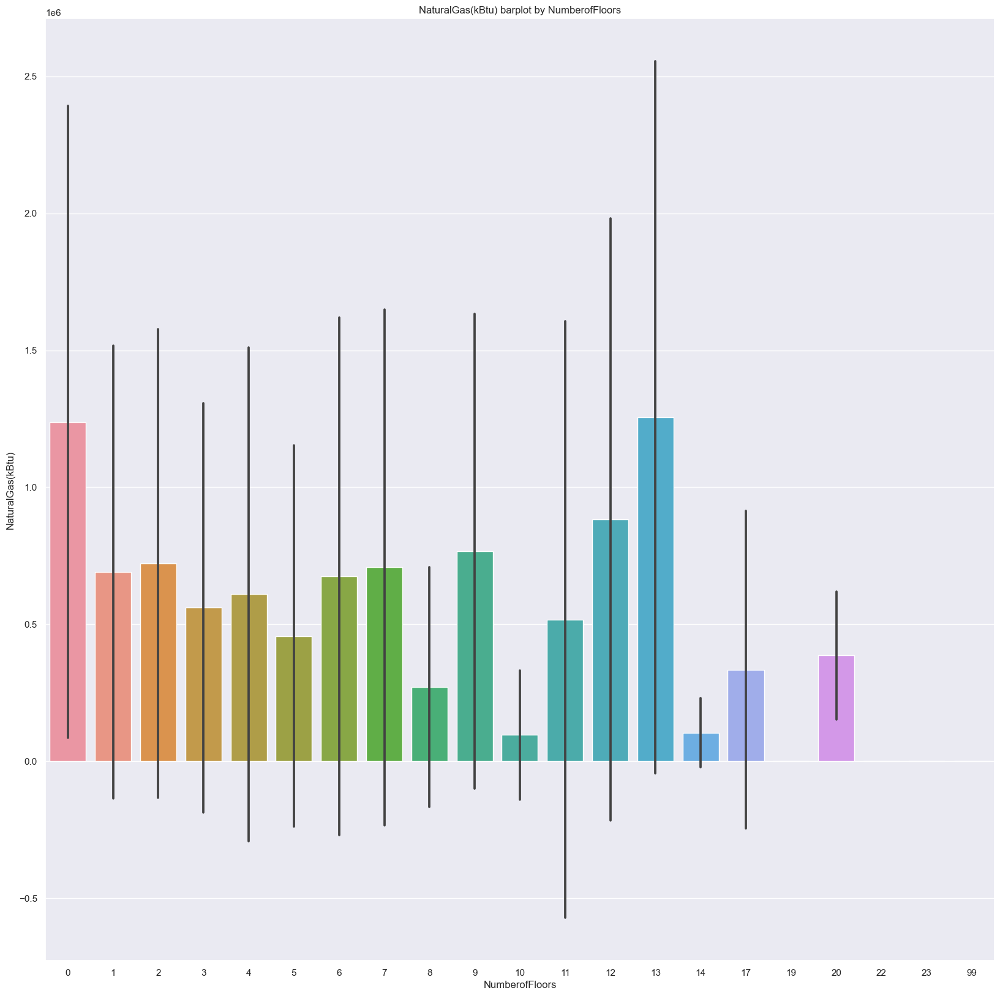

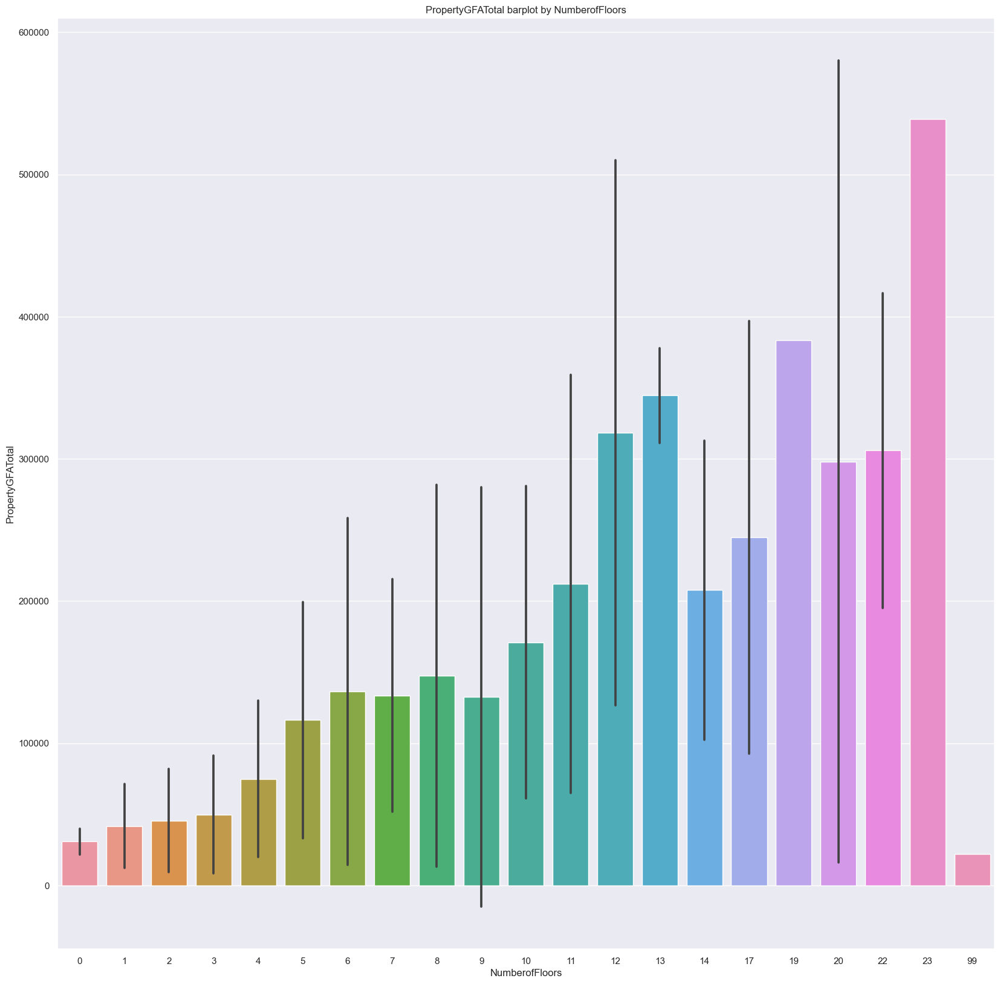

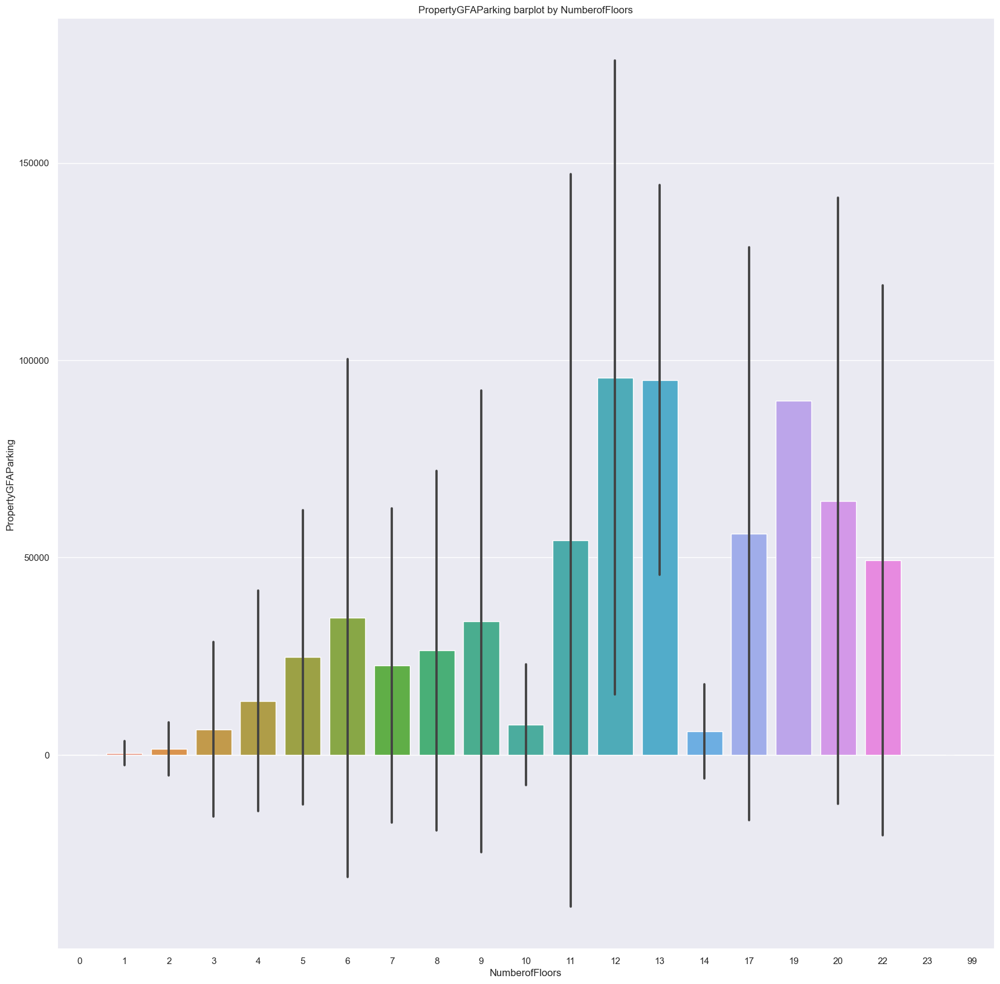

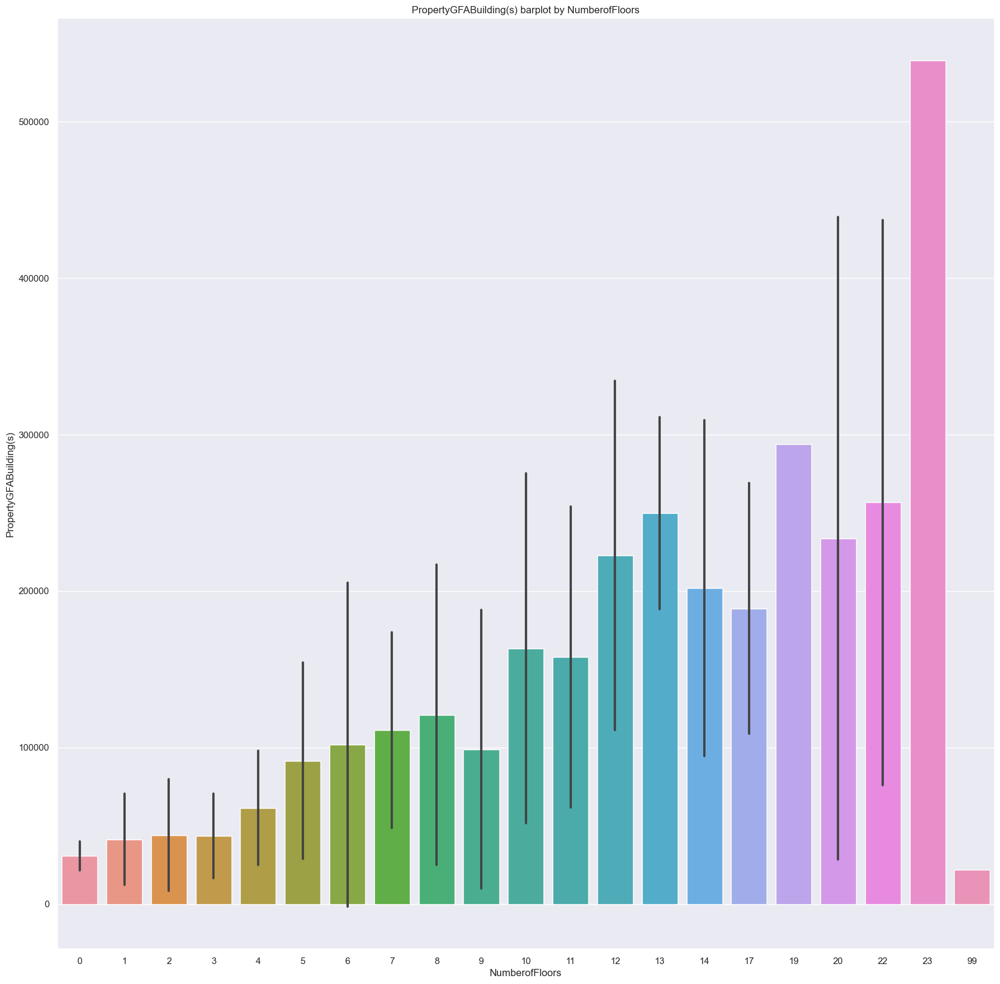

In [116]:
columns = ["SiteEUIWN(kBtu/sf)", 'TotalGHGEmissions', 'ENERGYSTARScore', 'Electricity(kBtu)', 'NaturalGas(kBtu)','PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)']
barplot(df, columns, x="NumberofFloors")

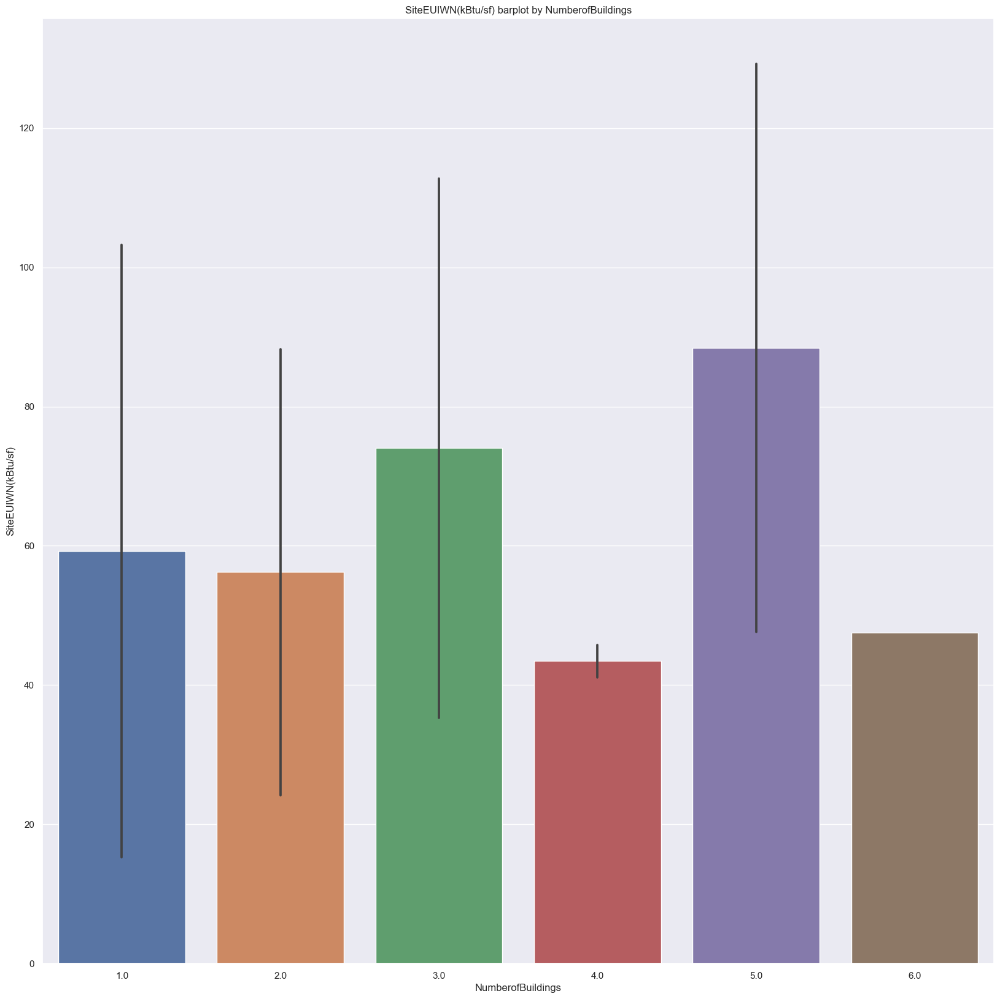

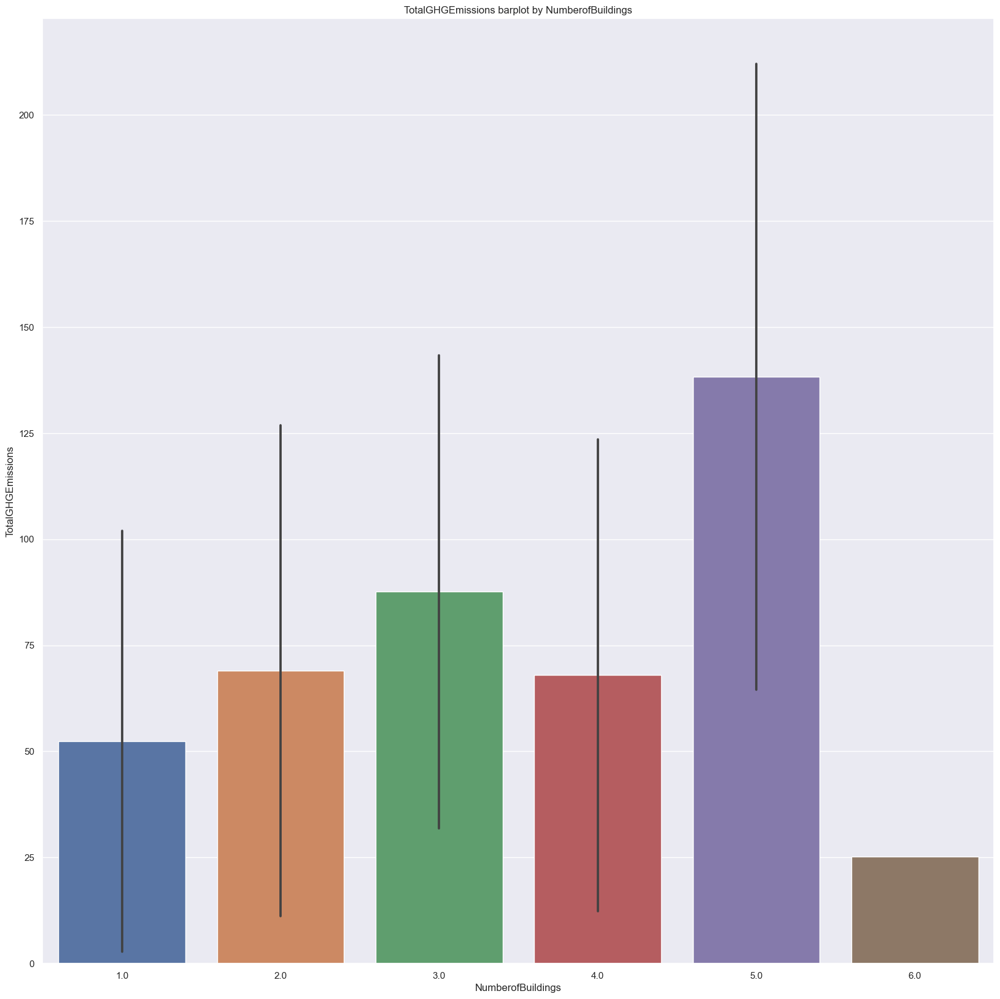

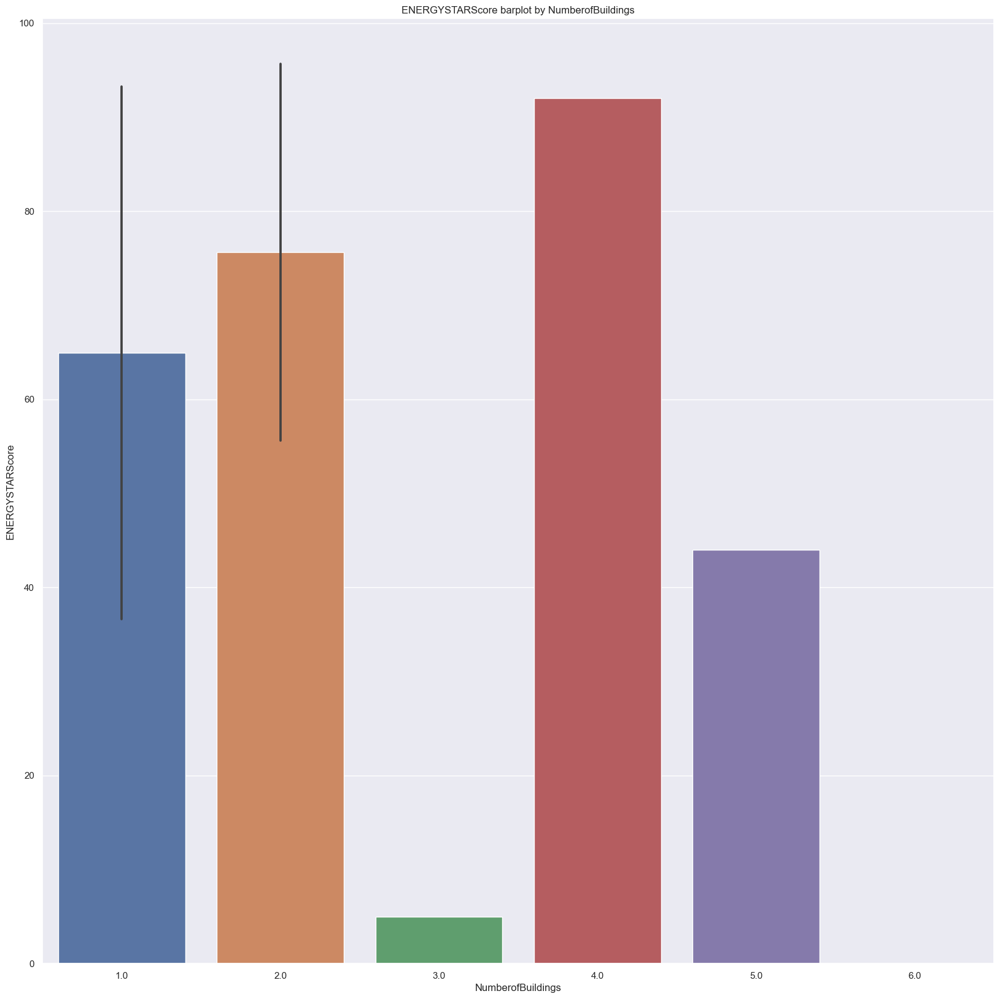

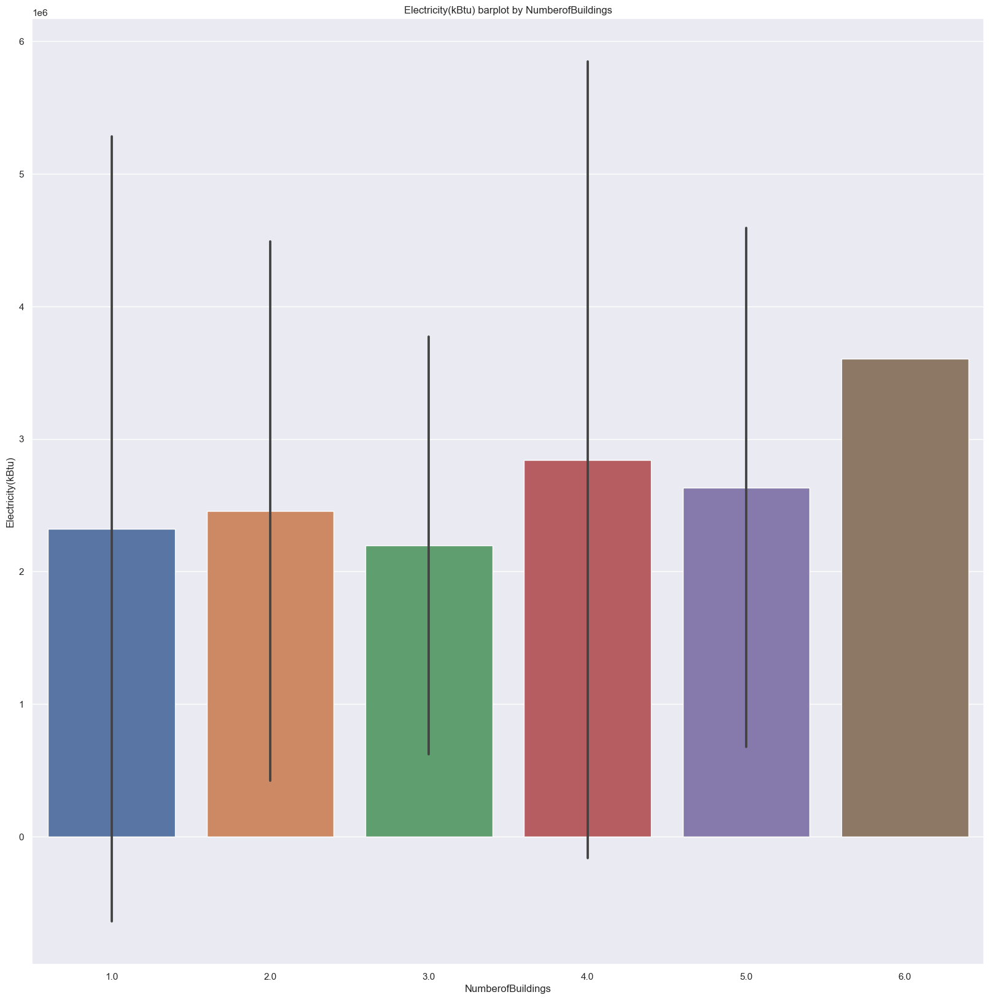

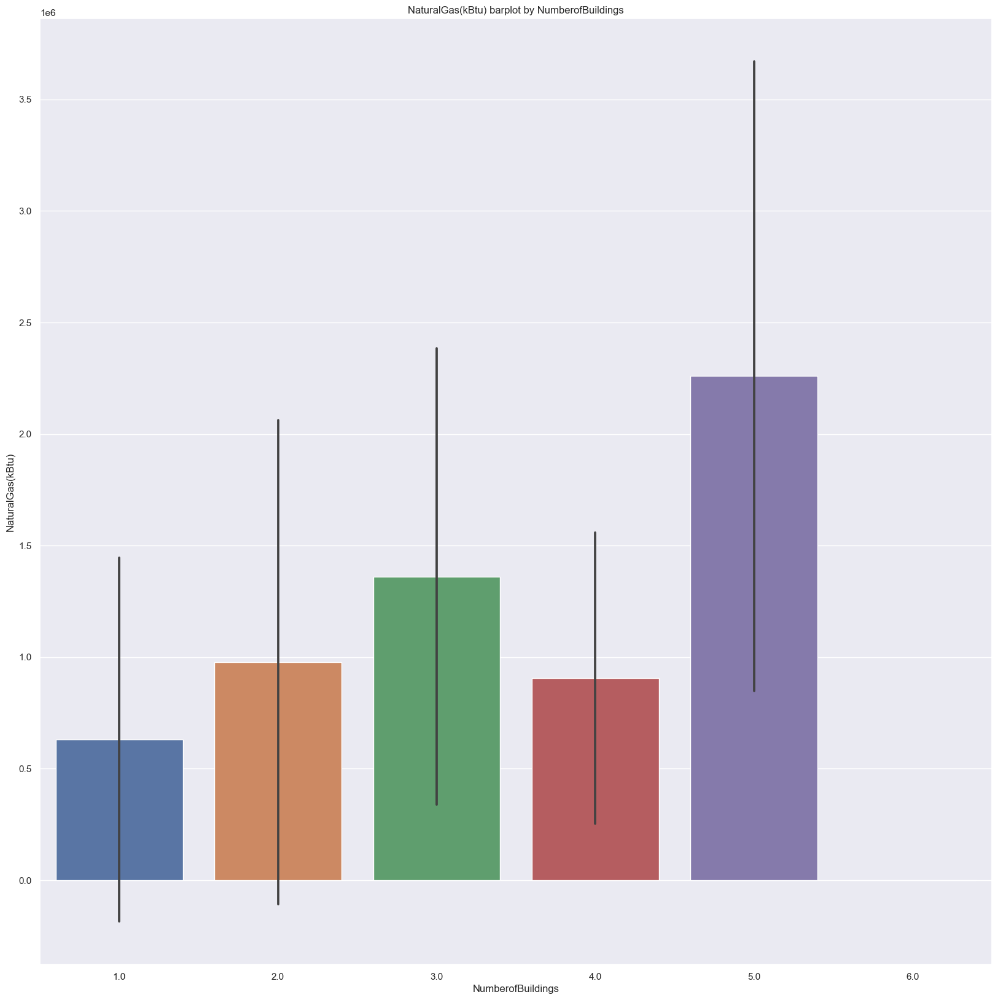

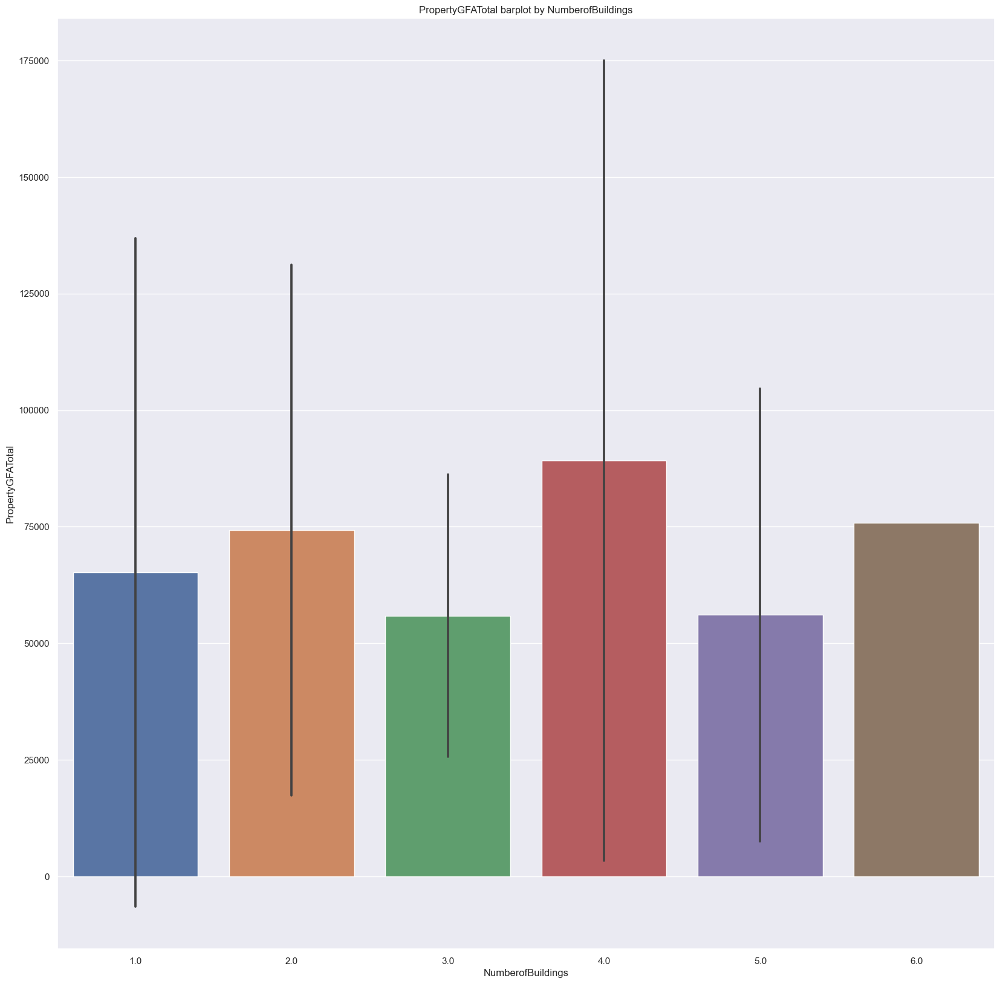

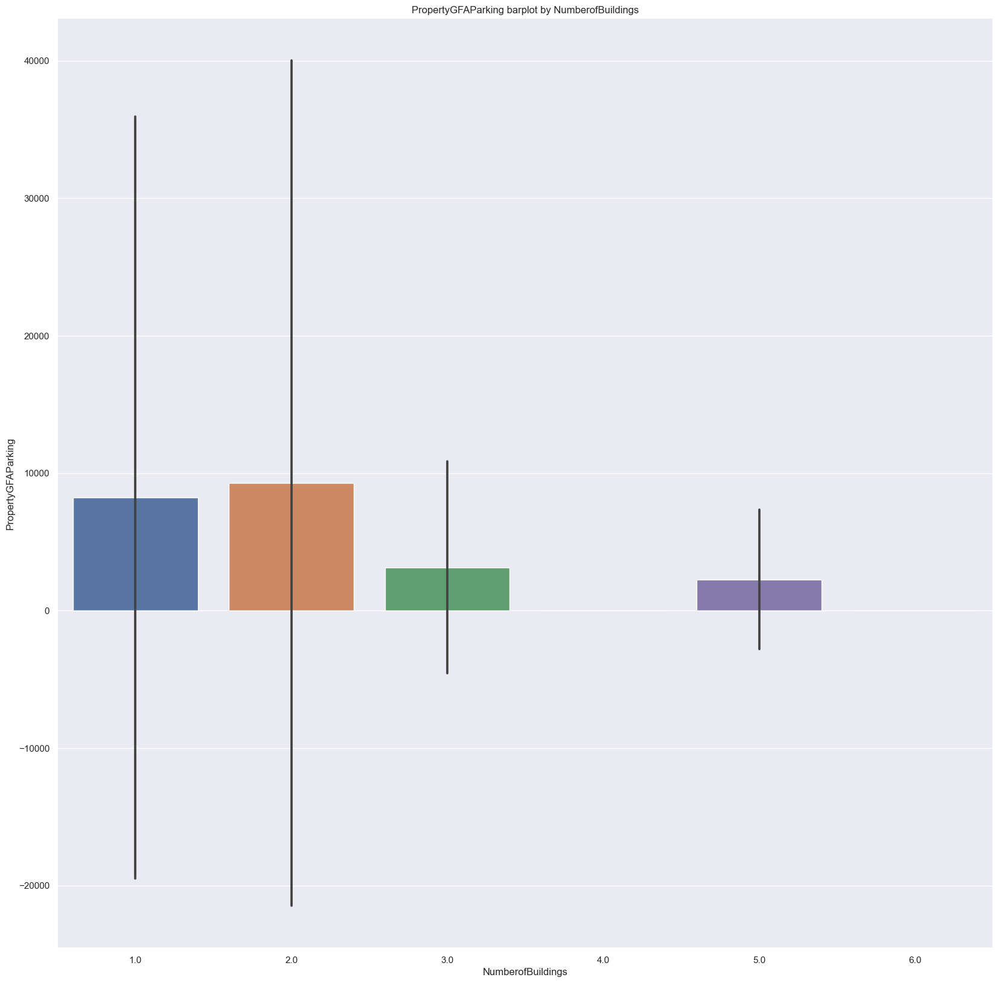

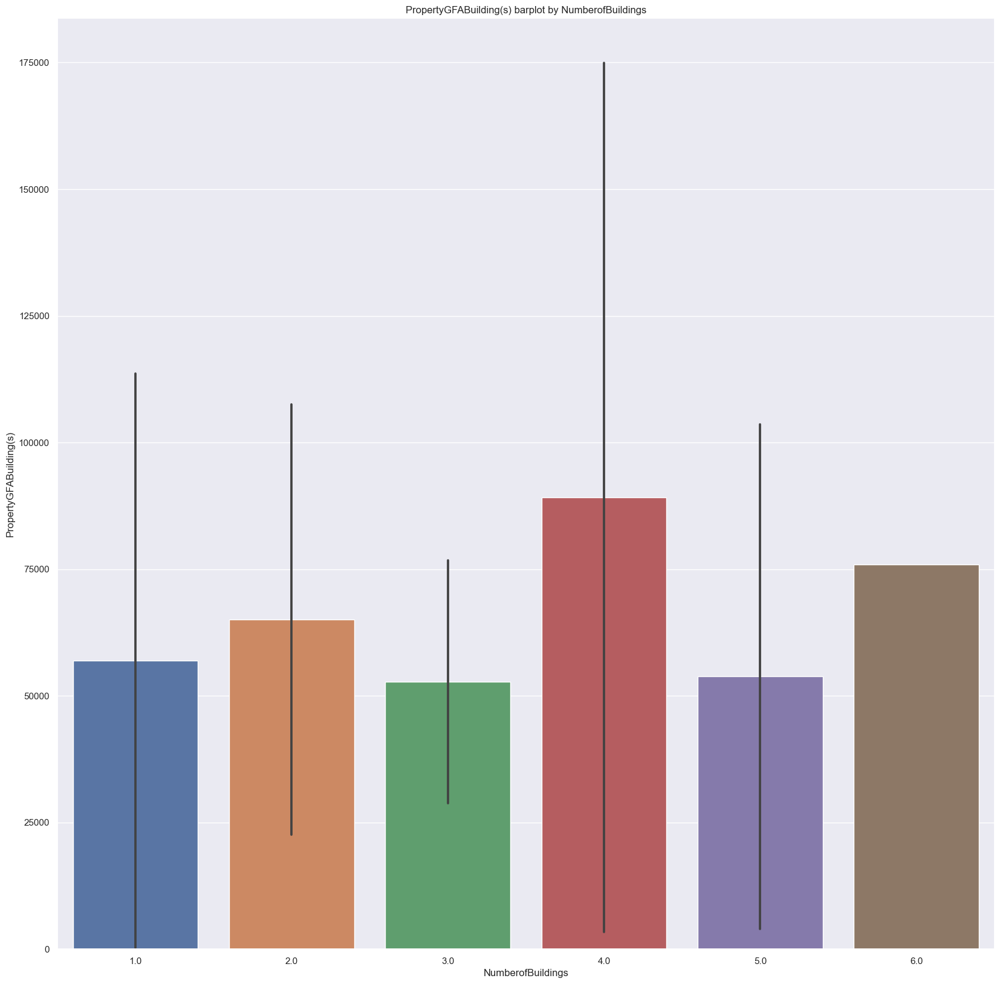

In [117]:
barplot(df, columns, x="NumberofBuildings")

<a id="pp"></a>
### <span style="color:#33afff  ;"> Pie plot </span>

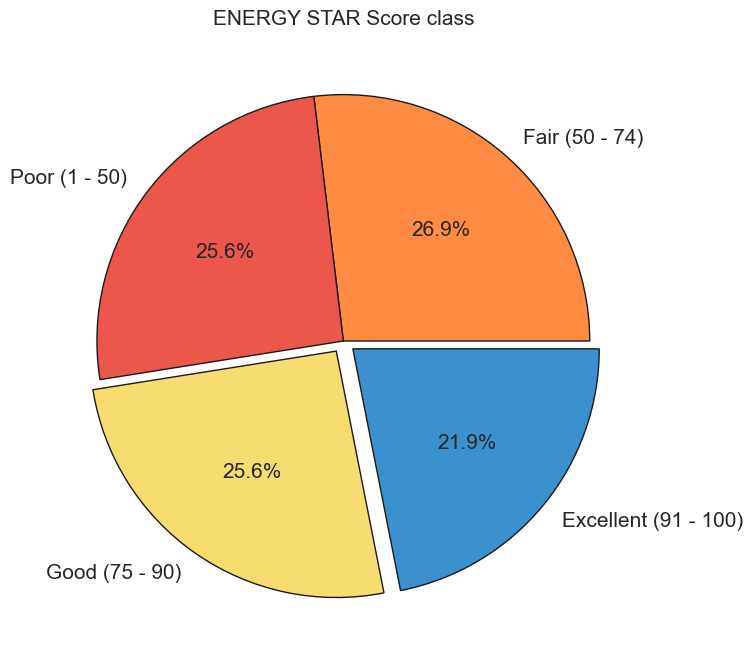

In [118]:
%matplotlib inline

energy_score = pd.cut(df['ENERGYSTARScore'], [1, 50, 74, 90, 100])  

labels = ['Fair (50 - 74)','Poor (1 - 50)', 'Good (75 - 90)', 'Excellent (91 - 100)']

fig1, ax = plt.subplots(figsize=(10,8))
ax.pie(energy_score.value_counts(), 
       labels=labels,
       explode = [0, 0, .05, .05],
       autopct='%1.1f%%',
       colors = [ "#ff8c42","#eb574b","#f7dc6f","#3b91ce"],
       wedgeprops = {"ec": "k"}, 
       textprops = {"fontsize": 15}) 
ax.set_title('ENERGY STAR Score class', {"fontsize": 15})
plt.savefig('ENERGYSTARScore_category.png')
plt.show()

<a href="#toc" role="button" aria-pressed="true" >⬆️ Back to Table of Contents ⬆️</a>

<a id="cfv"></a>
## <span style="color:#33afff  ;">  Categorical features visualisation </span>

<a id="hp"></a>
### <span style="color:#33afff  ;"> Histogramm plot </span>

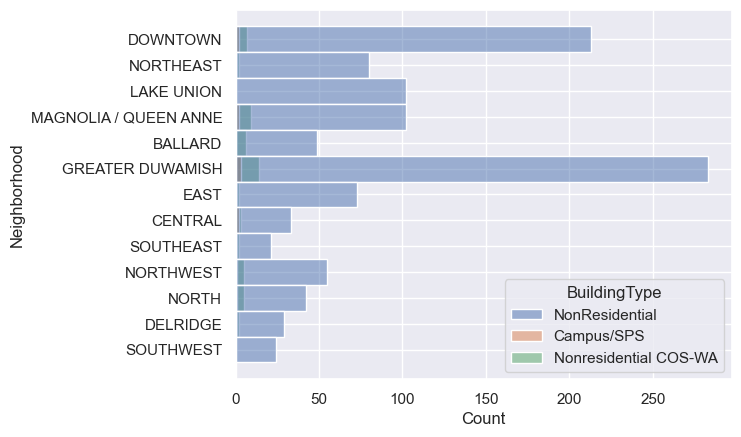

In [119]:
ax = sns.histplot(df, y="Neighborhood", hue="BuildingType")

<a id="bar"></a>
### <span style="color:#33afff  ;"> Bar plot </span>

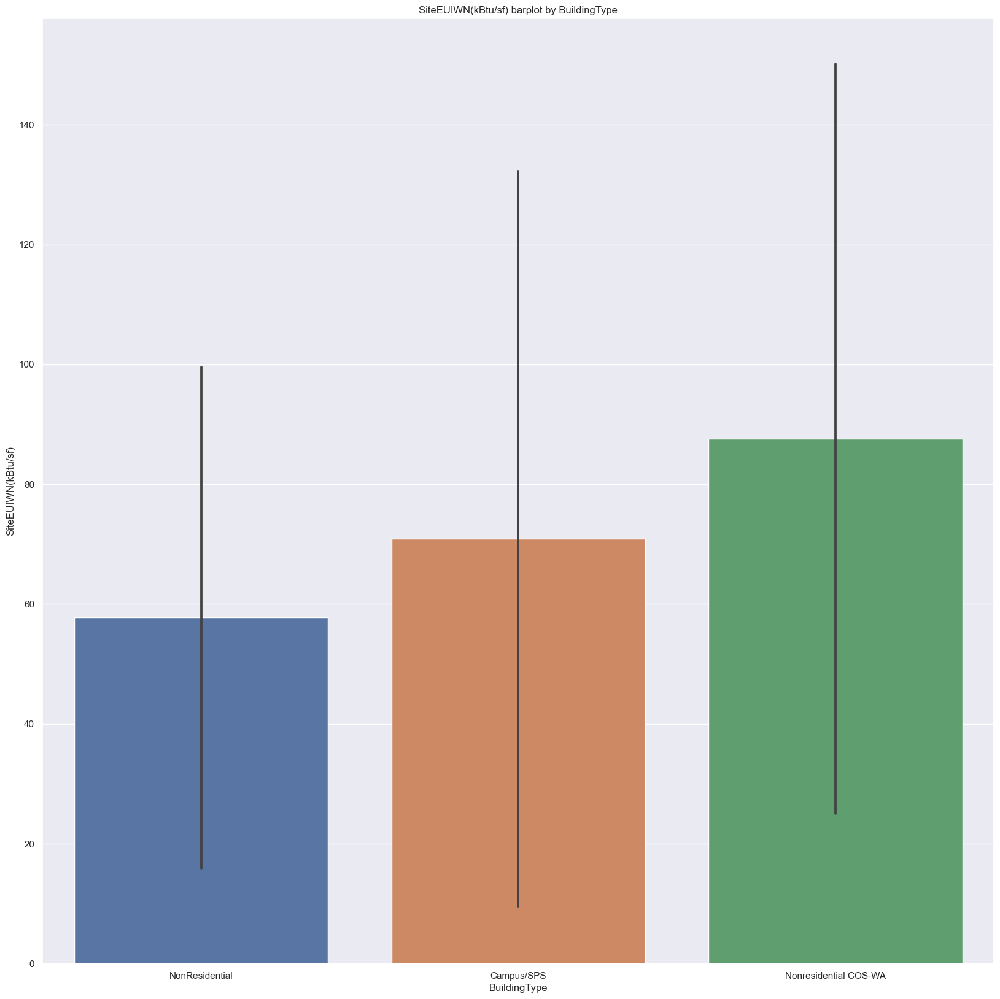

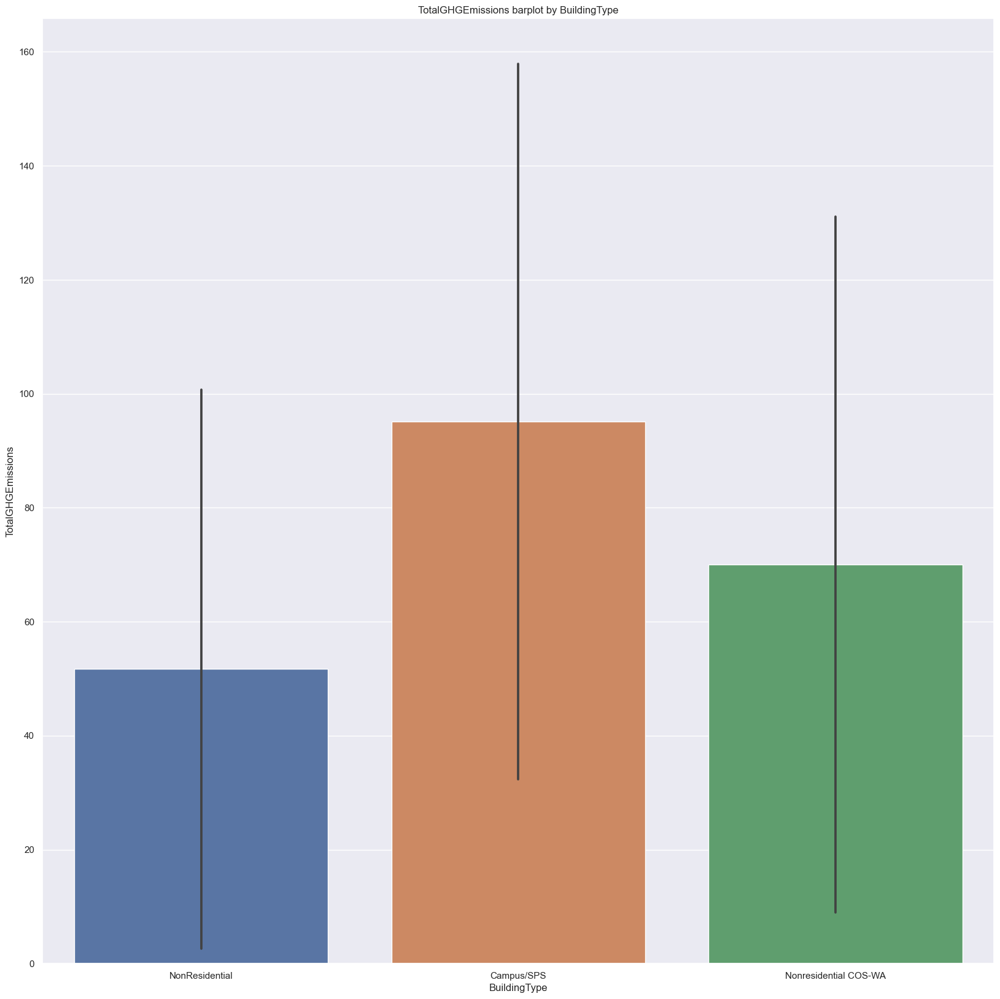

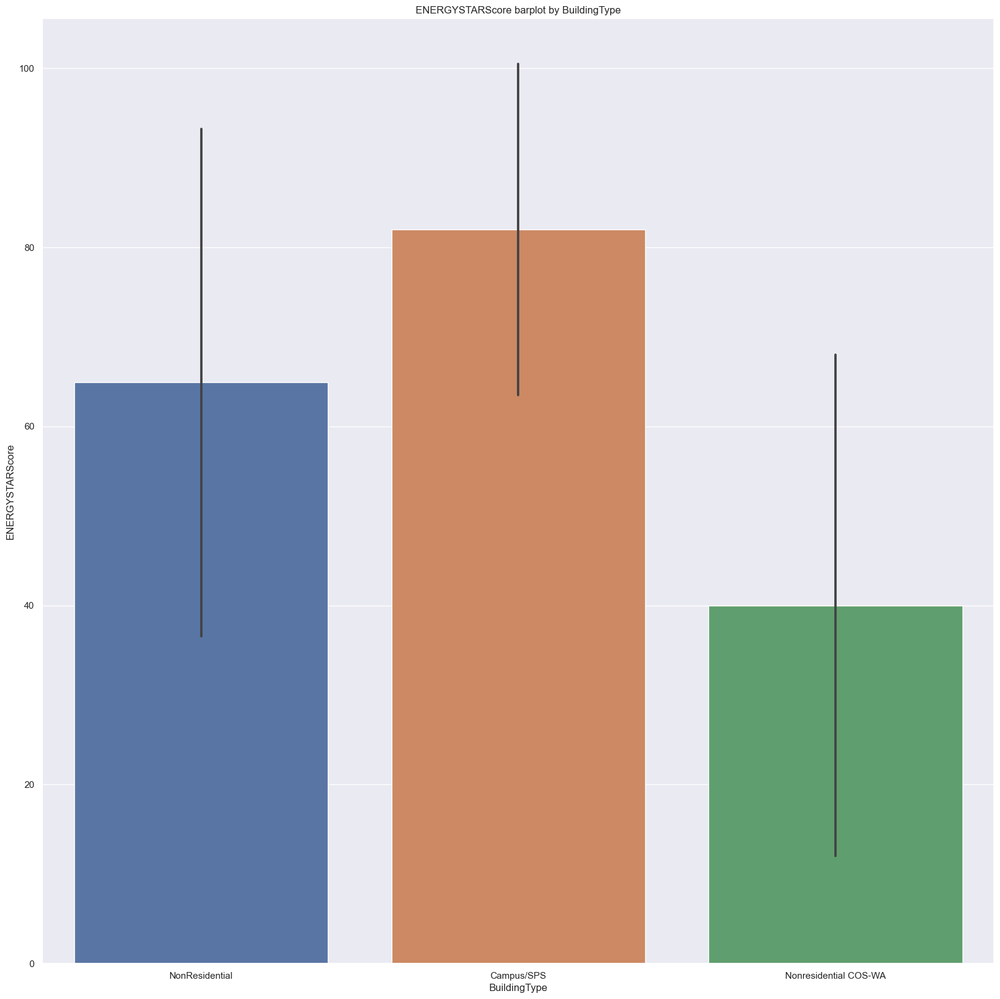

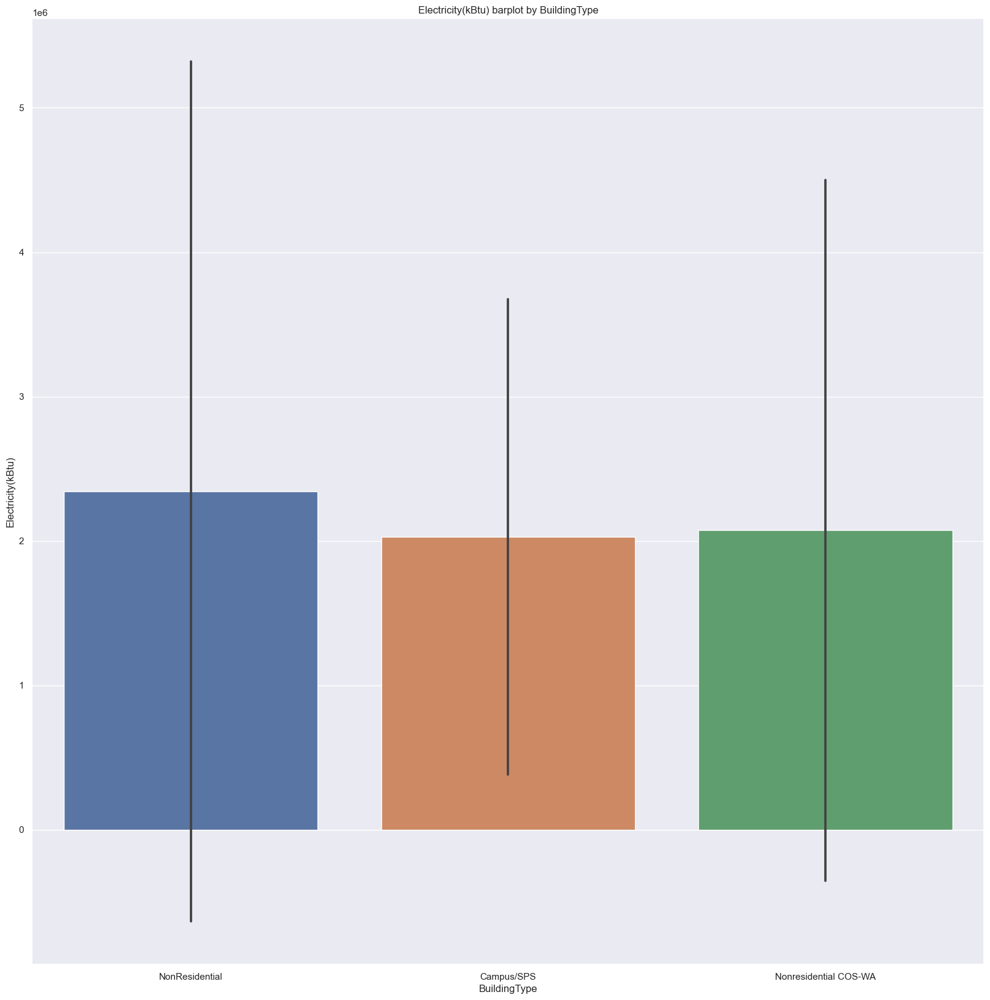

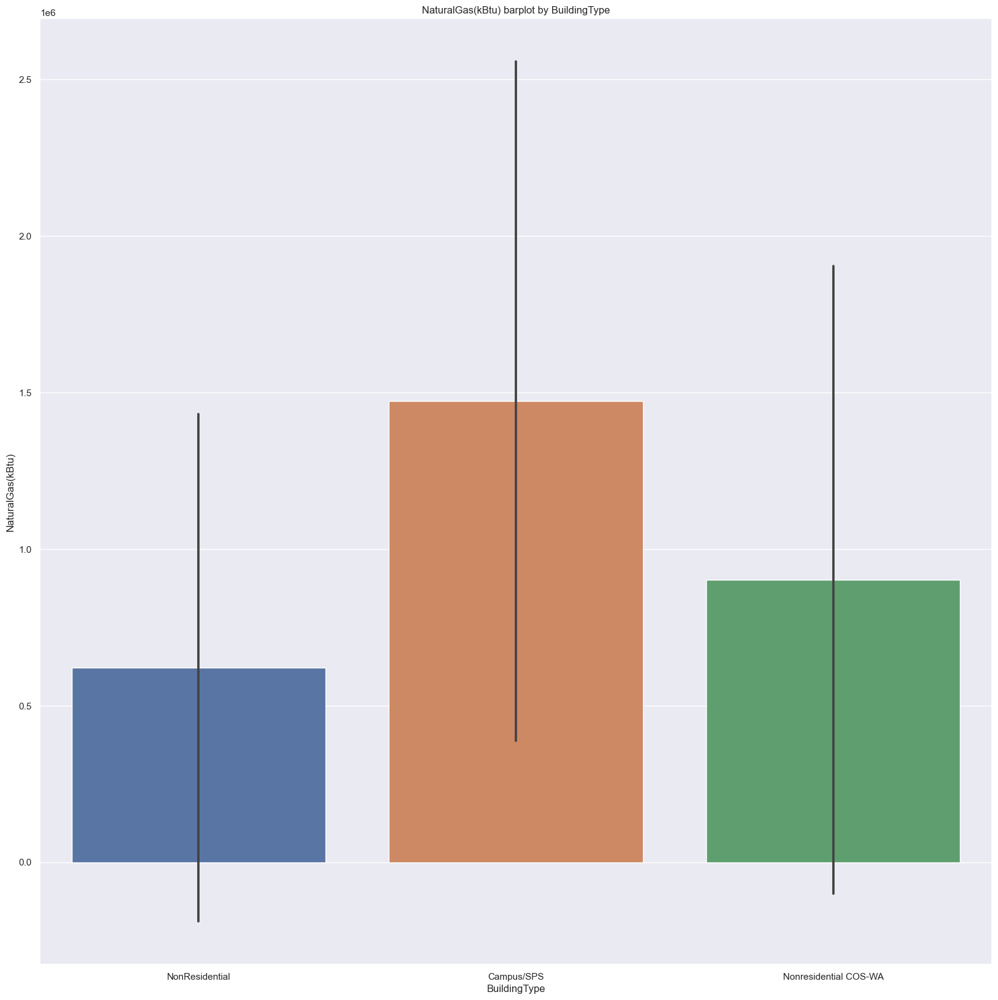

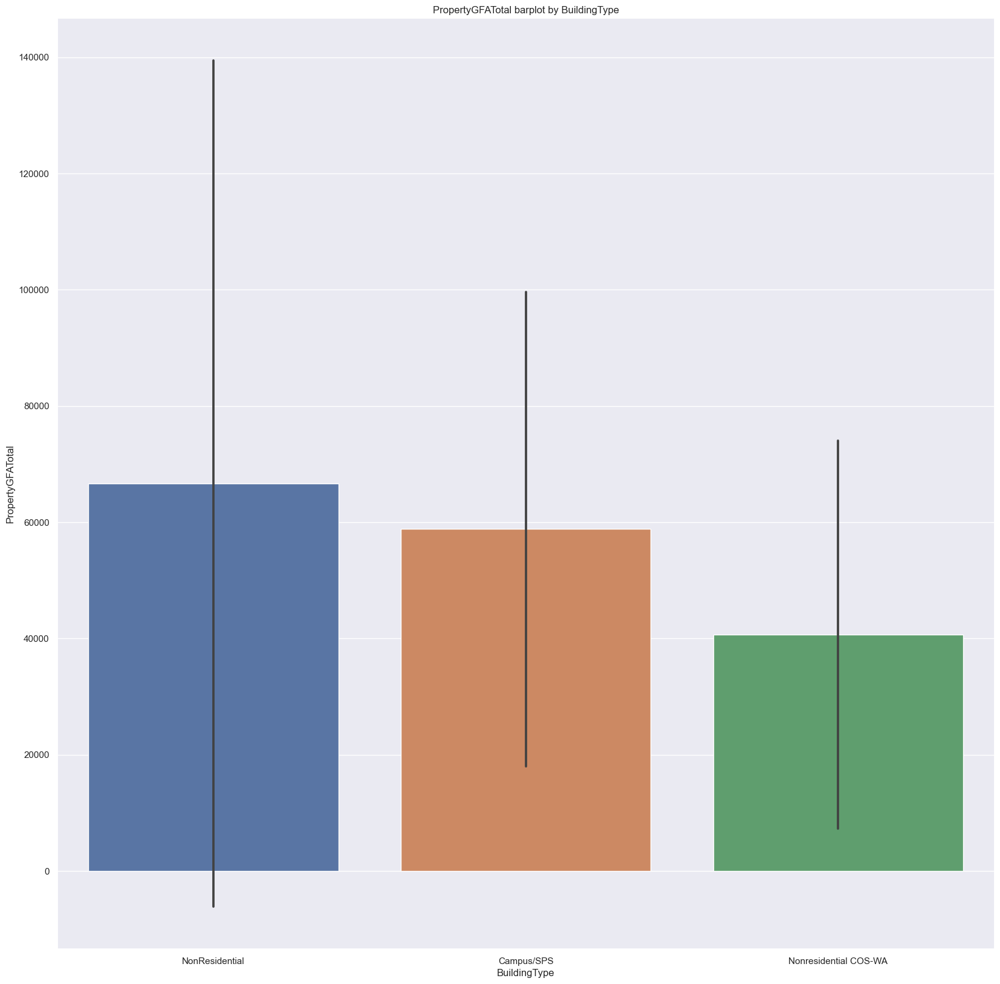

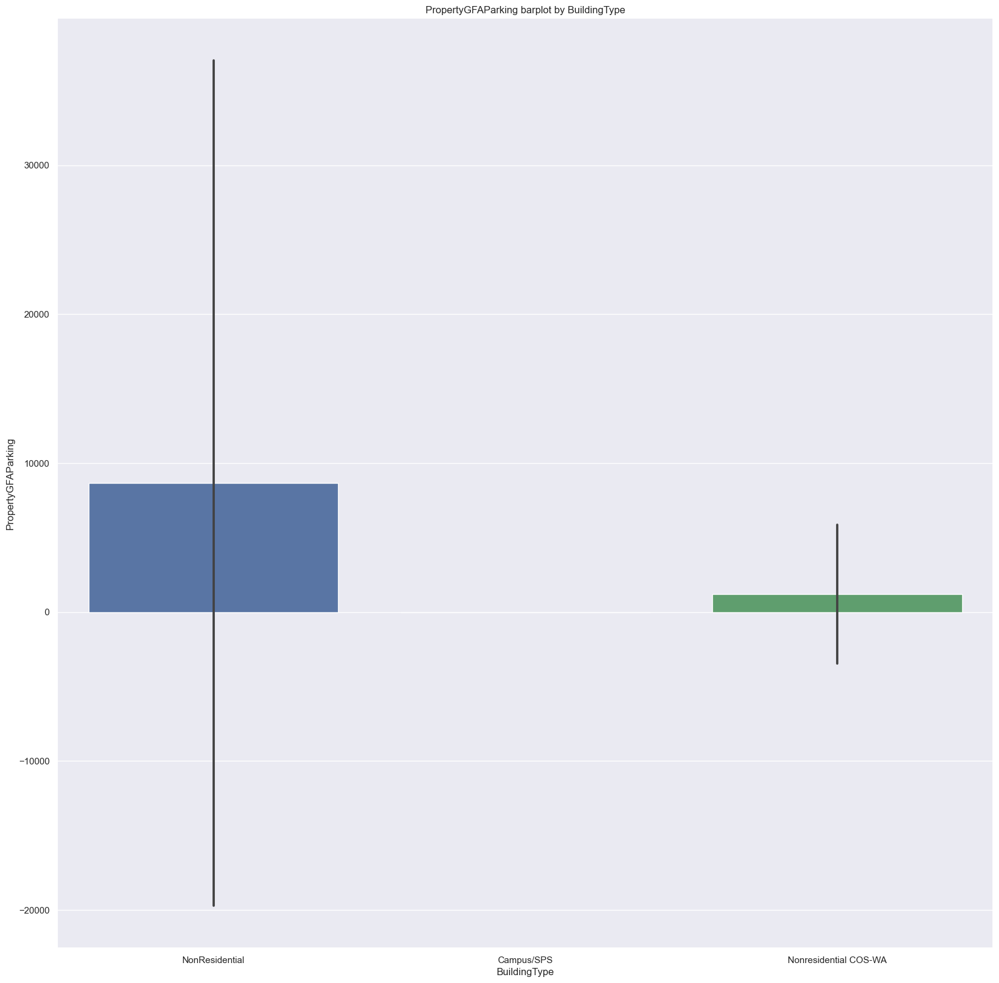

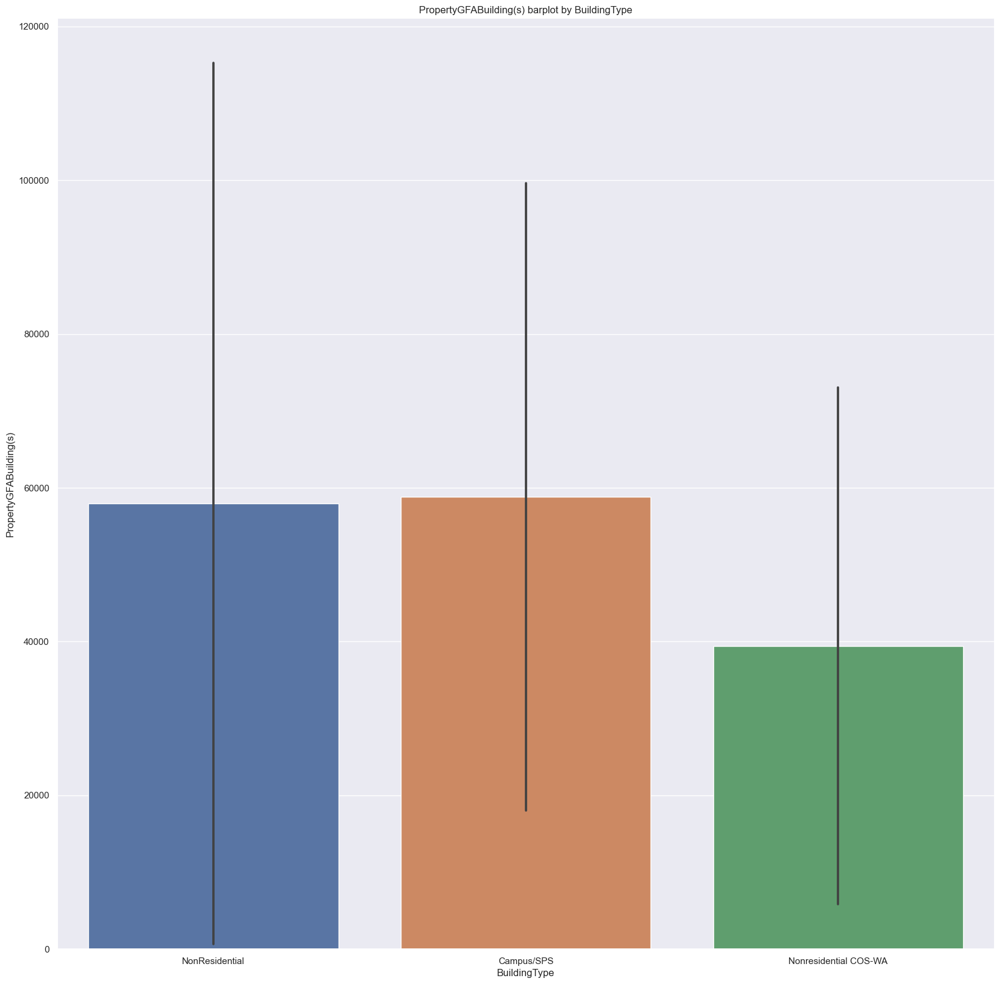

In [120]:
barplot(df, columns, x="BuildingType")

In [121]:
categorical_features = ['BuildingType', 'PrimaryPropertyType',  'Neighborhood','ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']

<a id="vp"></a>
### <span style="color:#33afff  ;"> Violin plot </span>

In [122]:
def violinplot(df, x, y, showfliers=True):
    order = df.groupby(y)[x].mean().head(10).sort_values(ascending=False).index
    
    if len(df[y].unique().tolist()) < 30:
        plt.figure(figsize=(10,10))
    else:
        plt.figure(figsize=(15,10))
    sns.violinplot(x=x,
                y=y,
                orient='h',
                order=order,
                showfliers=showfliers,
                data=df,
                showmeans=True, 
                meanprops={"marker":"o",
                           "markerfacecolor":"white",
                           "markeredgecolor":"black",
                           "markersize":"10"})

    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlabel(x, size=15)
    plt.ylabel(y, size=15)
    plt.title(f"{x} by {y}", fontsize=18);

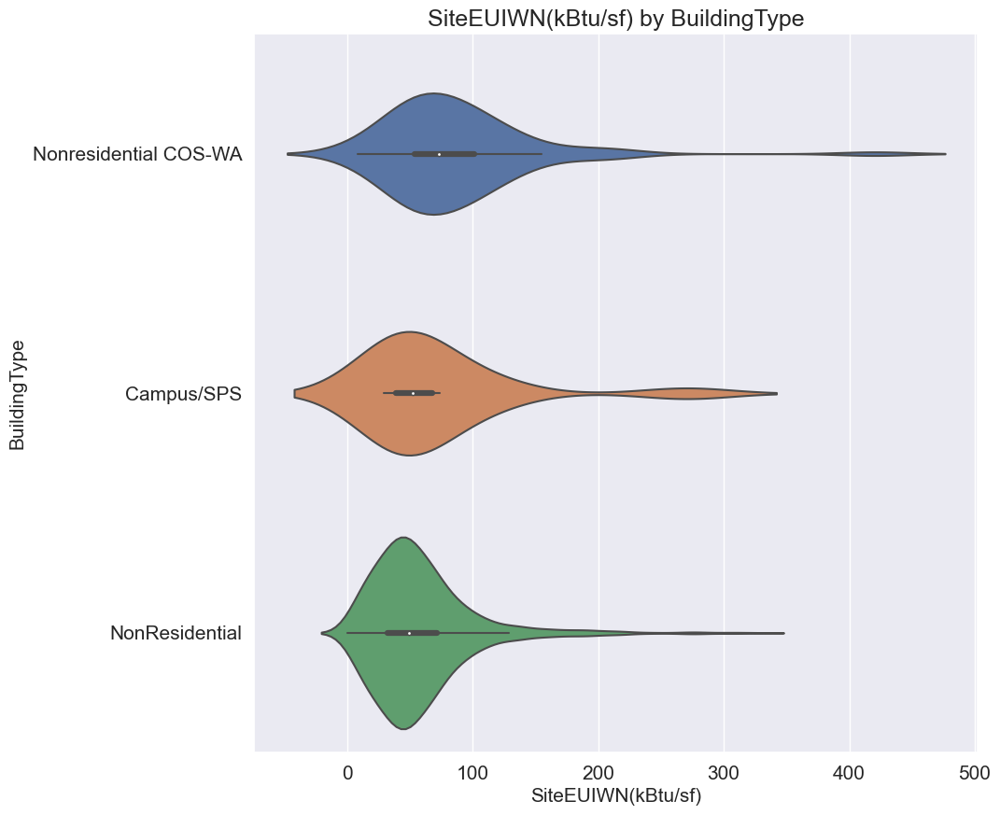

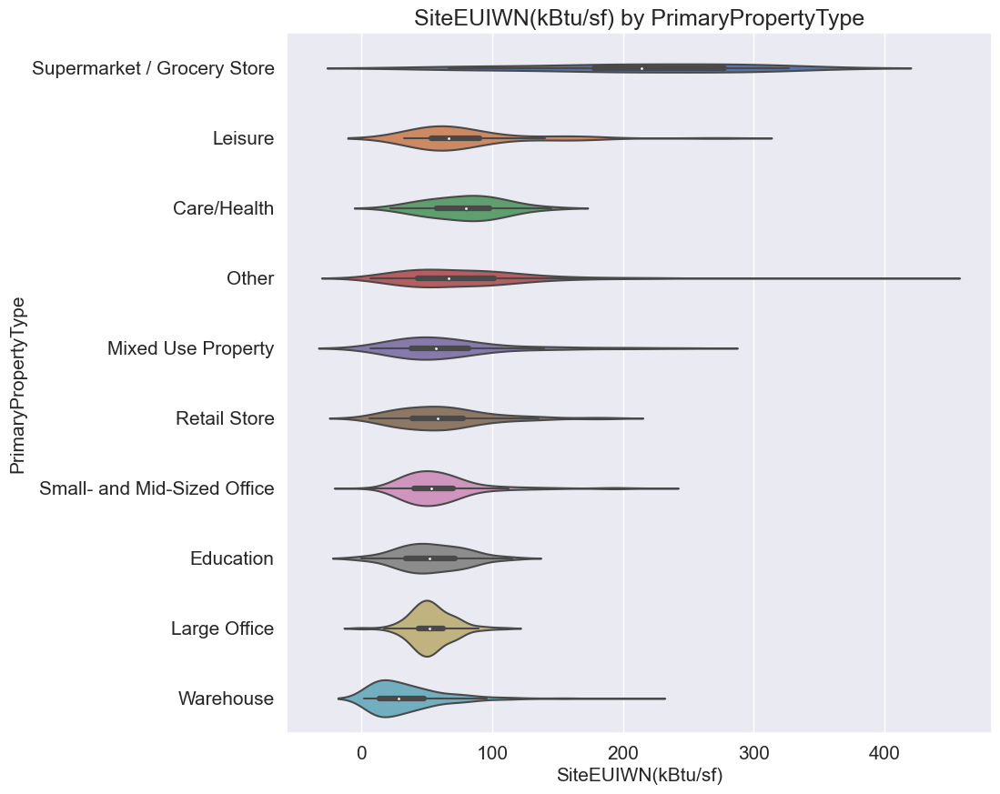

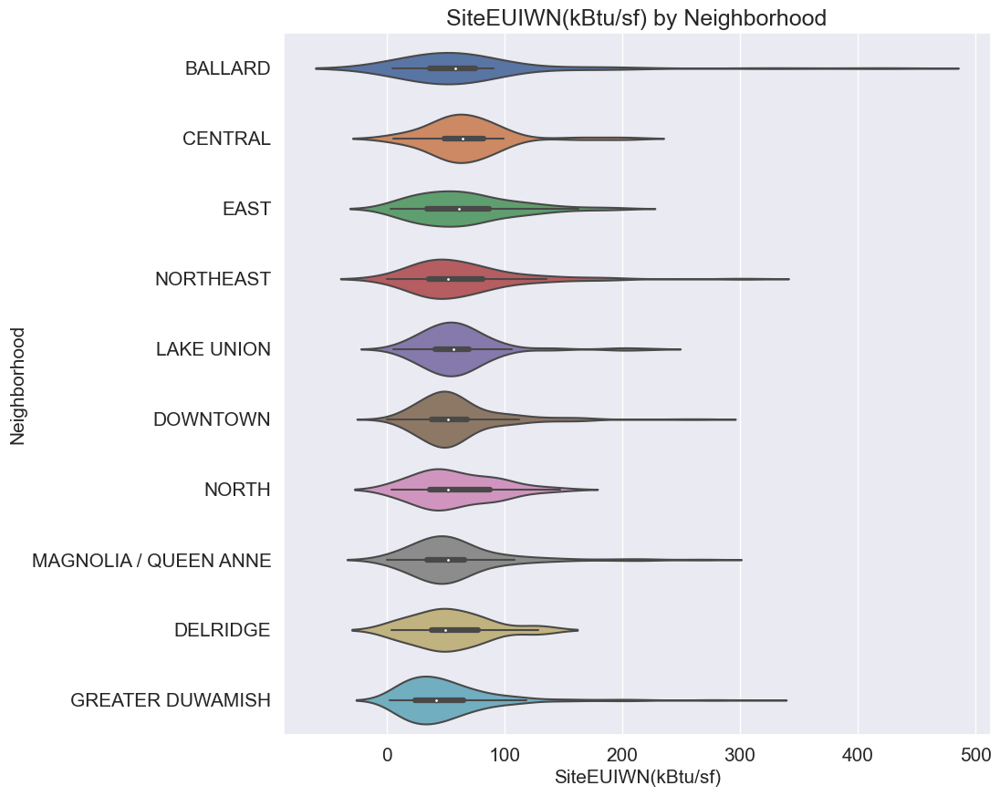

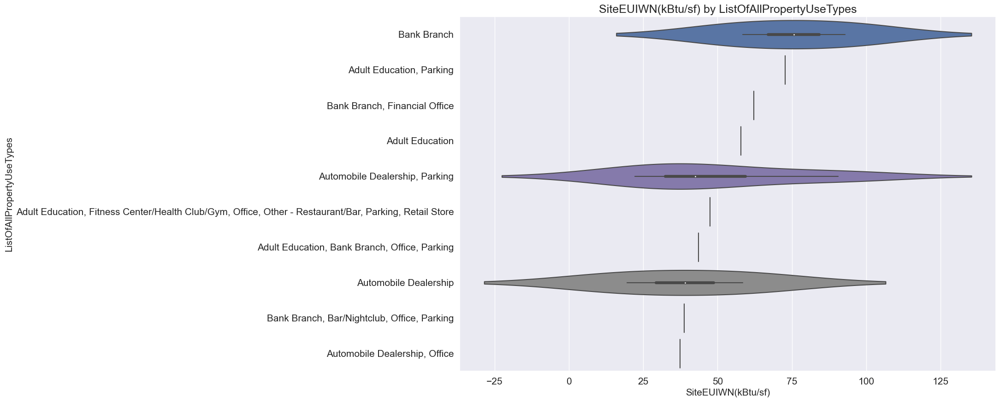

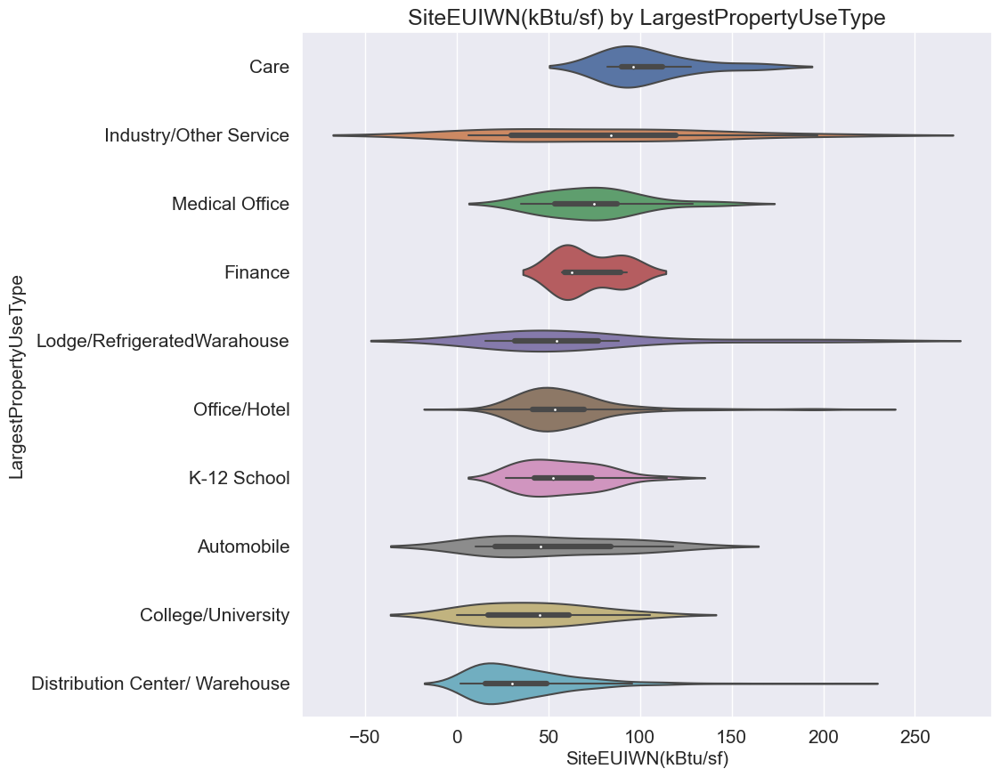

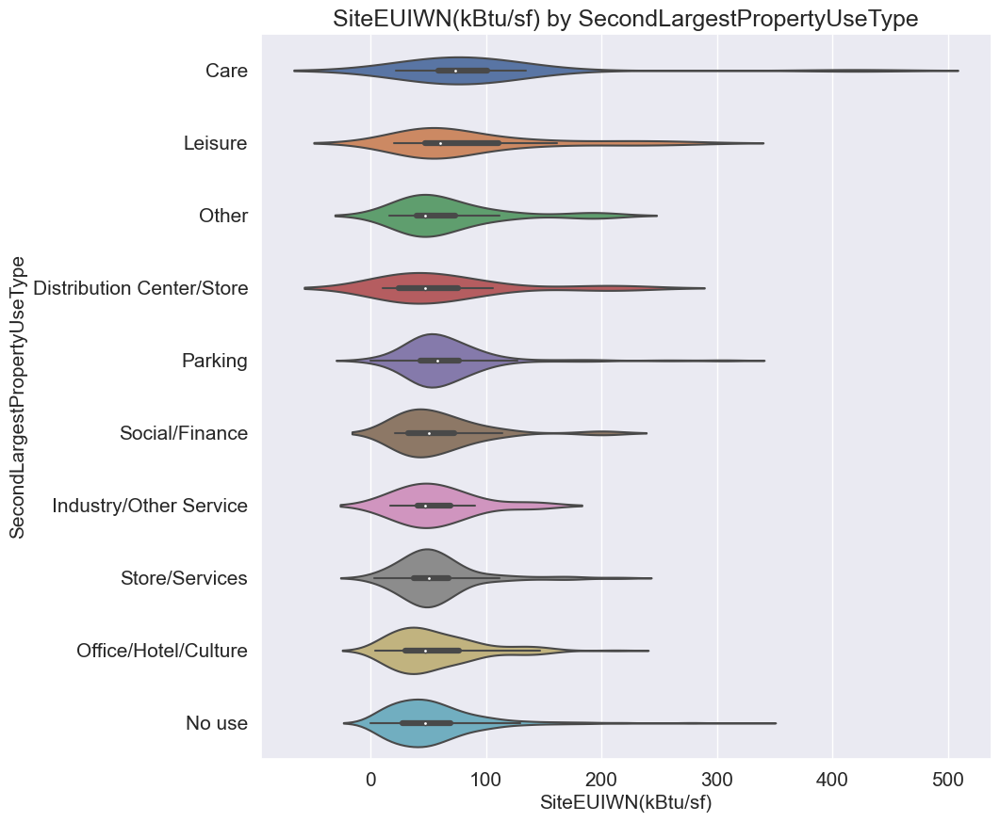

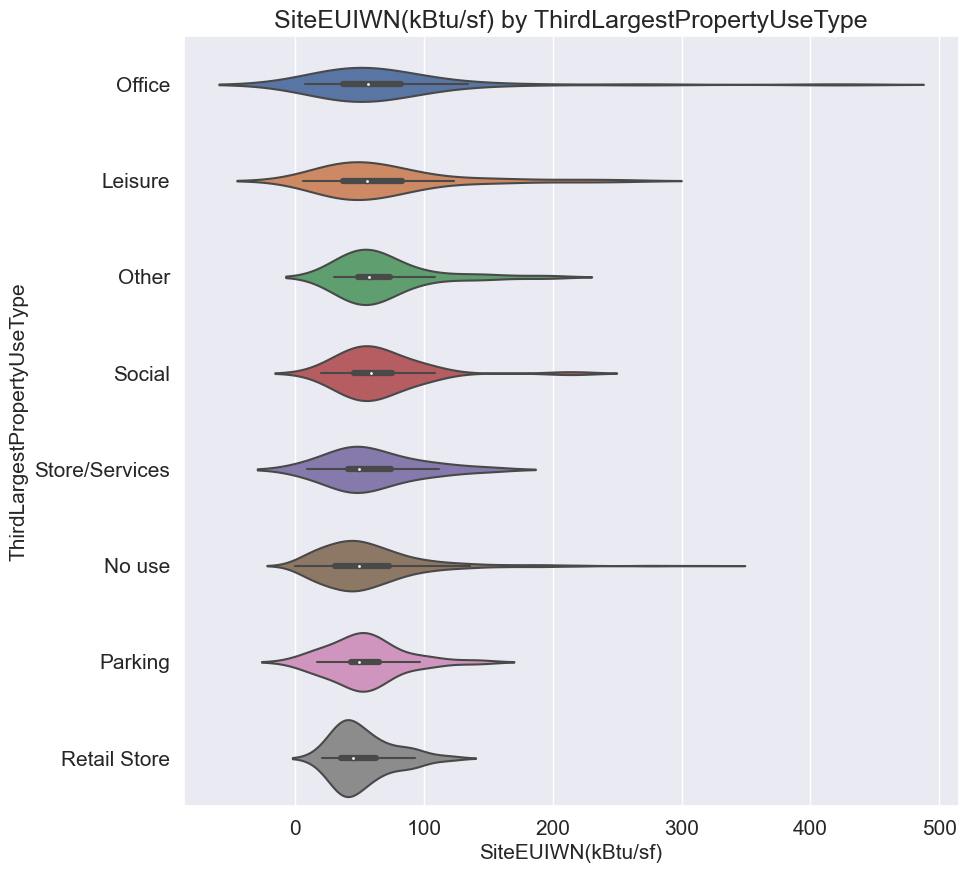

In [123]:
for col in categorical_features:
    violinplot(df=df, x='SiteEUIWN(kBtu/sf)', y=col)

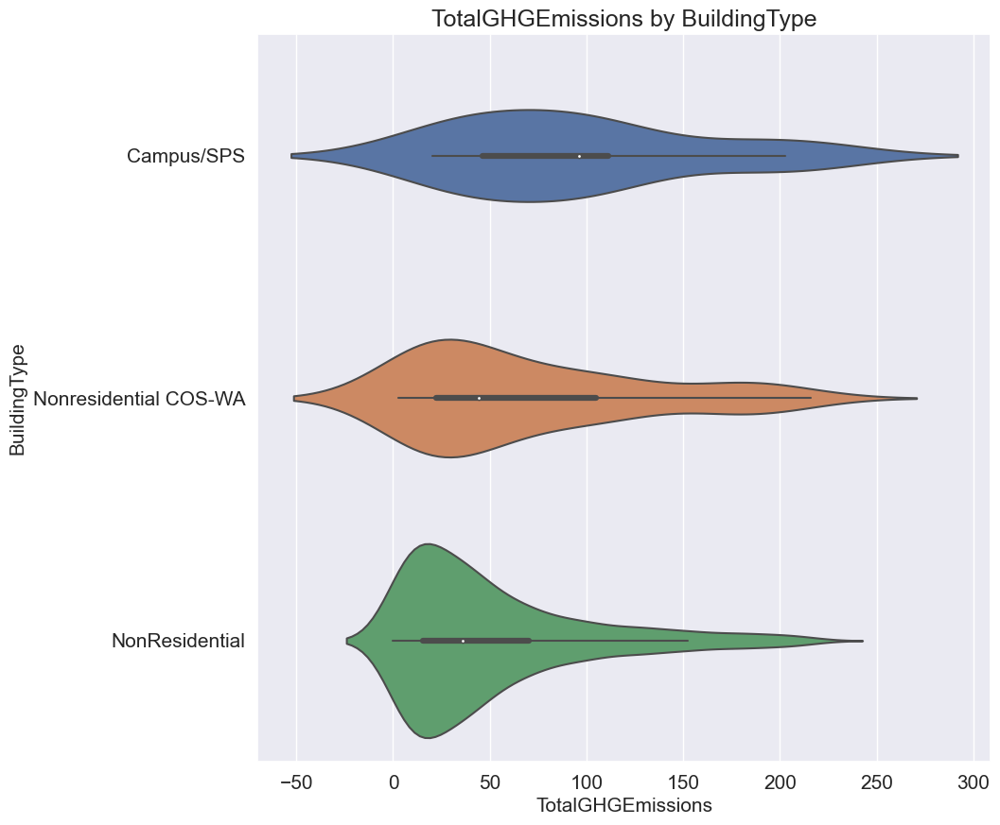

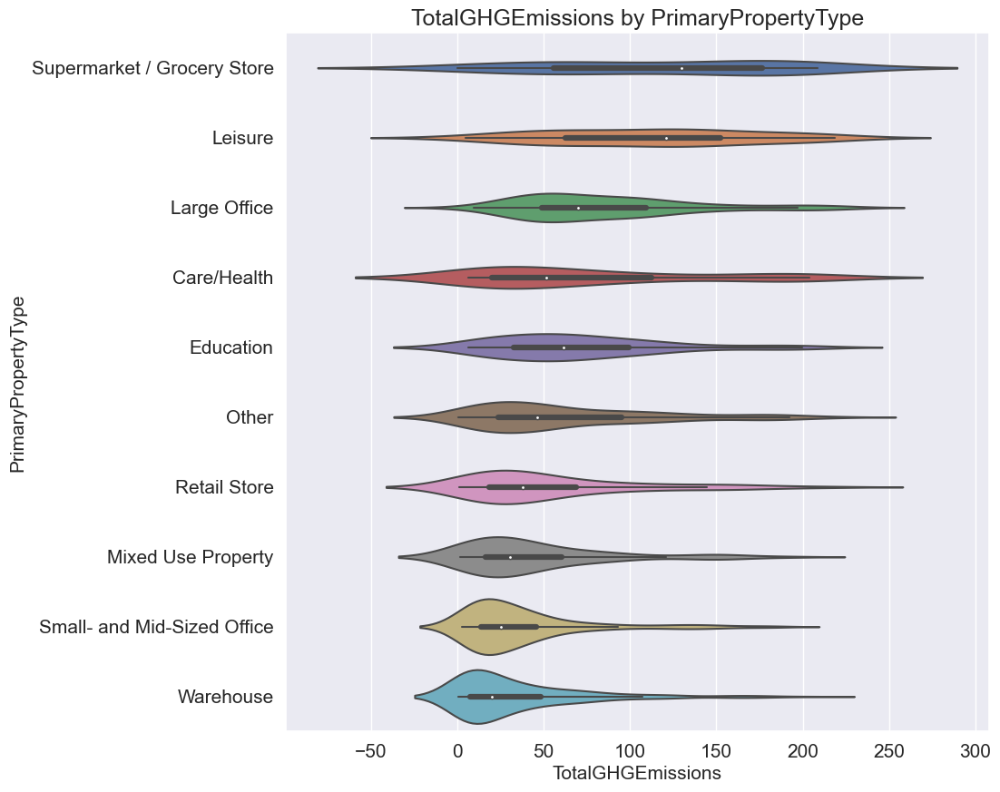

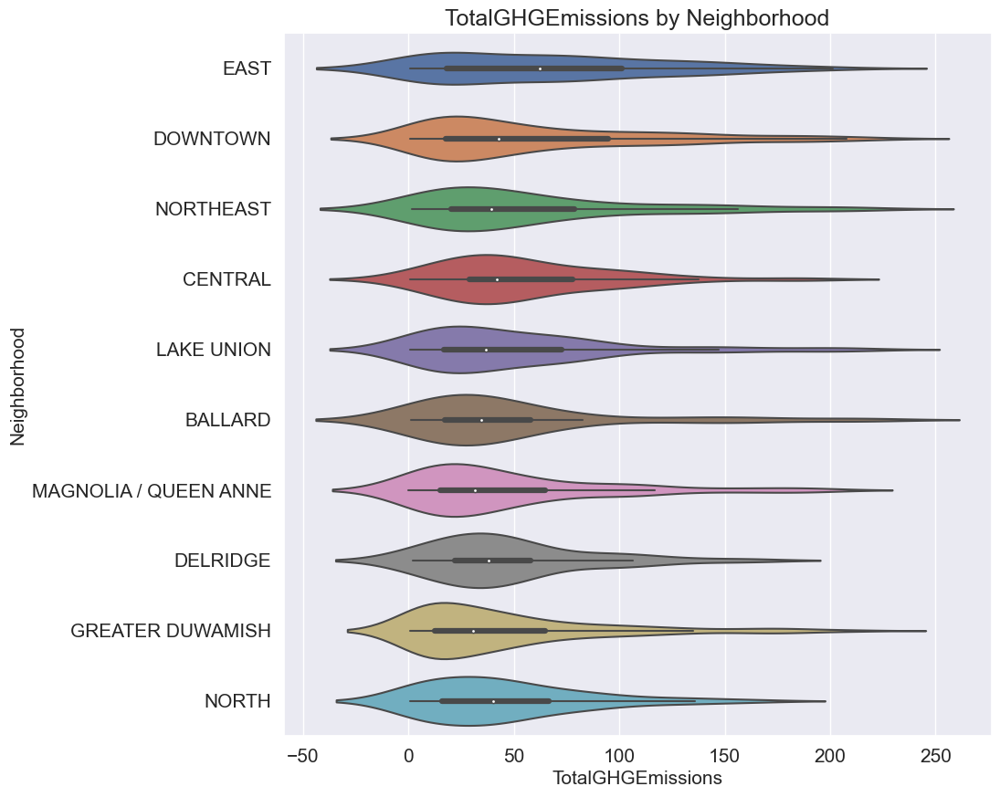

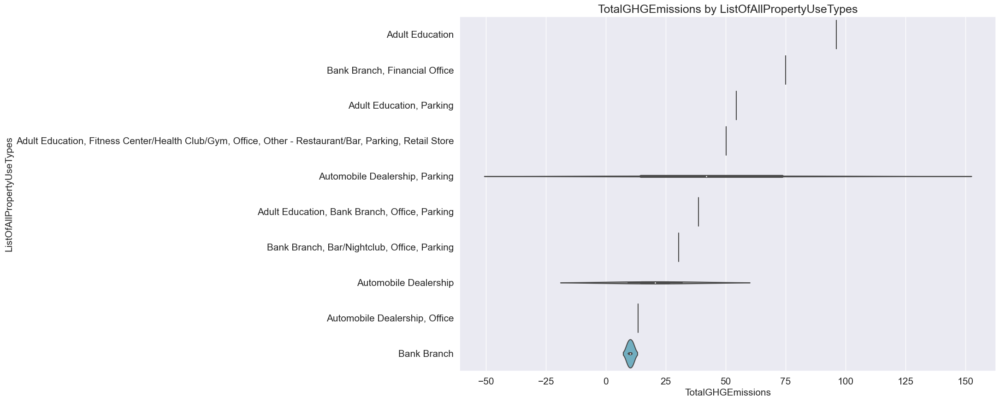

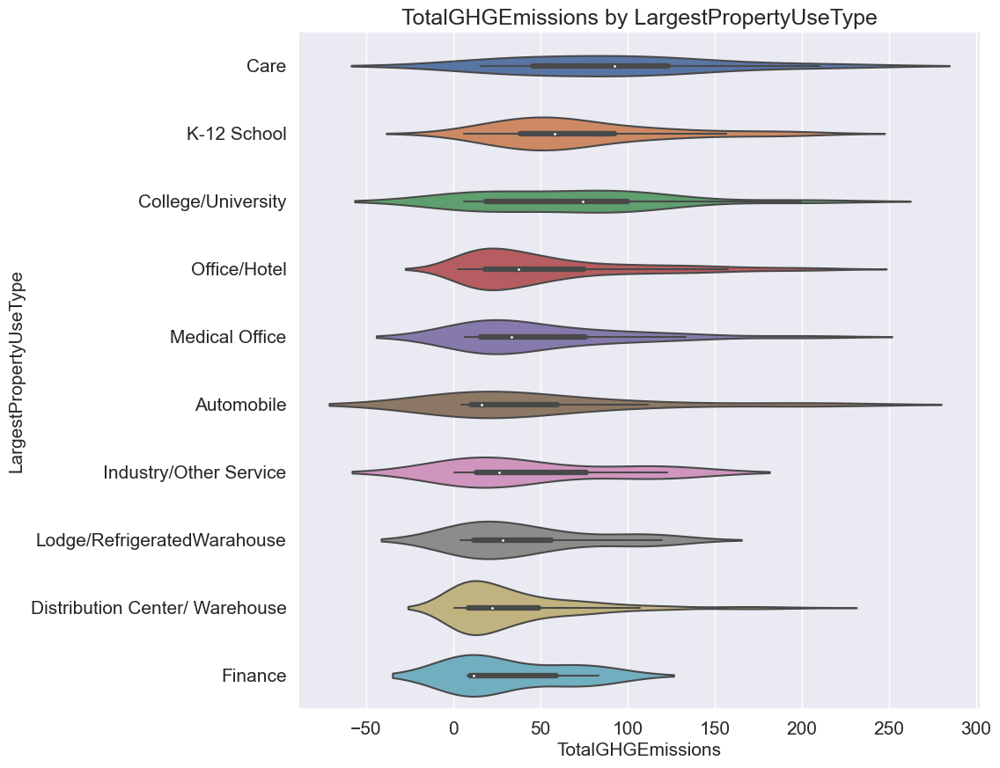

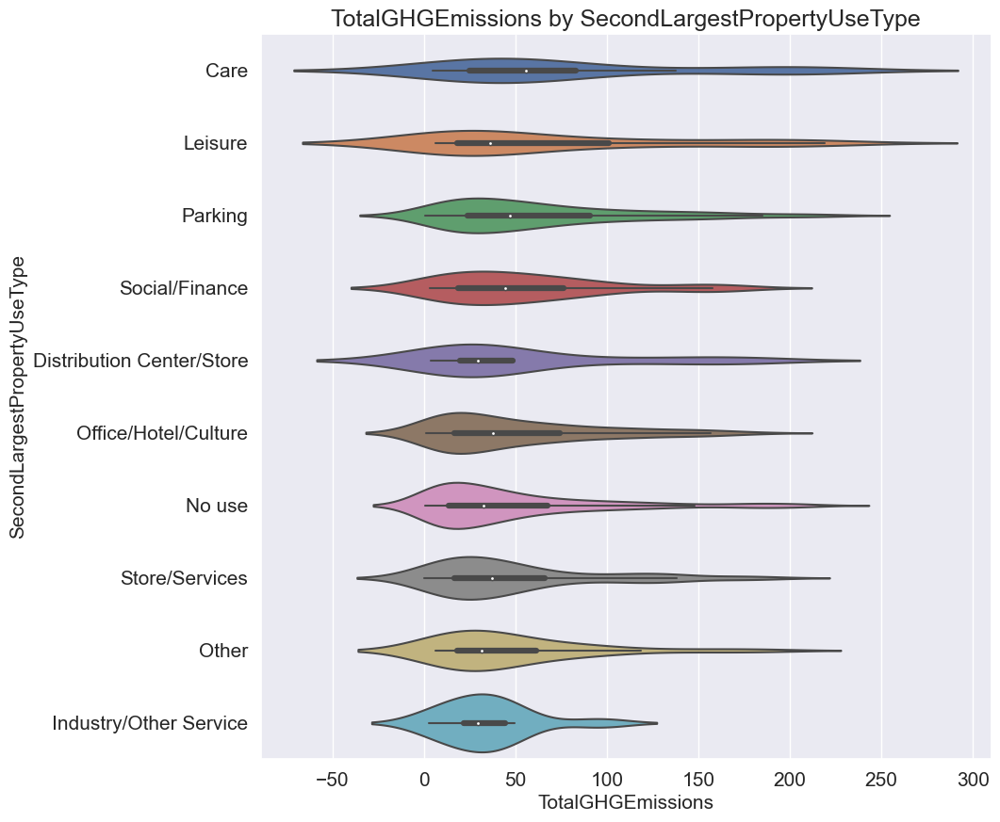

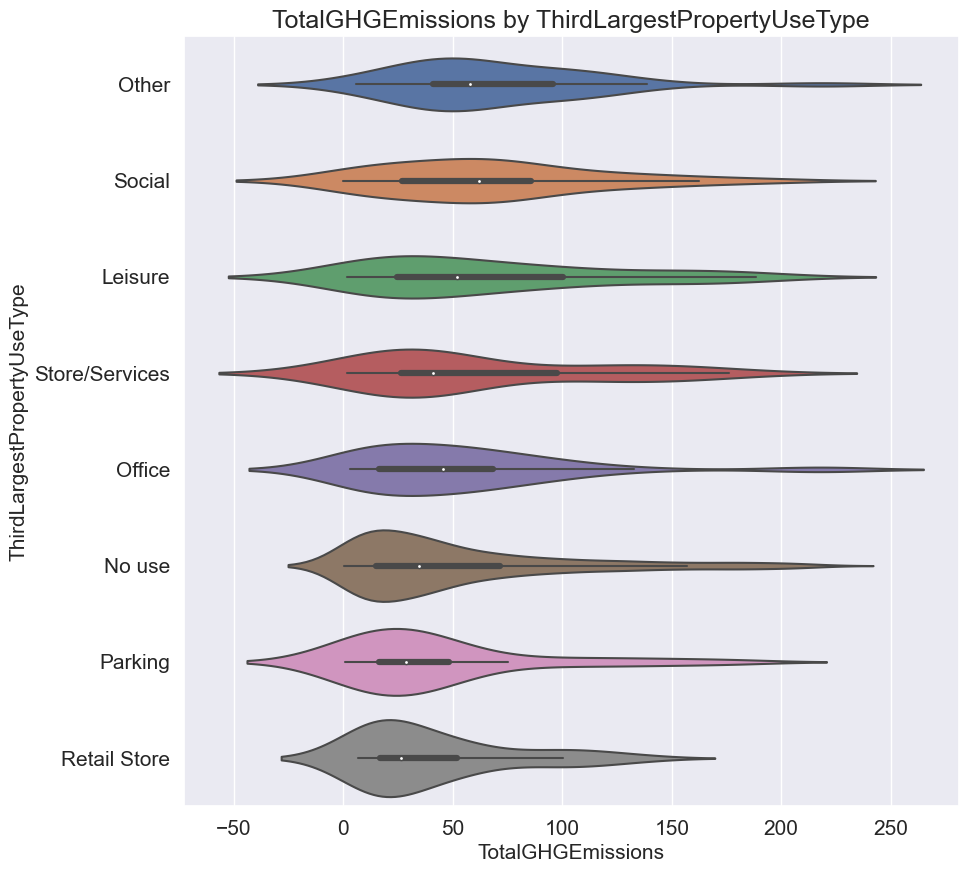

In [124]:
for col in categorical_features:
    violinplot(df=df, x='TotalGHGEmissions', y=col)

<a href="#toc" role="button" aria-pressed="true" >⬆️ Back to Table of Contents ⬆️</a>

<a id="gv"></a>
### <span style="color:#33afff  ;"> Geographic visualisation </span>

In [125]:
address = 'Seattle'

geolocator = Nominatim(user_agent="seattle_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
seattle_center=[latitude, longitude]
print('The geograpical coordinate of Seattle are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Seattle are 47.6038321, -122.330062.


In [126]:
seattle_boroughs_url = "https://raw.githubusercontent.com/blackmad/neighborhoods/master/seattle.geojson"
seattle_boroughs = requests.get(seattle_boroughs_url).json()

def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

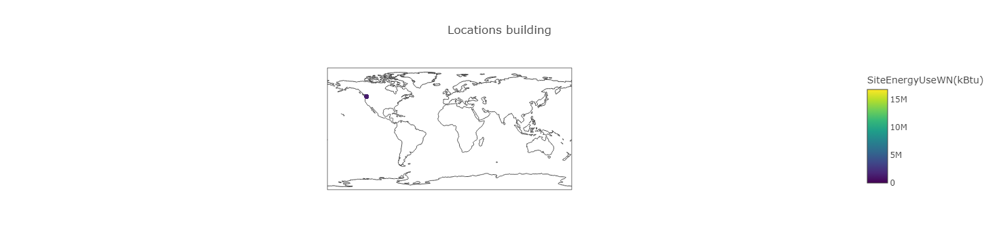

In [127]:
m = px.scatter_geo(df, lat='Latitude', lon='Longitude',
                 color='SiteEnergyUseWN(kBtu)', 
                 hover_data=['Neighborhood','TotalGHGEmissions'],
                 title='Locations building')

m.show()

In [128]:
df_folium = df[['Latitude', 'Longitude', 'SiteEnergyUseWN(kBtu)']].dropna()
heat = df[['SiteEnergyUseWN(kBtu)','TotalGHGEmissions']].dropna()
data_map = df_folium.values.tolist()

In [129]:
# create map of Seattles using latitude and longitude values
map_seattle = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
for lat, lng, consumption, neighborhood in zip(df['Latitude'], df['Longitude'], df['SiteEnergyUseWN(kBtu)'], df['Neighborhood']):
    label = '{},\n {} kBtu'.format(neighborhood, consumption)
    label = folium.Popup(label, parse_html=True)
   
    folium.CircleMarker(
        [lat, lng],
        radius=10,
        popup=label,
        color='blue',
        fill=False,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False
        ).add_to(map_seattle)  

#HeatMap(data_map).add_to(map_seattle)
    
map_seattle

In [130]:
import folium
map_seattle = folium.Map(llocation=seattle_center, zoom_start=13)

#Clusters


marker_cluster = folium.plugins.MarkerCluster().add_to(map_seattle)


for lat, lng, consumption, neighborhood in zip(df['Latitude'], df['Longitude'], df['SiteEnergyUseWN(kBtu)'], df['Neighborhood']):
    label = '{},\n {} kBtu'.format(neighborhood, consumption)
    label = folium.Popup(label, parse_html=True)
    folium.Marker(location=[lat, lng], popup=label).add_to(marker_cluster)
folium.GeoJson(seattle_boroughs, style_function=boroughs_style, name='geojson').add_to(map_seattle)

map_seattle

In [131]:
map_seattle = folium.Map(location=seattle_center, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_seattle) #cartodbpositron cartodbdark_matter
HeatMap(data_map).add_to(map_seattle)
folium.Marker(seattle_center).add_to(map_seattle)
folium.GeoJson(seattle_boroughs, style_function=boroughs_style, name='geojson').add_to(map_seattle)
map_seattle

<a href="#toc" role="button" aria-pressed="true" >⬆️ Back to Table of Contents ⬆️</a>